In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

data=pd.read_csv('openpowerlifting.csv')
df=pd.DataFrame(data)

print(df.info())
print(df.head())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 386414 entries, 0 to 386413
Data columns (total 17 columns):
MeetID            386414 non-null int64
Name              386414 non-null object
Sex               386414 non-null object
Equipment         386414 non-null object
Age               147147 non-null float64
Division          370571 non-null object
BodyweightKg      384012 non-null float64
WeightClassKg     382602 non-null object
Squat4Kg          1243 non-null float64
BestSquatKg       298071 non-null float64
Bench4Kg          1962 non-null float64
BestBenchKg       356364 non-null float64
Deadlift4Kg       2800 non-null float64
BestDeadliftKg    317847 non-null float64
TotalKg           363237 non-null float64
Place             385322 non-null object
Wilks             362194 non-null float64
dtypes: float64(10), int64(1), object(6)
memory usage: 50.1+ MB
None
   MeetID              Name Sex   Equipment   Age     Division  BodyweightKg  \
0       0  Angie Belk Terry   F       Wr

Imported pandas, numpy, and matplotlib.pyplot and pulled in powerlifting data to create dataframe. Checked out the head and info for the dataframe showing 386,414 entries and 17 columns.

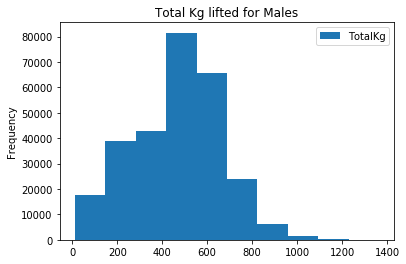

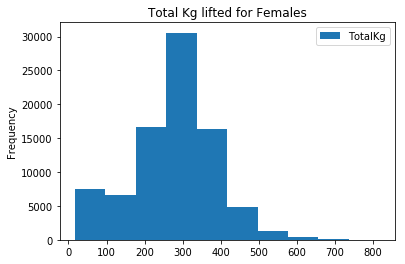

In [2]:
#pull male and female data individually
df_male = df[df['Sex']=='M']
df_female = df[df['Sex']=='F']

#create histogram for male and female TotalKg lifted
df_male.plot(kind='hist', y='TotalKg', title='Total Kg lifted for Males')
plt.show()
df_female.plot(kind='hist', y='TotalKg', title='Total Kg lifted for Females')
plt.show()

histograms of male and female total kg lifted.

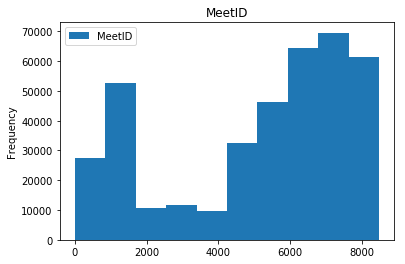

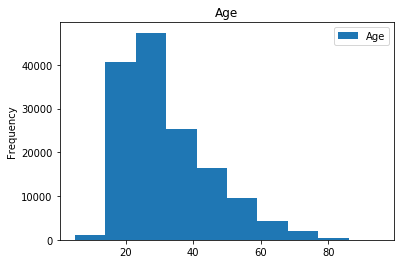

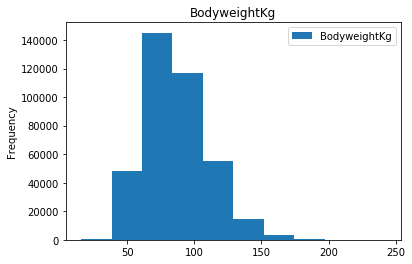

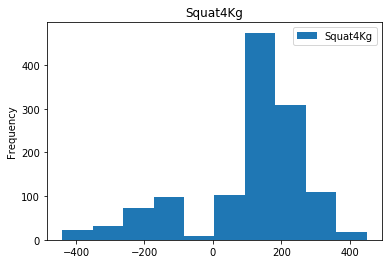

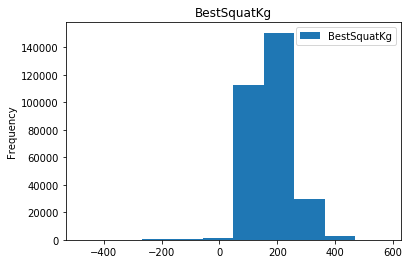

...

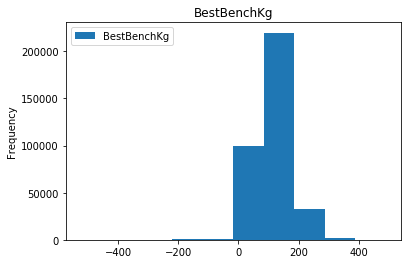

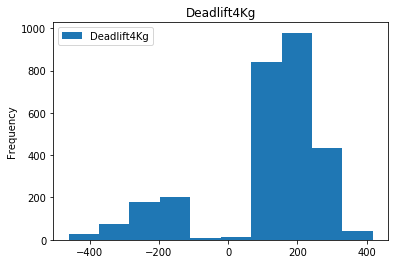

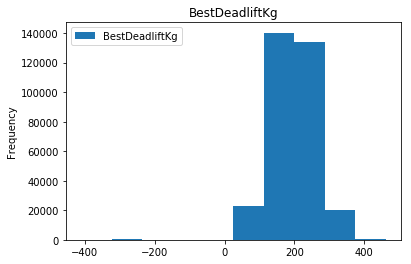

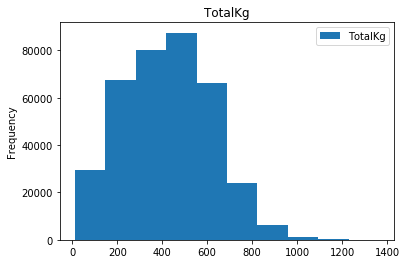

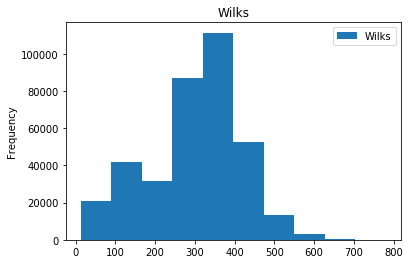

In [3]:
for x in df.columns:
    try:
        df.plot(y=x, kind='hist', title=x)
    except:
        pass
    plt.show()
    

Histograms for each numeric column in dataframe.  Used try/except logic to skip non-numeric columns.  Interesting to note that some lifts have negative values!

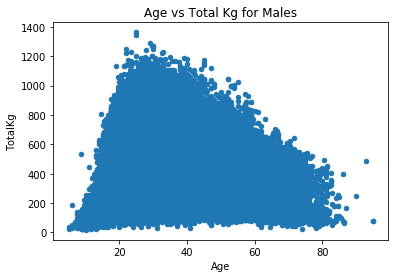

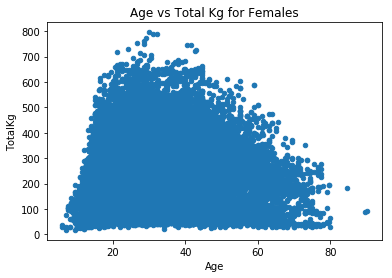

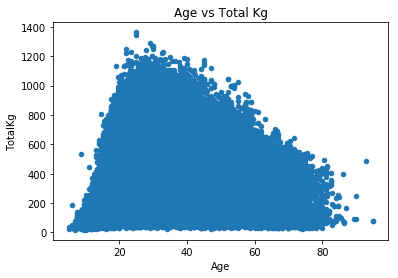

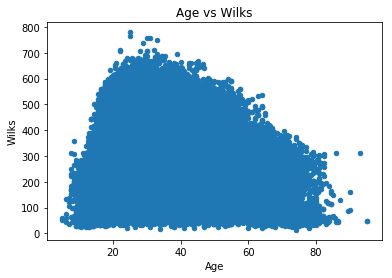

In [4]:
#create scatter plots of age vs total kg for male and female
df_male.plot(x='Age', y='TotalKg', kind='scatter', title='Age vs Total Kg for Males')
df_female.plot(x='Age', y='TotalKg', kind='scatter', title='Age vs Total Kg for Females')
df.plot(x='Age', y='TotalKg', kind='scatter', title='Age vs Total Kg')
df.plot(x='Age', y='Wilks', kind='scatter', title='Age vs Wilks')
plt.show()

These are plots of age vs total kg lifted and age vs wilks score.  What we can see is (as expected) the total amount lifted peaks around 20-30 and begins to go down after 40.

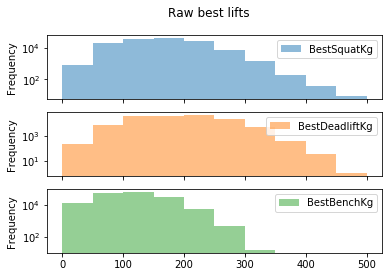

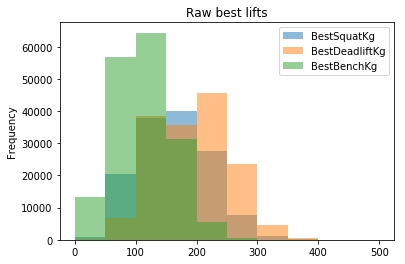

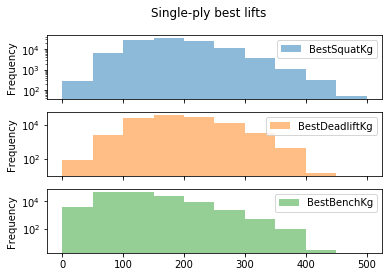

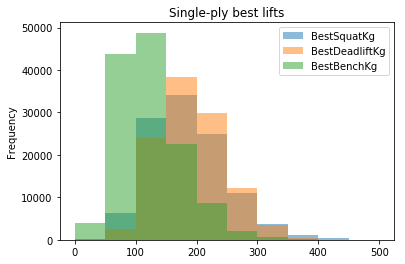

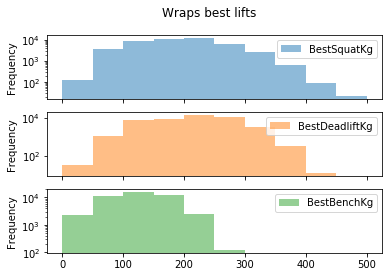

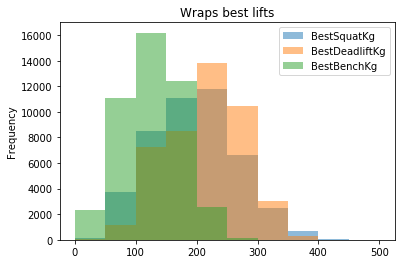

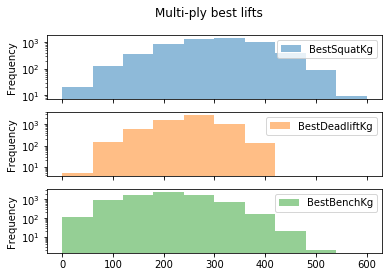

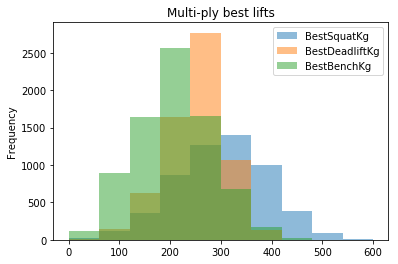

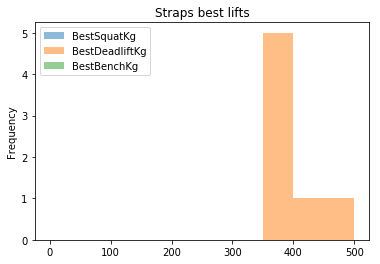

[6.0, 4.0]
10.0


In [5]:
# separate lifters by what equipment they used
df['Equipment'].value_counts()

raw = df[df['Equipment']=='Raw']
single = df[df['Equipment']=='Single-ply']
wraps = df[df['Equipment']=='Wraps']
multi = df[df['Equipment']=='Multi-ply']
straps = df[df['Equipment']=='Straps']

# plot best squat, bench, and deadlift for each equipment type
raw[['BestSquatKg', 'BestDeadliftKg', 'BestBenchKg']].plot(kind='hist', title='Raw best lifts', alpha=.5, range=(0,500), logy=True, subplots=True)
raw[['BestSquatKg', 'BestDeadliftKg', 'BestBenchKg']].plot(kind='hist', title='Raw best lifts', alpha=.5, range=(0,500))
single[['BestSquatKg', 'BestDeadliftKg', 'BestBenchKg']].plot(kind='hist', title='Single-ply best lifts', alpha=.5, range=(0,500), logy=True, subplots=True)
single[['BestSquatKg', 'BestDeadliftKg', 'BestBenchKg']].plot(kind='hist', title='Single-ply best lifts', alpha=.5, range=(0,500))
wraps[['BestSquatKg', 'BestDeadliftKg', 'BestBenchKg']].plot(kind='hist', title='Wraps best lifts', alpha=.5, range=(0,500), logy=True, subplots=True)
wraps[['BestSquatKg', 'BestDeadliftKg', 'BestBenchKg']].plot(kind='hist', title='Wraps best lifts', alpha=.5, range=(0,500))
multi[['BestSquatKg', 'BestDeadliftKg', 'BestBenchKg']].plot(kind='hist', title='Multi-ply best lifts', alpha=.5, range=(0,600), logy=True, subplots=True)
multi[['BestSquatKg', 'BestDeadliftKg', 'BestBenchKg']].plot(kind='hist', title='Multi-ply best lifts', alpha=.5, range=(0,600))
straps[['BestSquatKg', 'BestDeadliftKg', 'BestBenchKg']].plot(kind='hist', title='Straps best lifts', alpha=.5, range=(0,500))
plt.show()
#print(plt.rcParams['figure.figsize'])
#print(plt.rcParams['font.size'])

These are histograms for each type of equipment used showing the best lifts.  We can see that the multi-ply equipment yeilded the best results overall.  We had to use the range option to toss negative values.  We used the subplots option to separate historgrams for each equipment type as well.

            BestSquatKg  BestDeadliftKg  BestBenchKg
Equipment                                           
Multi-ply        573.79          412.77        488.5
Raw              477.50          460.40        335.0
Single-ply       505.00          420.00        410.0
Straps              NaN          450.00          NaN
Wraps            500.00          440.00        290.3


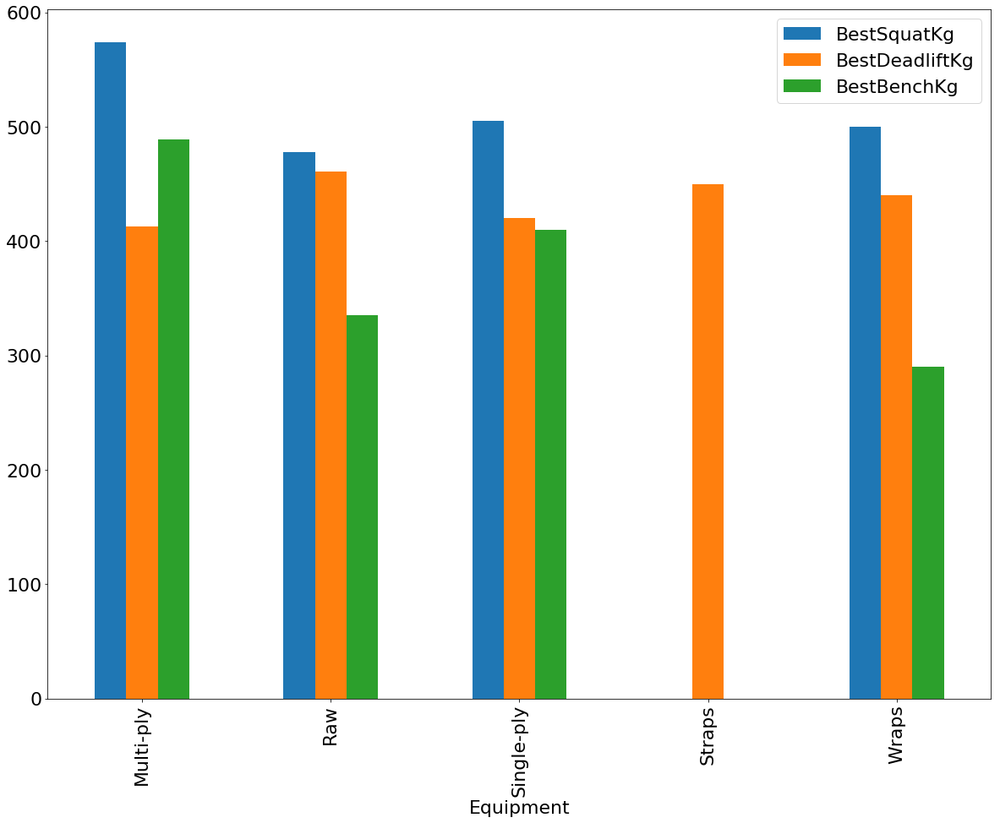

In [6]:
print(df.groupby('Equipment')['BestSquatKg', 'BestDeadliftKg', 'BestBenchKg'].max())
#plt.figure(figsize=(25,15)) - this did not work this time???
#fig_size = plt.rcParams["figure.figsize"]
#fig_size[0] = 25
#fig_size[1] = 15
#plt.rc('xtick', labelsize=20)
#plt.rc('ytick', labelsize=20)
plt.rcParams.update({'font.size': 22})
plt.rcParams['figure.figsize'] = 20,15

df.groupby('Equipment')['BestSquatKg', 'BestDeadliftKg', 'BestBenchKg'].max().plot(kind='bar')
plt.show()

#plt.rcdefaults()
plt.rcParams['figure.figsize'] = 6,4
plt.rcParams.update({'font.size': 10})

Bar chart of the max lifts of each best lift category for each type of equipment.  Surprizingly, we see that the raw deadlift was the highest.

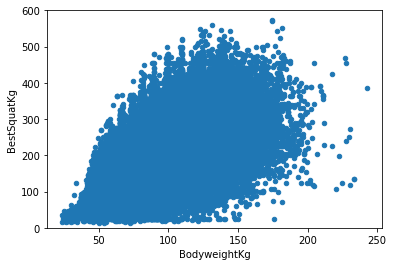

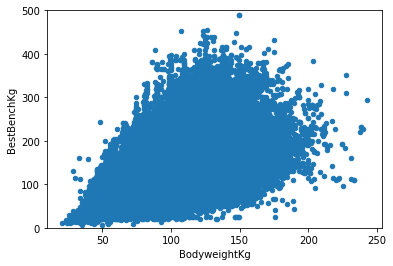

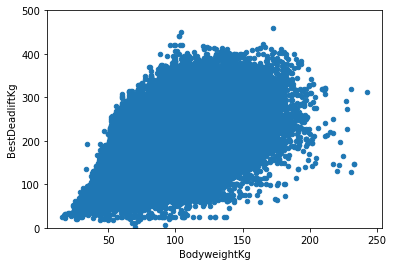

In [7]:
#create plots of body weight vs best squat, bench, and deadlift

df.plot(x='BodyweightKg', y='BestSquatKg', kind='scatter')
plt.ylim(0,600)
df.plot(x='BodyweightKg', y='BestBenchKg', kind='scatter')
plt.ylim(0,500)
df.plot(x='BodyweightKg', y='BestDeadliftKg', kind='scatter')
plt.ylim(0,500)
plt.show()

#print(plt.rcParams['figure.figsize'])
#print(plt.rcParams['font.size'])

Scatter plots of best lifts vs bodyweight.  As expected the bigger guys were able to lift more weight. We needed to adjust the ylimit to eliminate negative values.

In [8]:
#find out who had best lifts
bench = df['BestBenchKg'].max()
person_bench = df.loc[df['BestBenchKg'].idxmax(),'Name']
squat = df['BestSquatKg'].max()
person_squat = df.loc[df['BestSquatKg'].idxmax(), 'Name']
deadlift = df['BestDeadliftKg'].max()
person_deadlift = df.loc[df['BestDeadliftKg'].idxmax(), 'Name']

print('{} had the best bench at {}Kg'.format(person_bench, bench))
print('{} had the best bench at {}Kg'.format(person_squat, bench))
print('{} had the best bench at {}Kg'.format(person_deadlift, bench))

Tiny Meeker had the best bench at 488.5Kg
Donnie Thompson had the best bench at 488.5Kg
Benedikt Magnusson had the best bench at 488.5Kg


These are the top lifters for each lift.

In [9]:
print(df.loc[df['BestBenchKg'].idxmax()])
print(df.loc[df['BestSquatKg'].idxmax()])
print(df.loc[df['BestDeadliftKg'].idxmax()])

MeetID                     5573
Name                Tiny Meeker
Sex                           M
Equipment             Multi-ply
Age                          41
Division          Masters 40-44
BodyweightKg             149.23
WeightClassKg              140+
Squat4Kg                    NaN
BestSquatKg                 NaN
Bench4Kg                    NaN
BestBenchKg               488.5
Deadlift4Kg                 NaN
BestDeadliftKg              NaN
TotalKg                   488.5
Place                         1
Wilks                    270.48
Name: 166346, dtype: object
MeetID                       5479
Name              Donnie Thompson
Sex                             M
Equipment               Multi-ply
Age                           NaN
Division                      Pro
BodyweightKg               174.69
WeightClassKg                140+
Squat4Kg                      NaN
BestSquatKg                573.79
Bench4Kg                      NaN
BestBenchKg                430.91
Deadlift4Kg         

Top lifter data

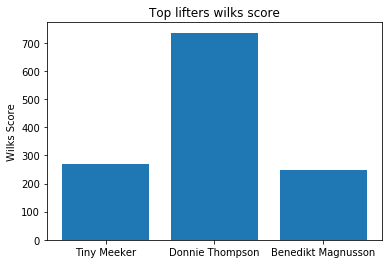

In [10]:
#bar plot of best lifters wilks score - wilks score is a measure used to compare lifters without the bias of weight
TM = df.loc[166346, 'Wilks']
DT = df.loc[162480, 'Wilks']
BM = df.loc[67853, 'Wilks']

lifters=['Tiny Meeker', 'Donnie Thompson', 'Benedikt Magnusson']
performance = [TM, DT, BM]

plt.bar(lifters, performance)
plt.ylabel('Wilks Score')
plt.title('Top lifters wilks score')
plt.show()

Bar plot of the top bench, top squat, and top deadlift lifter's wilks score

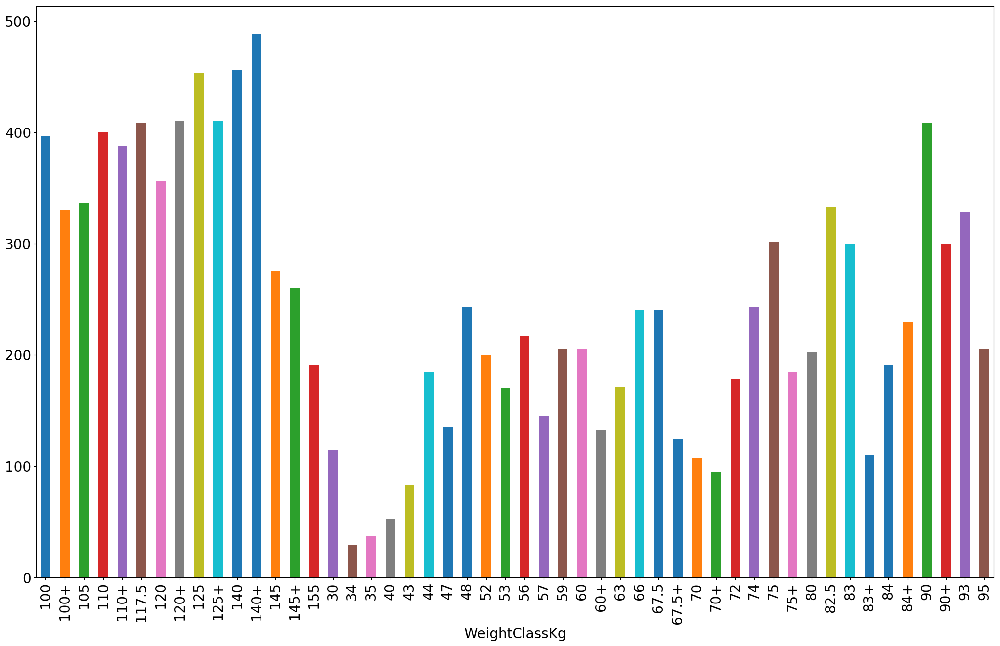

In [17]:
plt.figure(figsize=(25,15))
#print(df.sort_values(by=["WeightClassKg"])['WeightClassKg'].dropna())
#print(df.sort_values(by=["WeightClassKg"], ascending=True)['WeightClassKg'].dropna())
#print(df.sort_values(by=["WeightClassKg"], ascending=False)['WeightClassKg'].dropna())
#print(df['WeightClassKg'].value_counts())
df.sort_values(by=['WeightClassKg'], ascending=False).groupby('WeightClassKg')['BestBenchKg'].max().dropna().plot(kind='bar', fontsize=20)
plt.rcParams.update({'font.size':20})
plt.show()

This plot shows the maximum bench (Kg) per weight class.  Not sure why sort_values is not working on this column. Maybe has something to do with the fact that not all observations in column are numeric....


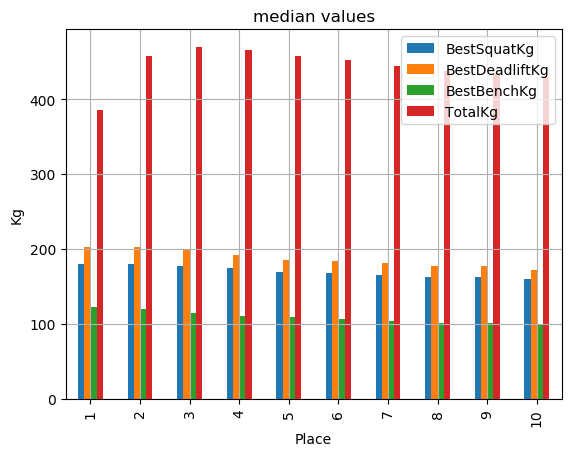

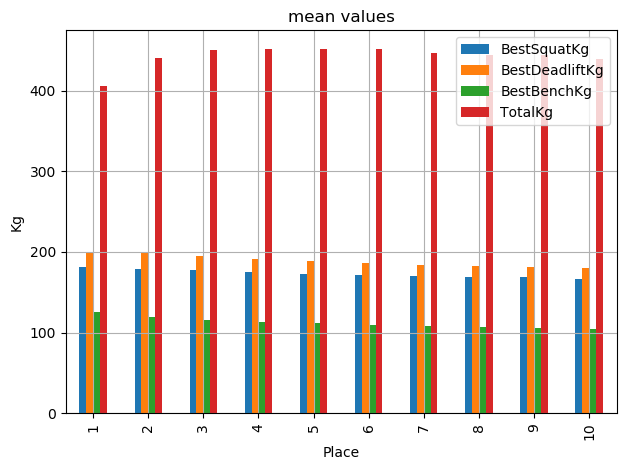

In [20]:
first = df[df['Place']=='1']
second = df[df['Place']=='2']
third = df[df['Place']=='3']
fourth  = df[df['Place']=='4']
fifth = df[df['Place']=='5']
sixth = df[df['Place']=='6']
seventh = df[df['Place']=='7']
eigth = df[df['Place']=='8']
nineth = df[df['Place']=='9']
tenth = df[df['Place']=='10']

df_top = pd.concat([first, second, third, fourth, fifth, sixth, seventh, eigth, nineth, tenth], axis=0)
df_top['Place'] = df_top['Place'].astype('int64')

#print(df_top.info())

plt.rcParams.update({'font.size':10})
df_top.groupby('Place')['BestSquatKg', 'BestDeadliftKg', 'BestBenchKg', 'TotalKg'].median().plot(kind='bar', grid=True, title='median values')
plt.ylabel('Kg')
df_top.groupby('Place')['BestSquatKg', 'BestDeadliftKg', 'BestBenchKg', 'TotalKg'].mean().plot(kind='bar', grid=True, title='mean values')
plt.ylabel('Kg')
plt.tight_layout()
plt.show()
plt.rcdefaults()

Top 10 places for best squat, best bench, best deadlift, and total weight lifted sorted by median and average.

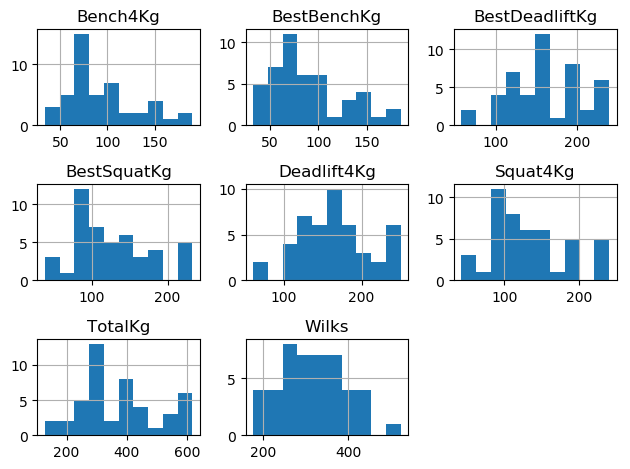

In [21]:
#df.columns
df1 = df.drop(columns=['MeetID', 'Name', 'Sex', 'Equipment', 'Age', 'Division', 'BodyweightKg', 'WeightClassKg', 'Place'])
#print(df1.info())
#print(df1.head())
df1 = df1[(df>0).all(1)] # tosses all rows with negative values
#print(df1)
df1.hist()
plt.tight_layout()
plt.show()

Histograms of non negative values for all lifting categories and wilks score.

In [14]:
#Looking at each division
grouped = df.groupby('Division')

for name,group in grouped:
    print(name)
    print(group)
    print('--------------------------------')

-100kg
       MeetID              Name Sex Equipment   Age Division  BodyweightKg  \
50091    1292    Denis Poleshko   M     Wraps  28.5   -100kg          93.0   
50093    1292     Čigoja Nikola   M     Wraps  25.5   -100kg          95.3   
50102    1292   Kamen Momchilov   M     Wraps  29.5   -100kg          98.5   
50103    1292  Slavyan Stoichev   M     Wraps  29.5   -100kg          98.6   
50104    1292     Lukáš Žigmund   M     Wraps  28.5   -100kg          98.7   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
50091           100       NaN        285.0       NaN        200.0   
50093           100       NaN        270.0       NaN        170.0   
50102           100       NaN        220.0       NaN        172.5   
50103           100       NaN        285.0       NaN        172.5   
50104           100       NaN          NaN       NaN          NaN   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
50091          NaN           285.0    770.0     2

        MeetID                 Name Sex   Equipment   Age Division  \
129991    4884  Ashley Christiansen   F         Raw  17.0    16-17   
129994    4884   Catherine Reymolds   F         Raw  16.0    16-17   
130021    4884  Ashley Christiansen   F         Raw  17.0    16-17   
130023    4884   Catherine Reymolds   F         Raw  16.0    16-17   
130032    4884  Jerry Wayne Cubbage   M         Raw  16.0    16-17   
130042    4884            Tyler May   M         Raw  16.0    16-17   
130147    4888   Catherine Reynolds   F         Raw  16.0    16-17   
130160    4888   Catherine Reynolds   F         Raw  16.0    16-17   
130178    4888    Alejandro Morales   M         Raw  16.0    16-17   
130183    4888     Sebastian Gaibur   M         Raw  17.0    16-17   
130189    4888    Alejandro Morales   M         Raw  16.0    16-17   
130193    4888     Sebastian Gaibur   M         Raw  17.0    16-17   
130218    4889        Lucas Fereira   M         Raw  17.0    16-17   
130229    4889      

        MeetID           Name Sex   Equipment   Age        Division  \
315637    7479  Ryan McElwain   M  Single-ply   NaN  18-19 Teen Men   
315939    7486  Larry Treybig   M  Single-ply  18.0  18-19 Teen Men   
315962    7486  Larry Treybig   M  Single-ply  18.0  18-19 Teen Men   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
315637         75.00            75       NaN          NaN       NaN   
315939         74.16            75       NaN          NaN       NaN   
315962         74.16            75       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
315637       104.89          NaN             NaN   104.89     1   74.74  
315939       115.00          NaN             NaN   115.00     1   82.59  
315962          NaN          NaN           187.5   187.50     1  134.67  
--------------------------------
18-19(T3)
        MeetID              Name Sex   Equipment  Age   Division  \
306804    7403    Heath

        MeetID                Name Sex   Equipment   Age Division  \
129836    4879         Tammy Nolen   F         Raw  43.0    40-44   
129838    4879    Elizabeth Weiner   F         Raw  42.0    40-44   
129848    4879      Marcus Gregory   M         Raw  40.0    40-44   
129852    4879    Elizabeth Weiner   F         Raw  42.0    40-44   
129859    4879      Marcus Gregory   M         Raw  40.0    40-44   
129880    4880      Matt Quatratra   M         Raw  43.0    40-44   
129884    4880        Matthew Reep   M         Raw  42.0    40-44   
129980    4883      Gretchen Uhler   F         Raw   NaN    40-44   
130017    4884         Chris Allen   M         Raw  43.0    40-44   
130040    4884         Chris Allen   M         Raw  43.0    40-44   
130155    4888         Chris Allen   M         Raw  43.0    40-44   
130168    4888            Pat Hall   M         Raw  42.0    40-44   
130170    4888         Chris Allen   M         Raw  43.0    40-44   
130199    4889       Edith Simmons

        MeetID          Name Sex Equipment   Age Division  BodyweightKg  \
169730    5649  Wayne Stover   M       Raw  45.0    45-50         87.91   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
169730            90       NaN          NaN       NaN       145.15   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
169730          NaN             NaN   145.15     1   93.8  
--------------------------------
4th-440
        MeetID           Name Sex   Equipment  Age Division  BodyweightKg  \
315448    7476  Jason Larimer   M  Single-ply  NaN  4th-440         110.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
315448           110       NaN       192.44       NaN       127.46   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
315448          NaN          204.91   524.81     2  308.85  
--------------------------------
50+
       MeetID                Name Sex   Equipment  Age Division  BodyweightKg  \
66187    14

        MeetID         Name Sex Equipment   Age Division  BodyweightKg  \
381350    8442  Ron Erhardt   M       Raw  57.0  55-59 R          90.0   
381356    8442   Jeff Hicks   M       Raw  59.0  55-59 R         100.0   
381391    8442    Ray Lopez   M       Raw  57.0  55-59 R          90.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
381350            90       NaN          NaN       NaN       170.10   
381356           100       NaN          NaN       NaN       129.27   
381391            90       NaN          NaN       NaN          NaN   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
381350          NaN             NaN   170.10     1  108.59  
381356          NaN             NaN   129.27     1   78.67  
381391          NaN          260.82   260.82     1  166.51  
--------------------------------
55-59(M4)
        MeetID            Name Sex   Equipment  Age   Division  BodyweightKg  \
306784    7403     Judy Gedney   F  Single-ply  NaN  55

        MeetID        Name Sex   Equipment   Age Division  BodyweightKg  \
381299    8442  Tom Conway   M  Single-ply  69.0   65-69E          75.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
381299            75       NaN       138.35       NaN        74.84   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
381299          NaN          197.31    410.5     1  292.51  
--------------------------------
65-69R
        MeetID          Name Sex Equipment   Age Division  BodyweightKg  \
381362    8442  Carl Calhoun   M       Raw  67.0   65-69R         110.0   
381402    8442  Carl Calhoun   M       Raw  67.0   65-69R         110.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
381362           110       NaN          NaN       NaN       133.81   
381402           110       NaN          NaN       NaN          NaN   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
381362          NaN             NaN   133.81     

      MeetID             Name Sex  Equipment   Age  Division  BodyweightKg  \
8756     124    Kayla Forcier   F      Wraps  23.0  AAPF F-O         49.53   
8757     124      Erin Westby   F      Wraps  24.0  AAPF F-O         64.86   
8758     124    Sydney Elling   F        Raw  25.0  AAPF F-O         80.92   
8760     124  Amanda Weninger   F        Raw  27.0  AAPF F-O         54.70   
8762     124      Siera Brown   F      Wraps  30.0  AAPF F-O         72.57   
8766     124      Gini Pilles   F      Wraps  36.0  AAPF F-O         71.40   
8768     124     Sheri Styles   F      Wraps  29.0  AAPF F-O         66.77   
8772     124         Ann Lenz   F  Multi-ply  39.0  AAPF F-O         74.48   
8779     124      Erin Farber   F        Raw  25.0  AAPF F-O        128.37   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
8756            52       NaN        125.0       NaN         57.5          NaN   
8757          67.5       NaN        137.5       NaN      

      MeetID           Name Sex Equipment   Age     Division  BodyweightKg  \
8075     114  Brian Pittman   M       Raw  50.0  AAPF SO-MM3          90.8   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
8075           100       NaN        110.0       NaN        110.0          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
8075           130.0    350.0     1  222.44  
--------------------------------
AAPF SO-MO
      MeetID           Name Sex Equipment   Age    Division  BodyweightKg  \
8072     114   Jackson Ware   M       Raw  21.0  AAPF SO-MO          79.6   
8073     114  Cameron Neely   M       Raw  27.0  AAPF SO-MO         130.9   
8074     114     Josh Myers   M       Raw  29.0  AAPF SO-MO         149.8   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
8072          82.5       NaN         87.5       NaN         62.5          NaN   
8073           140       NaN        167.5       NaN         75.0         

AD F-JR
        MeetID              Name Sex  Equipment   Age Division  BodyweightKg  \
234680    6416     Haelly Bolger   F  Multi-ply  21.0  AD F-JR         79.38   
234753    6416        Alyssa Way   F      Wraps  23.0  AD F-JR         86.91   
234802    6417     Kristy Kinney   F      Wraps  23.0  AD F-JR         73.94   
234803    6417       Amanda Gray   F      Wraps  23.0  AD F-JR         50.89   
235643    6435     Kristy Kinney   F      Wraps  23.0  AD F-JR         76.11   
236293    6448    Taylor Bittner   F      Wraps  21.0  AD F-JR         74.66   
236294    6448  Remmington Layne   F      Wraps  20.0  AD F-JR         88.72   
237008    6464     Taylor Hewitt   F      Wraps  22.0  AD F-JR         75.66   
237496    6475      Morgan Irons   F      Wraps  20.0  AD F-JR         85.96   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
234680          82.5       NaN         87.5       NaN         55.0   
234753            90       NaN        117.5       N

        MeetID          Name Sex Equipment  Age  Division  BodyweightKg  \
236426    6451  Laila Thomas   F       Raw  NaN  AD Guest         26.54   
237326    6470  Laila Thomas   F       Raw  NaN  AD Guest         26.54   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
236426            44       NaN          NaN       NaN        11.34   
237326            44       NaN          NaN       NaN        13.50   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
236426          NaN           38.56     49.9     G  83.70  
237326          NaN           45.00     58.5     G  98.13  
--------------------------------
AD Guest Lifter
        MeetID             Name Sex Equipment  Age         Division  \
234489    6413   Preston Prazak   M       Raw  NaN  AD Guest Lifter   
234507    6413         Ave Ball   F       Raw  NaN  AD Guest Lifter   
234508    6413     Laila Thomas   F       Raw  NaN  AD Guest Lifter   
234509    6413  Mya Brandenburg   F       Raw  NaN

        MeetID                 Name Sex  Equipment   Age Division  \
234669    6416  Michael Silbernagel   M  Multi-ply  34.0   AD M-O   
234671    6416          Dan Eillers   M  Multi-ply  28.0   AD M-O   
234676    6416      Mark Hauschildt   M        Raw  37.0   AD M-O   
234688    6416           Val Huerta   M      Wraps  41.0   AD M-O   
234690    6416           Eric Stone   M  Multi-ply  33.0   AD M-O   
234691    6416        Josh Ericksen   M  Multi-ply  32.0   AD M-O   
234692    6416            JJ Thomas   M  Multi-ply  34.0   AD M-O   
234693    6416          Chris Olson   M  Multi-ply  38.0   AD M-O   
234697    6416      Joseph Walraven   M      Wraps  33.0   AD M-O   
234702    6416       Kyle Duscherer   M      Wraps  33.0   AD M-O   
234703    6416        Gage Abrahams   M      Wraps  37.0   AD M-O   
234704    6416       Andrew Burnell   M      Wraps  26.0   AD M-O   
234772    6416         Vinnie Miles   M  Multi-ply  25.0   AD M-O   
234774    6416         Jimmy Brook

        MeetID             Name Sex  Equipment  Age     Division  \
234519    6413      Pete Sengos   M  Multi-ply  NaN  AD Master 2   
234540    6413   Erin Zemanovic   F      Wraps  NaN  AD Master 2   
235677    6436        Paul Hunt   M  Multi-ply  NaN  AD Master 2   
235681    6436   Chris Gastaris   M      Wraps  NaN  AD Master 2   
235684    6436    Chris Cadotto   M      Wraps  NaN  AD Master 2   
237094    6465       Tom Pearch   M  Multi-ply  NaN  AD Master 2   
237314    6470   Bernie Bronson   M      Wraps  NaN  AD Master 2   
237450    6474     Raymond Kwan   M      Wraps  NaN  AD Master 2   
237455    6474     Brian Nassar   M      Wraps  NaN  AD Master 2   
237458    6474  Kevin Grunzweig   M      Wraps  NaN  AD Master 2   
237941    6482   Erin Zemanovic   F  Multi-ply  NaN  AD Master 2   
237960    6482     Becky Wilson   F        Raw  NaN  AD Master 2   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
234519        100.06           100       NaN

        MeetID             Name Sex Equipment   Age  Division  BodyweightKg  \
236056    6445  Jack Cartwright   M     Wraps  15.0  AD R-M-T         74.21   
236057    6445   Bradyn Barclay   M     Wraps  14.0  AD R-M-T         72.67   
236058    6445    Trevor Mensen   M     Wraps  16.0  AD R-M-T        109.95   
236158    6445    Jacob Oltmans   M       Raw  16.0  AD R-M-T        113.13   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
236056            75       NaN        167.5       NaN        120.0   
236057            75       NaN        145.0       NaN         77.5   
236058           110       NaN        130.0       NaN        110.0   
236158           125       NaN          NaN       NaN          NaN   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
236056          NaN           187.5    475.0     1  340.99  
236057          NaN           165.0    387.5     2  282.39  
236058          NaN           162.5    402.5     1  236.90  
236158   

       MeetID               Name Sex Equipment  Age          Division  \
55381    1374     Ashley McMahon   F     Wraps  NaN  AM Junior(20-23)   
55384    1374   Wyatt Trevithick   M     Wraps  NaN  AM Junior(20-23)   
55385    1374  Dominic Mandarino   M     Wraps  NaN  AM Junior(20-23)   
55386    1374       Jacob Manley   M     Wraps  NaN  AM Junior(20-23)   

       BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
55381         66.41          67.5       NaN       108.86       NaN   
55384         70.94            75       NaN       213.19       NaN   
55385         73.12            75       NaN       185.97       NaN   
55386        139.71           140       NaN       294.84       NaN   

       BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
55381        77.11          NaN          145.15   331.12     1  341.95  
55384       127.01          NaN          208.65   548.85     1  407.16  
55385       113.40          NaN          233.60   532.97     2  

      MeetID           Name Sex  Equipment   Age Division  BodyweightKg  \
7544     107  Billy Koester   M  Multi-ply  56.0  APF MM4         105.0   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
7544           110       NaN        237.5       NaN         92.5          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
7544           165.0    495.0     1  295.79  
--------------------------------
APF MM8
      MeetID         Name Sex Equipment   Age Division  BodyweightKg  \
7552     107  Tom Walters   M       Raw  78.0  APF MM8          94.4   
7554     107  Tom Walters   M       Raw  78.0  APF MM8          94.4   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
7552           100       NaN        110.0       NaN         70.0          NaN   
7554           100       NaN          NaN       NaN         65.0          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
7552           152.5    332.5     1  207.42  


        MeetID               Name Sex Equipment  Age               Division  \
151424    5190  Andrei Oudovikine   M       Raw  NaN  Adaptive Master 40-44   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
151424         89.81            90       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
151424          NaN          NaN           226.8    226.8     1  144.94  
--------------------------------
Am Junior
       MeetID              Name Sex Equipment  Age   Division  BodyweightKg  \
52903    1321    Thomas DiCarlo   M       Raw  NaN  Am Junior         94.80   
55335    1373          Kathy Le   F     Wraps  NaN  Am Junior         53.75   
55346    1373   Mark Zaccadelli   M     Wraps  NaN  Am Junior         59.42   
55347    1373  Michael Ferrigno   M     Wraps  NaN  Am Junior         78.47   
55348    1373      Nick Troetti   M     Wraps  NaN  Am Junior         87.54   
55349    1373     Mike Frizinia  

       MeetID           Name Sex  Equipment  Age         Division  \
54580    1356      Abby Mass   F  Multi-ply  NaN  Am Teen (16-17)   
55344    1373  Buster McCall   M      Wraps  NaN  Am Teen (16-17)   

       BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
54580         88.18            90       NaN       170.10       NaN   
55344         66.90          67.5       NaN       210.92       NaN   

       BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
54580        83.91          NaN          124.74   378.75     1  330.13  
55344       115.67          NaN          231.33   557.92     1  433.27  
--------------------------------
Am Teen (18-19)
       MeetID                         Name Sex Equipment  Age  \
54594    1356                    Adam Rehm   M     Wraps  NaN   
55345    1373  Patrick Mahoney-Balestracci   M     Wraps  NaN   

              Division  BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  \
54594  Am Teen (18-19)         94.62    

        MeetID         Name Sex Equipment  Age       Division  BodyweightKg  \
143208    5071    Lisa Long   F       Raw  NaN  Amateur 55-59         70.31   
143236    5071  Steve Egner   M       Raw  NaN  Amateur 55-59         94.60   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
143208            75       NaN        102.5       NaN         65.0   
143236           100       NaN        137.5       NaN        112.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
143208          NaN           117.5    285.0     1  282.67  
143236          NaN           177.5    427.5     1  266.43  
--------------------------------
Amateur 60-64
        MeetID                 Name Sex Equipment  Age       Division  \
143193    5071  Katherine Stojkovic   F       Raw  NaN  Amateur 60-64   
143237    5071        Mark Gallison   M       Raw  NaN  Amateur 60-64   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
143193         51.71          

        MeetID           Name Sex Equipment  Age      Division  BodyweightKg  \
152556    5211       Nikie Lo   F     Wraps  NaN  Amateur J-22         66.68   
152581    5211       Ben Zang   M       Raw  NaN  Amateur J-22         79.92   
152590    5211  Jimmy Strauss   M     Wraps  NaN  Amateur J-22         92.90   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
152556          67.5       NaN        115.0       NaN         57.5   
152581          82.5       NaN        155.0       NaN        127.5   
152590           100       NaN        185.0       NaN        122.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
152556          NaN           137.5    310.0     1  319.19  
152581          NaN           210.0    492.5     1  336.44  
152590          NaN           247.5    555.0     1  348.82  
--------------------------------
Amateur J-23
        MeetID           Name Sex Equipment  Age      Division  BodyweightKg  \
141913    5056  David Samper

        MeetID             Name Sex Equipment  Age            Division  \
139525    5023  Michelle Marini   F       Raw  NaN  Amateur Jun. 20-23   
141139    5045  Joshua Isabelle   M     Wraps  NaN  Amateur Jun. 20-23   
142251    5061  Brian Owczarski   M       Raw  NaN  Amateur Jun. 20-23   
142255    5061   Benjamin Duell   M       Raw  NaN  Amateur Jun. 20-23   
142256    5061    Bryan Sherman   M     Wraps  NaN  Amateur Jun. 20-23   
142259    5061   Nick Guimaraes   M       Raw  NaN  Amateur Jun. 20-23   
142260    5061    Dustin Wilson   M     Wraps  NaN  Amateur Jun. 20-23   
142271    5061   Bryan Crandall   M     Wraps  NaN  Amateur Jun. 20-23   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
139525         54.61            56       NaN        92.99       NaN   
141139        130.91           140       NaN       136.08       NaN   
142251         73.75            75       NaN       185.97       NaN   
142255         80.29          82.5       NaN     

        MeetID         Name Sex Equipment  Age         Division  BodyweightKg  \
134232    4957  Karen Dodge   F     Wraps  NaN  Amateur M 50-54         54.75   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
134232            56      56.7        54.43     34.02        31.75   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
134232        72.57           70.31   156.49     1  187.41  
--------------------------------
Amateur M 55-59
        MeetID              Name Sex Equipment  Age         Division  \
134233    4957  Valerie Thompson   F     Wraps  NaN  Amateur M 55-59   
134243    4957    Frank Odonnell   M     Wraps  NaN  Amateur M 55-59   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
134233         59.96            60       NaN        68.04     45.36   
134243        104.14           110       NaN       145.15       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
134233        43.09 

        MeetID        Name Sex Equipment  Age      Division  BodyweightKg  \
152561    5211  Kaye Green   F       Raw  NaN  Amateur M-59         71.94   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
152561            75       NaN         30.0       NaN         52.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
152561          NaN           107.5    190.0     1  185.55  
--------------------------------
Amateur M-62
        MeetID             Name Sex Equipment  Age      Division  \
141909    5056  Helen Hanherson   F       Raw  NaN  Amateur M-62   
141938    5057  Helen Hanherson   F       Raw  NaN  Amateur M-62   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
141909          82.1          82.5       NaN          NaN       NaN   
141938          82.1          82.5       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
141909        130.0          NaN           

        MeetID             Name Sex   Equipment  Age        Division  \
135039    4970    Chuck Mcleary   M       Wraps  NaN  Amateur M75-79   
135089    4970    Peter Hubbard   M         Raw  NaN  Amateur M75-79   
136629    4991         Ed Brown   M         Raw  NaN  Amateur M75-79   
138039    5004  Chuck McClearly   M         Raw  NaN  Amateur M75-79   
138040    5004   Leon Pelletier   M       Wraps  NaN  Amateur M75-79   
138047    5004      Caleb Wolfe   M       Wraps  NaN  Amateur M75-79   
138072    5004    Peter Hubbard   M  Single-ply  NaN  Amateur M75-79   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
135039         72.67            75       NaN        79.38       NaN   
135089         78.47          82.5       NaN          NaN       NaN   
136629         99.52           100       NaN       117.93       NaN   
138039         72.76            75       NaN        74.84       NaN   
138040         74.66            75       NaN       104.33       NaN 

        MeetID              Name Sex Equipment  Age            Division  \
142253    5061    Chuck McCleary   M     Wraps  NaN  Amateur Mast 80-84   
148317    5142     Alice Geiling   F     Wraps  NaN  Amateur Mast 80-84   
149692    5166  Charles Mccleary   M     Wraps  NaN  Amateur Mast 80-84   
153389    5221     Alice Geiling   F     Wraps  NaN  Amateur Mast 80-84   
153417    5221    Chuck McCleary   M     Wraps  NaN  Amateur Mast 80-84   
153448    5221      Jack Stinson   M     Wraps  NaN  Amateur Mast 80-84   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
142253         73.75            75       NaN        81.65       NaN   
148317         55.52            56       NaN        45.36       NaN   
149692         72.30            75       NaN        88.45       NaN   
153389         55.70            56       NaN        40.82       NaN   
153417         67.45          67.5       NaN        68.04       NaN   
153448         86.73            90       NaN    

       MeetID                  Name Sex  Equipment   Age  \
53566    1336       Donald Grunstra   M  Multi-ply   NaN   
53585    1336          Brian Barger   M      Wraps   NaN   
53586    1336       Kevin Ballenger   M      Wraps   NaN   
53587    1336           Wade Meetze   M      Wraps   NaN   
53751    1339         Celeste Jones   F      Wraps  42.5   
53784    1339          Matthew Reep   M      Wraps  39.5   
53940    1342      Colin MacDougall   M  Multi-ply  43.5   
53941    1342            John Levan   M  Multi-ply  42.5   
54089    1346          Johnny Layne   M        Raw  41.5   
54092    1346            Brian King   M  Multi-ply  42.5   
54481    1353          Vicki Lodise   F        Raw  43.5   
54694    1359          James Ingram   M      Wraps  40.0   
54992    1367        Lori Marchioni   F      Wraps   NaN   
54994    1367          Angela Tigar   F      Wraps   NaN   
55019    1367           Hifon Smith   M      Wraps   NaN   
55025    1367         Derrick Brown   M 

        MeetID            Name Sex  Equipment   Age              Division  \
53479     1335     Eric Winter   M  Multi-ply  41.0  Amateur Master 40-45   
147457    5131  Walter Hammann   M      Wraps   NaN  Amateur Master 40-45   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
53479          97.75           100       NaN          NaN       NaN   
147457        110.00           110       NaN        235.0       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
53479        229.06          NaN             NaN   229.06     1  140.71  
147457       195.00          NaN           227.5   657.50     1  386.93  
--------------------------------
Amateur Master 40-46
        MeetID            Name Sex Equipment  Age              Division  \
147444    5131  Robert Hawkins   M     Wraps  NaN  Amateur Master 40-46   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
147444          88.9            90       NaN        167.

        MeetID                  Name Sex Equipment   Age  \
381850    8444       Maksim Sukhobok   M     Wraps  50.0   
381904    8444  Valeriy Razdorozhnyy   M     Wraps  50.0   
381905    8444    Aleksandr Tsvetkov   M     Wraps  58.0   
381936    8444  Lyudmila Khromenkova   F       Raw  54.0   
381959    8444        Sergey Fedorov   M       Raw  53.0   
382000    8444      Damir Khayrullin   M       Raw  52.0   
382001    8444    Aleksey Khromenkov   M       Raw  58.0   
382020    8444     Sergey Filinovich   M       Raw  53.0   
382049    8444  Lyudmila Khromenkova   F       Raw  54.0   
382064    8444     Viktor Kotelnikov   M       Raw  51.0   
382069    8444         Vadim Zaytsev   M       Raw  55.0   

                    Division  BodyweightKg WeightClassKg  Squat4Kg  \
381850  Amateur Master 50-59          66.9          67.5       NaN   
381904  Amateur Master 50-59          93.7           100       NaN   
381905  Amateur Master 50-59          94.6           100       NaN   

        MeetID               Name Sex   Equipment   Age              Division  \
53248     1330      Italo Bonacci   M       Wraps  68.5  Amateur Master 70-74   
54218     1348      Italo Bonacci   M       Wraps  69.5  Amateur Master 70-74   
57211     1416        Don Wilkins   M         Raw   NaN  Amateur Master 70-74   
131452    4913      Peter Hubbard   M         Raw   NaN  Amateur Master 70-74   
132013    4922    Audrey Donellan   F         Raw   NaN  Amateur Master 70-74   
132129    4925     Richard Malmed   M         Raw   NaN  Amateur Master 70-74   
132262    4927    Audrey Donellan   F         Raw  71.0  Amateur Master 70-74   
133043    4939    Audrey Donellan   F         Raw   NaN  Amateur Master 70-74   
133509    4945      George Flikas   M         Raw   NaN  Amateur Master 70-74   
134374    4960    Audrey Donellan   F         Raw   NaN  Amateur Master 70-74   
134640    4965        Gary Craner   M         Raw   NaN  Amateur Master 70-74   
134678    4966     Richard M

       MeetID            Name Sex Equipment   Age                 Division  \
54301    1349  Michael Newman   M     Wraps  63.5  Amateur Masters (60-64)   

       BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
54301        110.59           110       NaN       111.13       NaN   

       BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
54301       111.13          NaN          124.74    347.0     1  203.88  
--------------------------------
Amateur Masters (65-69)
       MeetID          Name Sex Equipment   Age                 Division  \
53888    1340  Donald Frost   M     Wraps  65.5  Amateur Masters (65-69)   

       BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
53888        104.33           110       NaN          NaN       NaN   

       BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
53888          NaN          NaN             NaN      NaN    DQ    NaN  
--------------------------------
Amateur Masters (75-79)
    

        MeetID             Name Sex Equipment  Age               Division  \
146306    5112  Shane Ellinwood   M     Wraps  NaN  Amateur Military Open   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
146306         72.21            75       NaN       163.29       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
146306       131.54          NaN          199.58   494.42     1  361.98  
--------------------------------
Amateur Mr1
        MeetID          Name Sex Equipment   Age     Division  BodyweightKg  \
385306    8462  Diana Senior   F     Wraps  40.0  Amateur Mr1          72.8   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
385306            75       NaN        115.0       NaN          NaN   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
385306          NaN           110.0      NaN    DQ    NaN  
--------------------------------
Amateur Ms-55
        MeetID           Name Sex Equipmen

        MeetID               Name Sex Equipment  Age               Division  \
146486    5116  Darryl Richardson   M       Raw  NaN  Amateur Open/Military   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
146486        160.93          140+       NaN       204.12       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
146486       215.46          NaN          249.48   669.05     1  366.47  
--------------------------------
Amateur Open/Police-Fire
        MeetID              Name Sex Equipment  Age                  Division  \
146479    5116  Dillon Knoettner   M     Wraps  NaN  Amateur Open/Police-Fire   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
146479         98.34           100       NaN       222.26       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
146479       154.22          NaN          267.62    644.1     1  394.68  
--------------------------------
Amate

        MeetID         Name Sex  Equipment  Age        Division  BodyweightKg  \
134510    4961  Ryan Gilman   M        Raw  NaN  Amateur S33-39         87.72   
134516    4961  Jamie Matta   M  Multi-ply  NaN  Amateur S33-39         94.08   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
134510            90       NaN          NaN       NaN       131.54   
134516           100       NaN       299.37       NaN       258.55   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
134510          NaN          204.12   335.66     1  217.17  
134516          NaN          249.48   807.39     1  504.46  
--------------------------------
Amateur SUB
        MeetID        Name Sex Equipment   Age     Division  BodyweightKg  \
138394    5008  Roy Mubiru   M       Raw  37.0  Amateur SUB         113.4   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
138394           125       NaN          NaN       NaN       129.27   

        Deadlift4Kg  

        MeetID            Name Sex Equipment  Age           Division  \
56532     1402  Stephen Miller   M       Raw  NaN  Amateur SubMaster   
141840    5054     Jason Allen   M     Wraps  NaN  Amateur SubMaster   
151258    5187      Brad Banks   M     Wraps  NaN  Amateur SubMaster   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
56532          79.83          82.5       NaN          NaN       NaN   
141840         86.86            90       NaN       204.12       NaN   
151258        166.01          140+       NaN       238.14       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
56532        127.01          NaN          222.26   349.27     1  238.77  
141840       147.42          NaN          263.08   614.62     1  399.78  
151258       145.15          NaN          294.84   678.12     1  369.69  
--------------------------------
Amateur SubMaster (33-39)
       MeetID             Name Sex  Equipment   Age  \
54091    1346  F

        MeetID          Name Sex Equipment  Age            Division  \
135091    4970  David Harvey   M       Raw  NaN  Amateur T-16-17 Hs   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
135091         97.34           100       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
135091        120.2          NaN             NaN    120.2     1  73.97  
--------------------------------
Amateur T-18-19
        MeetID            Name Sex  Equipment  Age         Division  \
136624    4991  Zachary Gibson   M  Multi-ply  NaN  Amateur T-18-19   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
136624        132.27           140     283.5       274.42    244.94   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
136624       235.87          NaN          242.67   752.96     1  424.58  
--------------------------------
Amateur T-19
        MeetID         Name Sex Equipme

        MeetID            Name Sex Equipment  Age           Division  \
141000    5042  Billy Crawford   M       Raw  NaN  Amateur Teen (13)   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
141000         51.71            52       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
141000        34.02          NaN           88.45   122.47     1  120.88  
--------------------------------
Amateur Teen (13-15)
       MeetID                Name Sex Equipment   Age              Division  \
54998    1367      Autumn Bradley   F       Raw   NaN  Amateur Teen (13-15)   
54999    1367        Eric Schwarz   M     Wraps   NaN  Amateur Teen (13-15)   
55269    1372  Allison Broadhurst   F     Wraps  14.5  Amateur Teen (13-15)   
55279    1372      Autumn Bradley   F       Raw  15.5  Amateur Teen (13-15)   
55284    1372      Joshua Daubert   M       Raw  13.5  Amateur Teen (13-15)   
55285    1372   Brandon Schaeffer   

        MeetID                     Name Sex   Equipment   Age  \
53348     1332             Austin Wirth   M       Wraps   NaN   
53483     1335            Harley Kohler   F       Wraps  15.0   
53875     1340              Katie Kraus   F         Raw  10.5   
53928     1342              Katie Kraus   F         Raw  10.5   
53947     1342          Magnuss McVicar   M         Raw  13.5   
53948     1342            Trett McVicar   M         Raw  14.5   
54963     1366              Summer Duba   F       Wraps  13.0   
55501     1378          Estefan Hidalgo   M         Raw   NaN   
57052     1414             Sierra Siler   F         Raw   NaN   
130561    4895             Logan Dallas   M         Raw   NaN   
130626    4897               Jen Rivers   F  Single-ply   NaN   
130630    4897             Jiohn Pavlik   M  Single-ply   NaN   
130639    4897    Christopher Kurtanick   M  Single-ply   NaN   
130651    4897         Dominic Kurpaska   M         Raw   NaN   
130672    4897       Cour

        MeetID          Name Sex Equipment  Age           Division  \
134124    4955  Cody Mahoney   M     Wraps  NaN  Amateur Teen18-19   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
134124         93.26           100       NaN        183.7       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
134124       158.76          NaN          231.33   573.79     1  359.97  
--------------------------------
Amateur Teen8-19
        MeetID             Name Sex Equipment  Age          Division  \
138681    5011  Lucas Robillard   M       Raw  NaN  Amateur Teen8-19   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
138681         89.45            90       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
138681       145.15          NaN          199.58   344.73     1  220.76  
--------------------------------
Amateur Teenage 14-15
        MeetID           Na

        MeetID                   Name Sex Equipment   Age  \
381551    8444    Svetlana Zapolskikh   F     Wraps  15.0   
381559    8444  Yekaterina Obvintseva   F     Wraps  14.0   
381566    8444      Yekaterina Antukh   F     Wraps  15.0   
381567    8444     Vladimir Burnashov   M     Wraps  13.0   
381569    8444       Nikita Tremaskin   M     Wraps  16.0   
381570    8444         Ayk Andriasyan   M     Wraps  14.0   
381581    8444       Aleksandr Redkin   M     Wraps  16.0   
381639    8444      Anastasiya Dzyuba   F       Raw  12.0   
381644    8444    Svetlana Zapolskikh   F       Raw  15.0   
381650    8444      Svetlana Morozova   F       Raw  16.0   
381653    8444      Anastasiya Daniel   F       Raw  16.0   
381658    8444         Sergey Morozov   M       Raw  16.0   
381660    8444           Danil Serbin   M       Raw  15.0   
381668    8444          Ilya Medvedev   M       Raw  16.0   
381669    8444         Viktor Fedotov   M       Raw  13.0   
381774    8444      Anas

        MeetID               Name Sex   Equipment  Age              Division  \
147737    5136        Chris Ragos   M       Wraps  NaN  Amateur junior 20-23   
149003    5154    Nathanael Woods   M         Raw  NaN  Amateur junior 20-23   
150499    5174   Miguel A Palacio   M       Wraps  NaN  Amateur junior 20-23   
150898    5182  Peter Theoharidis   M       Wraps  NaN  Amateur junior 20-23   
153182    5218       Nydir Hayden   M       Wraps  NaN  Amateur junior 20-23   
153740    5226       Lindsi Woods   F         Raw  NaN  Amateur junior 20-23   
153749    5226       Maria Mohler   F       Wraps  NaN  Amateur junior 20-23   
153755    5226     Ailene Parrill   F       Wraps  NaN  Amateur junior 20-23   
153765    5226    Kelsey Eversole   M  Single-ply  NaN  Amateur junior 20-23   
153770    5226         Grant Bare   M       Wraps  NaN  Amateur junior 20-23   
153794    5226  Benjamin Egelhoff   M       Wraps  NaN  Amateur junior 20-23   
153803    5226     C.J. Hoskinson   M   

        MeetID           Name Sex Equipment   Age Division  BodyweightKg  \
122249    4622  Daniel Butera   M       Raw  22.5       BL        107.95   
122251    4622   Lepeka Nanai   M       Raw  34.5       BL        126.40   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
122249           120       NaN        200.0       NaN        137.5   
122251          120+       NaN        250.0       NaN        202.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
122249          NaN           225.0    562.5     1  333.00  
122251          NaN           265.0    717.5     1  407.96  
--------------------------------
BO DO O
       MeetID             Name Sex Equipment  Age Division  BodyweightKg  \
48073    1278  Minna Ilmolahti   F       Raw  NaN  BO DO O          57.5   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
48073            60       NaN          NaN       NaN         55.0   

       Deadlift4Kg  BestDeadliftKg  TotalKg 

        MeetID                 Name Sex   Equipment  Age          Division  \
188868    5911     Silverio Mendoza   M  Single-ply  NaN  Boys Ninth Grade   
188869    5911        Julian Hughes   M  Single-ply  NaN  Boys Ninth Grade   
188870    5911        Alex Gallegos   M  Single-ply  NaN  Boys Ninth Grade   
188871    5911          Juan Guzman   M  Single-ply  NaN  Boys Ninth Grade   
188872    5911         Hunter Young   M  Single-ply  NaN  Boys Ninth Grade   
188873    5911           Jose Tovar   M  Single-ply  NaN  Boys Ninth Grade   
188874    5911    Jon Michael Lemas   M  Single-ply  NaN  Boys Ninth Grade   
188875    5911         Leif Griffin   M  Single-ply  NaN  Boys Ninth Grade   
188876    5911     Tomas Montellano   M  Single-ply  NaN  Boys Ninth Grade   
188877    5911          Cody Moreno   M  Single-ply  NaN  Boys Ninth Grade   
188878    5911         Israel Munoz   M  Single-ply  NaN  Boys Ninth Grade   
188879    5911       Jarrett Wallen   M  Single-ply  NaN  Boys N

        MeetID            Name Sex Equipment  Age          Division  \
139884    5026  Pamela Godinho   F       Raw  NaN  Crossfit 379.509   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
139884         80.74          82.5       NaN        77.11       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
139884         49.9          NaN          124.74   251.74     1  229.18  
--------------------------------
Crossfit 473.565
        MeetID              Name Sex Equipment  Age          Division  \
139885    5026  Elizabeth Mendez   F     Wraps  NaN  Crossfit 473.565   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
139885         74.98            75       NaN        95.25       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
139885        65.77          NaN          136.08    297.1     1  282.48  
--------------------------------
Crossfit 535.205
        MeetID          Name

      MeetID            Name Sex Equipment  Age     Division  BodyweightKg  \
1413      25  Cheryl Ritchie   F     Wraps  NaN  DT - M40/44         79.65   
1442      25   Andrew Snider   M     Wraps  NaN  DT - M40/44        122.47   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
1413          82.5       NaN        102.5       NaN         75.0          NaN   
1442           125       NaN        227.5       NaN        155.0          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
1413           137.5    315.0     1  288.93  
1442           242.5    625.0     1  357.69  
--------------------------------
DT - M45/49
      MeetID         Name Sex Equipment  Age     Division  BodyweightKg  \
1488      26  Derek Yatsu   M     Wraps  NaN  DT - M45/49         66.77   
1544      26    Shad Beck   M     Wraps  NaN  DT - M45/49        122.11   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
1488          67.5       NaN   

      MeetID               Name Sex Equipment  Age   Division  BodyweightKg  \
5761      91            Tony Le   M       Raw  NaN  DT J20-23          66.7   
5765      91  Steven Villanueva   M       Raw  NaN  DT J20-23          98.2   
5768      91  Joseph Mammarella   M     Wraps  NaN  DT J20-23          72.6   
5769      91  Victor Mammarella   M     Wraps  NaN  DT J20-23          81.6   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
5761          67.5       NaN        177.5       NaN        112.5          NaN   
5765           100       NaN        197.5       NaN        142.5          NaN   
5768            75       NaN        155.0       NaN        112.5          NaN   
5769          82.5       NaN        190.0       NaN        145.0          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
5761           205.0    495.0     1  385.34  
5765           230.0    570.0     1  349.48  
5768           187.5    455.0     1  331.81  
5769          

      MeetID             Name Sex Equipment   Age      Division  BodyweightKg  \
2180      48  Austin Kressler   M     Wraps  15.0  DT Teenage I         70.99   
2181      48    Ruger Hensler   M     Wraps  14.0  DT Teenage I         60.46   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
2180            75       NaN       136.08       NaN        79.38          NaN   
2181          67.5       NaN       102.06       NaN        49.90          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
2180          172.37   387.82     1  287.55  
2181          113.40   265.35     2  224.74  
--------------------------------
DT Teenage II
      MeetID            Name Sex Equipment   Age       Division  BodyweightKg  \
2179      48  Afsheen Zarrin   M     Wraps  16.0  DT Teenage II         67.59   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
2179            75       NaN        113.4       NaN        79.38          NaN   

 

       MeetID              Name Sex Equipment   Age                Division  \
49434    1288  Aleksandr Lednev   M       Raw  43.0  Disabled Masters 40-44   

       BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
49434          86.4            90       NaN          NaN       NaN   

       BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
49434         90.0          NaN             NaN     90.0     1  58.71  
--------------------------------
Disabled Masters 45-49
       MeetID                Name Sex Equipment   Age                Division  \
49417    1288  Natalya Bakhmatova   F       Raw  46.0  Disabled Masters 45-49   
49418    1288   Svetlana Belikova   F       Raw  48.0  Disabled Masters 45-49   
49436    1288      Sergey Kovalev   M       Raw  47.0  Disabled Masters 45-49   

       BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
49417          63.1          67.5       NaN          NaN       NaN   
49418          64.5          67.5  

        MeetID                Name Sex   Equipment  Age Division  \
298327    7274        Colton DePew   M  Single-ply  NaN       EJ   
298328    7274        Stephen Guse   M  Single-ply  NaN       EJ   
298329    7274          Kenny Yuan   M  Single-ply  NaN       EJ   
298330    7274   Michael Coppolino   M  Single-ply  NaN       EJ   
298331    7274     Zachary Holland   M  Single-ply  NaN       EJ   
298332    7274      Zachary Taylor   M  Single-ply  NaN       EJ   
298333    7274      Coleman Wright   M  Single-ply  NaN       EJ   
298334    7274        Daniel Sloss   M  Single-ply  NaN       EJ   
298335    7274       Cody Damewood   M  Single-ply  NaN       EJ   
298336    7274          Josh Bowen   M  Single-ply  NaN       EJ   
298337    7274       William Mayes   M  Single-ply  NaN       EJ   
298338    7274        Jason Poling   M  Single-ply  NaN       EJ   
298339    7274      Matthew DeRito   M  Single-ply  NaN       EJ   
298340    7274     Joseph Winkeler   M  Single-p

        MeetID               Name Sex Equipment  Age          Division  \
132267    4927  Robert Heydenberk   M       Raw  NaN  Elite Teen 18-19   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
132267         98.61           100       NaN       254.01       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
132267        183.7          NaN          265.35   703.07     1  430.32  
--------------------------------
Elite W Open
        MeetID           Name Sex  Equipment  Age      Division  BodyweightKg  \
131313    4911  Brooke Fineis   F  Multi-ply  NaN  Elite W Open         74.89   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
131313            75       NaN       260.82       NaN       156.49   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
131313          NaN           183.7   601.01     1  571.87  
--------------------------------
Elite open
        MeetID          Name Sex Equipment  

       MeetID              Name Sex Equipment   Age Division  BodyweightKg  \
49743    1290  Tricia Bernstein   F     Wraps  64.0      F-5          94.8   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
49743           90+       NaN         62.5       NaN         45.0   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
49743          NaN           107.5    215.0     1  182.11  
--------------------------------
F-55
        MeetID                    Name Sex Equipment   Age Division  \
130054    4885          Darlene Miller   F       Raw  57.0     F-55   
130327    4891  Lynne Courtnage-Coolen   F       Raw  59.0     F-55   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
130054          70.9            75       NaN         82.5       NaN   
130327          70.4            75       NaN         95.5       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
130054         47.5          NaN           1

       MeetID            Name Sex Equipment   Age Division  BodyweightKg  \
14201     203  Natasha Niznik   F     Wraps  30.0   F-AR-O          70.9   
14207     203   Diana Hammond   F     Wraps  33.0   F-AR-O          65.4   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
14201            75       NaN         90.0       NaN         47.5   
14207          67.5       NaN        107.5       NaN         62.5   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
14201          NaN           120.0    257.5     2  253.94  
14207          NaN           137.5    307.5     1  321.14  
--------------------------------
F-AT2-R
      MeetID            Name Sex Equipment   Age Division  BodyweightKg  \
2521      58  Jordan Masters   F       Raw  17.0  F-AT2-R          67.5   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
2521          67.5       NaN        77.11       NaN        43.09          NaN   

      BestDeadliftKg  TotalK

       MeetID             Name Sex Equipment  Age Division  BodyweightKg  \
9736      142  Annabell Gillan   F       Raw  NaN   F-C-SJ          52.0   
9743      142      Lucy Rayner   F       Raw  NaN   F-C-SJ          57.0   
9769      142     Megan Davies   F       Raw  NaN   F-C-SJ          69.0   
9787      142  Charlie Chester   F       Raw  NaN   F-C-SJ          79.8   
9788      142   Abigail McLean   F       Raw  NaN   F-C-SJ          74.0   
9789      142      Alicia Blum   F       Raw  NaN   F-C-SJ          80.6   
10874     156    Mariah Connor   F       Raw  NaN   F-C-SJ          83.9   
44921    1234          K Bains   F       Raw  NaN   F-C-SJ          61.5   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
9736             52       NaN         77.5       NaN         50.0   
9743             57       NaN         85.0       NaN         62.5   
9769             72       NaN         92.5       NaN         45.0   
9787             84       NaN        12

F-E-SJ
       MeetID            Name Sex   Equipment  Age Division  BodyweightKg  \
9687      141   Alison Booker   F  Single-ply  NaN   F-E-SJ          56.7   
12010     167  Amelia Maycock   F  Single-ply  NaN   F-E-SJ          58.1   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
9687             57       NaN          NaN       NaN         77.5   
12010            63       NaN        115.0       NaN         55.0   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
9687           NaN             NaN     77.5     6   90.30  
12010          NaN           140.0    310.0     1  354.38  
--------------------------------
F-E-Snr
       MeetID                  Name Sex   Equipment  Age Division  \
10883     157        Louise Edwards   F  Single-ply  NaN  F-E-Snr   
10884     157           Ellie Steel   F  Single-ply  NaN  F-E-Snr   
10885     157           Faye Jordan   F  Single-ply  NaN  F-E-Snr   
10887     157     Ruta Lendraitiene   F  Single-ply  NaN

        MeetID           Name Sex  Equipment   Age Division  BodyweightKg  \
160781    5436  Janet Loveall   F  Multi-ply  40.0    F-H-E         87.54   
160782    5436  Jessica Brown   F  Multi-ply  29.0    F-H-E         95.71   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
160781            90       NaN        252.5       NaN        150.0   
160782           90+       NaN        112.5       NaN        107.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
160781          NaN           205.0   607.49     1  531.23  
160782          NaN           145.0   365.00     2  308.14  
--------------------------------
F-H-F-M
        MeetID                 Name Sex  Equipment   Age Division  \
161425    5456  Laura Phelps-Sweatt   F  Multi-ply  30.0  F-H-F-M   
161426    5456         Dana Shealey   F  Multi-ply  31.0  F-H-F-M   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
161425         77.11           NaN       NaN        33

        MeetID              Name Sex Equipment   Age Division  BodyweightKg  \
62059     1455      Bonica Lough   F       Raw  27.5     F-HW        136.30   
62060     1455      Jade Dickens   F       Raw  41.5     F-HW        109.44   
154445    5236   Irina Petrovich   F       Raw   NaN     F-HW         65.50   
154446    5236  Rori Megan Alter   F       Raw   NaN     F-HW         67.30   
154447    5236      Alanna Casey   F       Raw   NaN     F-HW         71.70   
154448    5236     Sara Cichorek   F       Raw   NaN     F-HW         73.80   
154449    5236    Dana Rygwelski   F       Raw   NaN     F-HW         74.30   
154450    5236     Omaris Cooper   F       Raw   NaN     F-HW         74.60   
154451    5236  Shannon Thompson   F       Raw   NaN     F-HW         71.30   
154452    5236        Jill Mills   F       Raw   NaN     F-HW         78.90   
154453    5236      Alyssa Smith   F       Raw   NaN     F-HW         82.50   
154454    5236        Kris Clark   F       Raw   NaN

       MeetID                  Name Sex Equipment  Age Division  BodyweightKg  \
13315     190           Rylea Yanke   F       Raw  NaN   F-JR-U         47.51   
13316     190         Molly Chapman   F       Raw  NaN   F-JR-U         62.25   
13317     190          Skylar Yanke   F       Raw  NaN   F-JR-U         61.97   
13318     190       Charlie Chester   F       Raw  NaN   F-JR-U         91.46   
13367     190           Rhonda Wong   F       Raw  NaN   F-JR-U         46.42   
13368     190           Rylea Yanke   F       Raw  NaN   F-JR-U         46.18   
13369     190           Joy Nnamani   F       Raw  NaN   F-JR-U         50.60   
13370     190       Pamela Anderson   F       Raw  NaN   F-JR-U         49.53   
13371     190            Emma McRae   F       Raw  NaN   F-JR-U         51.80   
13372     190       Breann Thiessen   F       Raw  NaN   F-JR-U         55.58   
13373     190           Hannah Chan   F       Raw  NaN   F-JR-U         56.60   
13374     190      Lauren Ed

        MeetID               Name Sex Equipment   Age Division  BodyweightKg  \
155634    5282           Kim Tran   F     Wraps  27.0    F-L-R         48.81   
155635    5282     Kristy Hawkins   F       Raw  36.0    F-L-R         74.84   
155636    5282     Stefanie Cohen   F       Raw  24.0    F-L-R         55.34   
155637    5282    Stacia-Al Mahoe   F       Raw  19.0    F-L-R         44.00   
155638    5282      Tiffany Leung   F     Wraps  25.0    F-L-R         43.82   
155639    5282         Jenna Howe   F       Raw  36.0    F-L-R         54.52   
155640    5282   Bobbie Benabides   F     Wraps  35.0    F-L-R         55.61   
155641    5282        Cali Nguyen   F       Raw  26.0    F-L-R         59.60   
155642    5282         Sandi Imai   F       Raw  37.0    F-L-R         64.50   
155643    5282       Sara Heywood   F       Raw  22.0    F-L-R         67.13   
155644    5282   Svetlana Gelfand   F       Raw  32.0    F-L-R         55.16   
155645    5282       Kristen Loyd   F   

        MeetID         Name Sex   Equipment   Age Division  BodyweightKg  \
159952    5416  Deb Poynter   F  Single-ply  59.0   F-M-SP         79.92   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
159952          82.5       NaN          NaN       NaN        77.11   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
159952          NaN             NaN    77.11     1   70.6  
--------------------------------
F-M1
        MeetID                 Name Sex   Equipment   Age Division  \
6564        99    Elena Kudryashova   F         Raw  42.0     F-M1   
6565        99     Dominique Fisher   F         Raw  44.0     F-M1   
6618        99       Cristina Paulo   F       Wraps  44.0     F-M1   
6715        99         Johanna Bies   F         Raw  44.0     F-M1   
6716        99     Dagmar Liptakova   F         Raw  41.0     F-M1   
6717        99         Mia Salminen   F         Raw  43.0     F-M1   
6718        99        Elina Kulmala   F         Raw  41.0 

        MeetID                 Name Sex Equipment   Age Division  \
13713      194  Dawn Van Den Heuvel   F     Wraps  40.0    F-M1R   
13925      196       Shelly Cameron   F       Raw  44.0    F-M1R   
13993      199       Birgit Elssner   F       Raw  40.0    F-M1R   
14146      202        Karen Newcomb   F     Wraps  42.0    F-M1R   
14150      202           Jen Arnold   F     Wraps  42.0    F-M1R   
14153      202       Crystal Lahaie   F     Wraps  40.0    F-M1R   
15295      234       Birgit Elssner   F       Raw  40.0    F-M1R   
15296      234       Birgit Elssner   F       Raw  40.0    F-M1R   
15852      250        Jenn Ferguson   F       Raw  40.0    F-M1R   
48268     1285         Helena Moore   F       Raw  43.0    F-M1R   
48277     1285    Belinda Azzopardi   F       Raw  42.0    F-M1R   
48288     1285        Natasha Davie   F       Raw  40.0    F-M1R   
48450     1285           Dana Tripp   F       Raw  42.0    F-M1R   
171614    5690          Dana Tomlin   F     Wrap

F-M2P-R-U
     MeetID          Name Sex Equipment   Age   Division  BodyweightKg  \
756      12  Janet Martin   F       Raw  48.0  F-M2P-R-U        112.94   

    WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
756           90+       NaN          NaN       NaN         60.0          NaN   

     BestDeadliftKg  TotalKg Place   Wilks  
756           122.5    182.5     1  147.59  
--------------------------------
F-M2PR-X
     MeetID           Name Sex Equipment   Age  Division  BodyweightKg  \
232       3  Sujata Bhakat   F       Raw  49.0  F-M2PR-X         81.65   
233       3     Bela Ghosh   F       Raw  47.0  F-M2PR-X         57.70   

    WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
232          82.5       NaN          NaN       NaN        70.31          NaN   
233            60       NaN          NaN       NaN        81.65          NaN   

     BestDeadliftKg  TotalKg Place   Wilks  
232          124.74   195.04     1  176

        MeetID        Name Sex   Equipment   Age Division  BodyweightKg  \
314425    7460  Gail Moore   F  Single-ply  62.0    F-M3a          65.7   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
314425          67.5       NaN        125.0       NaN         75.0   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
314425          NaN           151.0    351.0     1  365.34  
--------------------------------
F-M3b
        MeetID           Name Sex   Equipment   Age Division  BodyweightKg  \
314371    7460     Bebe Burns   F  Single-ply  68.0    F-M3b         47.70   
314378    7460   Sharon Henry   F  Single-ply  66.0    F-M3b         50.20   
314391    7460   Erika Trubic   F  Single-ply  68.0    F-M3b         53.55   
314406    7460  Faith Ireland   F  Single-ply  68.0    F-M3b         59.00   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
314371            48       NaN         52.5       NaN         35.0   
314378          

        MeetID              Name Sex  Equipment   Age Division  BodyweightKg  \
163791    5516      Natalie Carr   F  Multi-ply  28.0     F-MP         55.79   
163792    5516     Shany Gilbert   F  Multi-ply  21.0     F-MP         79.29   
163793    5516          Jean Fry   F  Multi-ply  26.0     F-MP         55.25   
163794    5516     Brooke Fineis   F  Multi-ply  34.0     F-MP         80.10   
163795    5516        Niki Stein   F  Multi-ply  30.0     F-MP         80.20   
163796    5516     Molly Edwards   F  Multi-ply  30.0     F-MP         81.56   
163797    5516       Beth Thomas   F  Multi-ply  32.0     F-MP         55.88   
163798    5516    Julia Ladewski   F  Multi-ply  31.0     F-MP         55.34   
163799    5516      Chara Barker   F  Multi-ply  25.0     F-MP         62.23   
163800    5516     Kathy Johnson   F  Multi-ply  22.0     F-MP         76.20   
163801    5516   Chris Schaeffer   F  Multi-ply  37.0     F-MP         59.96   
163802    5516       Cara Westin   F  Mu

       MeetID               Name Sex Equipment   Age Division  BodyweightKg  \
3642       64       Cathy Brenan   F       Raw  60.0  F-O-A-R         59.00   
3645       64       Darian Slama   F       Raw  20.0  F-O-A-R         85.20   
3650       64    Kelcie Thoennes   F       Raw  31.0  F-O-A-R         98.80   
3655       64    Sotiria Spencer   F       Raw  23.0  F-O-A-R         47.20   
14399     211  Catherine Filteau   F       Raw  25.0  F-O-A-R         88.77   
14401     211         Stacey Roy   F       Raw  32.0  F-O-A-R         95.03   
14402     211  Isabelle Chalhoub   F       Raw  42.0  F-O-A-R         96.39   
14407     211       Lynsie Royer   F       Raw  33.0  F-O-A-R         96.96   
14413     211    Veronique Piche   F       Raw  30.0  F-O-A-R         51.80   
14417     211       Amanda Myers   F       Raw  28.0  F-O-A-R         58.97   
14418     211     Tiffany Savanh   F       Raw  24.0  F-O-A-R         46.49   
14421     211    Jana Lee Morris   F       Raw  23.0

       MeetID              Name Sex   Equipment   Age Division  BodyweightKg  \
51519    1300     Taryn Madeley   F   Multi-ply  24.0     F-OE         53.40   
51520    1300      Emily Knauth   F   Multi-ply  28.0     F-OE         88.70   
52065    1305        Holly Hoad   F   Multi-ply  27.0     F-OE        104.00   
52259    1312   Lauren Ashleigh   F   Multi-ply  30.0     F-OE         67.40   
52635    1317    Laura Matthews   F   Multi-ply  25.0     F-OE         66.05   
52636    1317  Stephanie Taylor   F   Multi-ply  29.0     F-OE         61.35   
52690    1318  Stephanie Taylor   F  Single-ply  30.0     F-OE         65.55   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
51519            56       NaN        145.0       NaN         85.0   
51520            90       NaN        157.5       NaN         92.5   
52065           110       NaN          NaN       NaN        100.0   
52259          67.5       NaN        195.0       NaN        110.0   
52635         

       MeetID               Name Sex Equipment   Age Division  BodyweightKg  \
48237    1285     Patricia Viola   F     Wraps  25.0    F-ORP          47.5   
48239    1285       Coralie Weir   F     Wraps  52.0    F-ORP          51.3   
48242    1285        Meg Schneck   F     Wraps  25.0    F-ORP          55.4   
48243    1285       Marisa Golob   F     Wraps  24.0    F-ORP          55.0   
48245    1285    Samantha Hailey   F     Wraps  35.0    F-ORP          54.9   
48249    1285     Venecia Bachee   F     Wraps  29.0    F-ORP          59.1   
48250    1285     Annette Fatone   F     Wraps  27.0    F-ORP          59.4   
48254    1285     Rebecca Hodges   F     Wraps  31.0    F-ORP          58.9   
48259    1285      Heidi Stewart   F     Wraps  31.0    F-ORP          67.3   
48261    1285   Zorahgail Balino   F     Wraps  33.0    F-ORP          67.3   
48271    1285       Lyndall Vile   F     Wraps  26.0    F-ORP          74.2   
48276    1285   Alisha Rawlinson   F     Wraps  36.0

        MeetID              Name Sex Equipment   Age Division  BodyweightKg  \
14175      203    Kristine Adams   F       Raw  23.0    F-R-J         67.30   
14178      203  Taylor O'Donnell   F       Raw  21.0    F-R-J         68.40   
14200      203  Samantha Bechard   F       Raw  22.0    F-R-J         59.60   
15795      248       Rachel Katz   F       Raw  21.0    F-R-J         57.50   
236976    6463       Yuri Borges   F     Wraps  22.0    F-R-J         71.03   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
14175           67.5     140.0        137.5       NaN         70.0   
14178             75       NaN        152.5     -95.0         92.5   
14200             60       NaN        137.5     -90.0         87.5   
15795             60       NaN         82.5       NaN         42.5   
236976            75       NaN         87.5       NaN         42.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
14175           NaN           145.0    352.

        MeetID                     Name Sex Equipment  Age Division  \
167747    5605           Jenn Rotsinger   F     Wraps  NaN   F-R-PL   
167748    5605            Susan Salazar   F     Wraps  NaN   F-R-PL   
167749    5605          Irina Petrovich   F     Wraps  NaN   F-R-PL   
167750    5605           April Shumaker   F     Wraps  NaN   F-R-PL   
167751    5605        Robyn Blankenship   F     Wraps  NaN   F-R-PL   
167752    5605        Jeanine Whittaker   F     Wraps  NaN   F-R-PL   
167753    5605         Stephanie Walker   F     Wraps  NaN   F-R-PL   
167754    5605           Shana Ratcliff   F     Wraps  NaN   F-R-PL   
167755    5605      Leonetta Richardson   F     Wraps  NaN   F-R-PL   
167756    5605             Mayra Armijo   F     Wraps  NaN   F-R-PL   
167757    5605              Heidi Howar   F     Wraps  NaN   F-R-PL   
167758    5605          Lindsay McGuire   F     Wraps  NaN   F-R-PL   
167759    5605         Paula Sheynerman   F     Wraps  NaN   F-R-PL   
167760

        MeetID             Name Sex Equipment   Age Division  BodyweightKg  \
243877    6589      Genna Fudin   F       Raw  22.0     F-RJ          61.3   
243878    6589     Corri Takeda   F       Raw  23.0     F-RJ          54.0   
243882    6589  Kathlen Heylman   F       Raw  20.0     F-RJ          53.3   
243887    6589     Cindy Nguyen   F       Raw  23.0     F-RJ          46.2   
243888    6589  Rachael Johnson   F       Raw  22.0     F-RJ          62.4   
243899    6589    Cecilia Cisar   F       Raw  23.0     F-RJ          68.4   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
243877            63       NaN         67.5       NaN         40.0   
243878            57       NaN         97.5       NaN         47.5   
243882            57       NaN         92.5       NaN         42.5   
243887            47       NaN         90.0       NaN         45.0   
243888            63       NaN         95.0       NaN         55.0   
243899            72       NaN   

        MeetID                  Name Sex   Equipment   Age Division  \
9533       138        Sharn Rowlands   F  Single-ply   NaN      F-S   
9534       138         Rebecca Heath   F  Single-ply   NaN      F-S   
9535       138        Louise Edwards   F  Single-ply   NaN      F-S   
9539       138         Louise Murray   F  Single-ply   NaN      F-S   
9540       138           Ellie Steel   F  Single-ply   NaN      F-S   
9547       138         Rosimery Lima   F  Single-ply   NaN      F-S   
9549       138             Ella Hope   F  Single-ply   NaN      F-S   
9551       138       Megan Batchelor   F  Single-ply   NaN      F-S   
9552       138          Amanda Gisby   F  Single-ply   NaN      F-S   
9559       138  Charlie Shotton-Gale   F  Single-ply   NaN      F-S   
9560       138     Victoria Embleton   F  Single-ply   NaN      F-S   
9561       138         Shasha Bowers   F  Single-ply   NaN      F-S   
9563       138       Jackie Blasbery   F  Single-ply   NaN      F-S   
10246 

        MeetID               Name Sex   Equipment   Age Division  \
13288      190    Nellie Jo Kurta   F         Raw   NaN     F-SO   
13289      190        Lisa Newell   F         Raw   NaN     F-SO   
13290      190     Jamie Robinson   F         Raw   NaN     F-SO   
13291      190     Jemma Robinson   F         Raw   NaN     F-SO   
13292      190  Michelle Martinow   F         Raw   NaN     F-SO   
315074    7464   Patrice Lockhart   F  Single-ply  28.0     F-SO   
315075    7464      Jasmine Swain   F  Single-ply  15.0     F-SO   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
13288          69.17            72       NaN          NaN       NaN   
13289          73.84            84       NaN          NaN       NaN   
13290         101.51           84+       NaN         45.0       NaN   
13291         138.90           84+       NaN          NaN       NaN   
13292          95.80           84+       NaN          NaN       NaN   
315074         89.00         

       MeetID                Name Sex  Equipment   Age Division  BodyweightKg  \
14137     202        Terra Carter   F  Multi-ply  14.0    F-T1E          70.1   
14140     202  Isabelle Lantainge   F  Multi-ply  14.0    F-T1E          71.3   
14233     205        Terra Carter   F  Multi-ply  14.0    F-T1E          66.0   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
14137            75       NaN         55.0       NaN          NaN   
14140            75       NaN         95.0       NaN         47.5   
14233          67.5      55.0         50.0       NaN         35.0   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
14137          NaN             NaN      NaN    DQ     NaN  
14140          NaN           117.5    260.0     1  255.44  
14233       -107.5           100.0    185.0     1  191.91  
--------------------------------
F-T1F-R-X
     MeetID        Name Sex Equipment   Age   Division  BodyweightKg  \
641      12  Macy Lantz   F       Raw  13.0

F-WAL-C
       MeetID              Name Sex Equipment  Age Division  BodyweightKg  \
11589     163    Victoria Eades   F       Raw  NaN  F-WAL-C          71.8   
11590     163  Caroline Shearer   F       Raw  NaN  F-WAL-C          63.8   
11591     163      Lauren Evans   F       Raw  NaN  F-WAL-C          68.4   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
11589            72       NaN        130.0       NaN         60.0   
11590            72       NaN        125.0       NaN         50.0   
11591            72       NaN        120.0       NaN         52.5   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
11589          NaN           155.0    345.0     1  337.36  
11590          NaN           145.0    320.0     2  340.41  
11591          NaN           105.0    277.5     3  280.56  
--------------------------------
F-WAL-E
       MeetID               Name Sex   Equipment  Age Division  BodyweightKg  \
11594     163         Lucy Cohen   F  Single-

       MeetID                Name Sex Equipment   Age Division  BodyweightKg  \
14285     207       Sylvie Savage   F     Wraps  47.0  FA-R-M2          63.0   
14290     207         Tina Deluca   F     Wraps  46.0  FA-R-M2          62.6   
14311     207  Ninette Longsworth   F     Wraps  48.0  FA-R-M2          50.0   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
14285          67.5       NaN         80.0       NaN         40.0   
14290          67.5       NaN         85.0       NaN         45.0   
14311            52       NaN         85.0       NaN         53.5   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
14285          NaN            90.0    210.0     2  225.53  
14290          NaN           110.0    240.0     1  259.00  
14311          NaN           122.5    261.0     1  335.29  
--------------------------------
FA-R-M3
       MeetID           Name Sex Equipment   Age Division  BodyweightKg  \
13938     197  Sue Lundrigan   F       Raw  54

      MeetID          Name Sex   Equipment   Age Division  BodyweightKg  \
6120      94  Dawn Morrell   F  Single-ply  56.0  FM-4-SP          80.4   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
6120          82.5       NaN        100.0       NaN         78.0        140.0   

      BestDeadliftKg  TotalKg Place   Wilks  
6120           130.0    308.0     1  281.05  
--------------------------------
FM-R
       MeetID                Name Sex Equipment   Age Division  BodyweightKg  \
3919       69         Amanda Hart   F       Raw  42.0     FM-R         88.70   
3933       69      Valerie Ferris   F       Raw  56.0     FM-R         51.95   
3940       69       Andrea Sterns   F       Raw  54.0     FM-R         74.55   
3950       69  Jiuliana Mackenzie   F       Raw  44.0     FM-R         58.55   
12119     169      Valerie Ferris   F       Raw  57.0     FM-R         51.15   
12133     170    Leonie Robertson   F       Raw  60.0     FM-R         67.00

        MeetID                       Name Sex  Equipment   Age Division  \
2002        41       Brittany Buffy Ralls   F      Wraps  26.0       FO   
2003        41                 Jill Bates   F      Wraps  35.0       FO   
2004        41              Brittany Cook   F      Wraps  30.0       FO   
6112        94            Lina O'Sullivan   F      Wraps  36.0       FO   
6114        94                 Emma Rogen   F      Wraps  32.0       FO   
6115        94  Natasha Ní Mhaoldomhnaigh   F      Wraps  30.0       FO   
14214      204                Brenna Cook   F        Raw   NaN       FO   
14215      204           Amber Karchanski   F        Raw   NaN       FO   
14216      204            Sarah McCaffrey   F        Raw   NaN       FO   
14219      204            Crystal Grimsen   F  Multi-ply   NaN       FO   
14220      204               Jessica Kohl   F        Raw   NaN       FO   
14221      204              Meighan Chafe   F        Raw   NaN       FO   
14744      218           

       MeetID         Name Sex Equipment  Age Division  BodyweightKg  \
48071    1278  Mari Jäntti   F     Wraps  NaN  FP KW T          73.6   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
48071            75       NaN        100.0       NaN         47.5   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
48071          NaN           110.0    257.5     1  247.74  
--------------------------------
FP KW T1
       MeetID          Name Sex Equipment  Age  Division  BodyweightKg  \
48090    1278  Tuomo Somppi   M     Wraps  NaN  FP KW T1          90.0   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
48090            90       NaN        140.0       NaN         95.0   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
48090          NaN           150.0    385.0     1  245.78  
--------------------------------
FP M1
       MeetID            Name Sex Equipment  Age Division  BodyweightKg  \
48075    1278  Sanna Joutsela   

        MeetID            Name Sex Equipment   Age Division  BodyweightKg  \
236922    6461  Janet Jacobsen   F     Wraps   NaN   FR-M2a          67.7   
238506    6490  Melissa Siders   F       Raw   NaN   FR-M2a          82.0   
242625    6573    Barbara Behm   F       Raw  52.0   FR-M2a          70.1   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
236922            75       NaN          NaN       NaN         55.0   
238506          82.5       NaN         95.0       NaN         45.0   
242625            72       NaN          NaN       NaN         72.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place    Wilks  
236922          NaN           112.5      NaN    DQ      NaN  
238506          NaN           130.0    270.0     1  243.770  
242625          NaN             NaN     72.5     1   72.058  
--------------------------------
FR-M3
        MeetID             Name Sex Equipment   Age Division  BodyweightKg  \
68652     1524  Patricia Kroken   F       Raw

        MeetID                 Name Sex   Equipment  Age       Division  \
218076    6230      Jorge Villareal   M  Single-ply  NaN  FRESHMEN BOYS   
218077    6230      Joshua Figueroa   M  Single-ply  NaN  FRESHMEN BOYS   
218078    6230           Brian Lazo   M  Single-ply  NaN  FRESHMEN BOYS   
218079    6230    Steven Maszatties   M  Single-ply  NaN  FRESHMEN BOYS   
218080    6230      Eddie Santillan   M  Single-ply  NaN  FRESHMEN BOYS   
218081    6230        Pablo Salazar   M  Single-ply  NaN  FRESHMEN BOYS   
218082    6230          Luis Mendez   M  Single-ply  NaN  FRESHMEN BOYS   
218083    6230        Trystan Colon   M  Single-ply  NaN  FRESHMEN BOYS   
218084    6230    Ulysses Contreras   M  Single-ply  NaN  FRESHMEN BOYS   
218085    6230        Luis Zambrano   M  Single-ply  NaN  FRESHMEN BOYS   
218086    6230     Matthew Kruminga   M  Single-ply  NaN  FRESHMEN BOYS   
218087    6230      Marcos Saldivar   M  Single-ply  NaN  FRESHMEN BOYS   
218088    6230          D

       MeetID               Name Sex Equipment   Age Division  BodyweightKg  \
15132     227    Jayden Pederson   F     Wraps  19.0   FT3-RA          58.6   
15144     227  Brooklyn Sandberg   F     Wraps  19.0   FT3-RA          83.5   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
15132            60    -125.0        118.0     -67.5         62.5   
15144            90       NaN        117.5       NaN         55.0   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
15132          NaN           150.0    330.5     1  375.30  
15144          NaN           130.0    302.5     1  270.56  
--------------------------------
FT3R
        MeetID               Name Sex Equipment   Age Division  BodyweightKg  \
234079    6406   Bianca Hernandez   F     Wraps  19.0     FT3R         55.80   
235389    6430       Morgan Irons   F     Wraps  18.0     FT3R         72.00   
235853    6439     Kelsey Clifton   F     Wraps  18.0     FT3R         87.45   
235979    6443  

      MeetID                     Name Sex   Equipment   Age   Division  \
2558      59  Lkhamnurjmaa Badmaadorj   F  Single-ply  23.0  F_JES_WPC   

      BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
2558          59.2            60       NaN        190.0       NaN   

      BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
2558        100.0          NaN           175.0    465.0     1  523.85  
--------------------------------
F_JRA_AAPF
       MeetID                  Name Sex Equipment   Age    Division  \
14486     212  Alexandra Kousathana   F     Wraps  22.0  F_JRA_AAPF   
14507     212          Justine Hoar   F     Wraps  23.0  F_JRA_AAPF   

       BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
14486          75.0            75       NaN        137.5       NaN   
14507          65.9          67.5       NaN        107.5       NaN   

       BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
14486         82.5        

      MeetID                  Name Sex Equipment   Age     Division  \
6431      97  Stephanie VandeWeghe   F     Wraps  55.0  F_MCR_4_APF   
7341     106     Jean-Ann Burgland   F     Wraps  55.0  F_MCR_4_APF   

      BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
6431         78.10          82.5       NaN        192.5       NaN   
7341         67.45          67.5       NaN        182.5       NaN   

      BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
6431        112.5          NaN           195.0    500.0     1  463.82  
7341        100.0          NaN           187.5    470.0     1  479.95  
--------------------------------
F_MCR_4_WPC
      MeetID            Name Sex Equipment   Age     Division  BodyweightKg  \
4647      77  Lynne Boshoven   F     Wraps  59.0  F_MCR_4_WPC          81.2   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
4647          82.5       NaN        147.5       NaN         85.0          NaN

      MeetID          Name Sex  Equipment   Age      Division  BodyweightKg  \
6421      97  Linda Zenzen   F  Multi-ply  62.0  F_MEM_6_AAPF          96.9   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
6421           90+       NaN          NaN       NaN          NaN          NaN   

      BestDeadliftKg  TotalKg Place  Wilks  
6421            80.0     80.0     1  67.26  
--------------------------------
F_MEM_6_AWPC
      MeetID           Name Sex  Equipment   Age      Division  BodyweightKg  \
7791     112  Rita Carlsson   F  Multi-ply  65.0  F_MEM_6_AWPC         59.95   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
7791            60       NaN        187.5       NaN         57.5       -175.0   

      BestDeadliftKg  TotalKg Place   Wilks  
7791           172.5    417.5     1  465.77  
--------------------------------
F_MEM_7_AAPF
      MeetID           Name Sex  Equipment   Age      Division  BodyweightKg  \


       MeetID             Name Sex Equipment   Age    Division  BodyweightKg  \
2693       59     Mia Kukkonen   F     Wraps  43.0  F_MR_1_WPC          58.0   
2694       59    Haley Deleigh   F     Wraps  43.0  F_MR_1_WPC          66.2   
2695       59    Julie Termeer   F     Wraps  43.0  F_MR_1_WPC          82.0   
2932       59  Sandrine Platel   F       Raw  40.0  F_MR_1_WPC          74.4   
3159       59     Mia Kukkonen   F       Raw  43.0  F_MR_1_WPC          58.2   
3160       59  Sandrine Platel   F       Raw  40.0  F_MR_1_WPC          75.4   
3161       59    Julie Termeer   F       Raw  43.0  F_MR_1_WPC          87.8   
3162       59    Rachel Zipsie   F       Raw  44.0  F_MR_1_WPC         115.8   
3163       59   Haley Deleight   F       Raw  43.0  F_MR_1_WPC           NaN   
3547       63     Casie Dussia   F       Raw  42.0  F_MR_1_WPC          55.3   
15002     224     Laura Strome   F       Raw   NaN  F_MR_1_WPC          57.3   

      WeightClassKg  Squat4Kg  BestSqua

       MeetID             Name Sex Equipment   Age     Division  BodyweightKg  \
3730       66       Mary Cruse   F       Raw  61.0  F_MR_5_AAPF        108.80   
5075       83  Carol VanKampen   F       Raw  60.0  F_MR_5_AAPF        103.55   
5110       83  Carol VanKampen   F       Raw  60.0  F_MR_5_AAPF        103.55   
5135       83       Mary Cruse   F       Raw  62.0  F_MR_5_AAPF        111.75   
5194       84       Linda Koos   F       Raw  61.0  F_MR_5_AAPF         97.40   
5781       92      Lucy Galpin   F       Raw  61.0  F_MR_5_AAPF         72.30   
5782       92       Mary Cruse   F       Raw  62.0  F_MR_5_AAPF        111.10   
6469       97      Lucy Galpin   F       Raw  61.0  F_MR_5_AAPF         75.00   
7686      110  Sheryl Shockley   F       Raw  60.0  F_MR_5_AAPF         78.90   
7699      110  Sheryl Shockley   F       Raw  60.0  F_MR_5_AAPF         78.90   
8669      122      Lucy Galpin   F       Raw  62.0  F_MR_5_AAPF         71.50   
15199     229    Sherry Arch

       MeetID                Name Sex Equipment   Age    Division  \
12051     168        Munira Patel   F     Wraps  31.0  F_OCR_ABPU   
12057     168  Lucinda Stansfield   F     Wraps  28.0  F_OCR_ABPU   
12064     168    Scarlett Portues   F     Wraps  25.0  F_OCR_ABPU   

       BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
12051          59.0            60       NaN         70.0       NaN   
12057          66.0          67.5       NaN        122.5       NaN   
12064          73.8            75       NaN        155.0       NaN   

       BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
12051         45.0          NaN           117.5    232.5     1  262.62  
12057         55.0          NaN           120.0    297.5     1  308.62  
12064         75.0          NaN           160.0    390.0     1  374.56  
--------------------------------
F_OCR_APF
       MeetID                  Name Sex Equipment   Age   Division  \
3481       61        Meggan Gillham  

       MeetID                 Name Sex Equipment   Age   Division  \
3572       63       Angelica Soave   F       Raw  26.0  F_OR_AWPC   
3624       63       Angelica Soave   F       Raw  26.0  F_OR_AWPC   
7037      103        Jenna Wandtke   F       Raw  25.0  F_OR_AWPC   
7080      103        Brittany Cody   F       Raw  26.0  F_OR_AWPC   
7081      103        Jenna Wandtke   F       Raw  25.0  F_OR_AWPC   
7833      112      Heather Regnier   F       Raw  41.0  F_OR_AWPC   
7834      112        Shorook Quran   F       Raw  29.0  F_OR_AWPC   
7835      112         Katie Aretos   F       Raw  35.0  F_OR_AWPC   
7836      112  Christina Candelora   F       Raw  33.0  F_OR_AWPC   
7837      112     Jessica Vertregt   F       Raw  29.0  F_OR_AWPC   
7838      112        Ashley Porter   F       Raw  31.0  F_OR_AWPC   
7839      112        Kate Murawski   F       Raw  28.0  F_OR_AWPC   
7840      112    Stephanie DeMarco   F       Raw  26.0  F_OR_AWPC   
7841      112         Angela Ikner

      MeetID             Name Sex Equipment   Age     Division  BodyweightKg  \
3488      61  Skyler Leaphart   F     Wraps  16.0  F_TCR_2_APF          54.0   
5253      84    Kate Bochenek   F     Wraps  17.0  F_TCR_2_APF          72.5   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
3488            56       NaN        100.0       NaN         42.5          NaN   
5253            75       NaN        107.5       NaN          NaN          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
3488           110.0    252.5     1  305.67  
5253             NaN      NaN    DQ     NaN  
--------------------------------
F_TCR_2_WPC
      MeetID        Name Sex Equipment   Age     Division  BodyweightKg  \
4650      77  Reba Shinn   F     Wraps  16.0  F_TCR_2_WPC          49.8   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
4650            52       NaN         75.0       NaN         52.5          NaN   

      BestDeadlift

       MeetID               Name Sex Equipment   Age    Division  \
2704       59   Luciana Schement   F     Wraps  17.0  F_TR_2_WPC   
4708       77      Kate Bochenek   F       Raw  18.0  F_TR_2_WPC   
7040      103   Darienne Coffell   F       Raw  17.0  F_TR_2_WPC   
7088      103   Darienne Coffell   F       Raw  17.0  F_TR_2_WPC   
14999     224  Jamie Lee Gleason   F       Raw   NaN  F_TR_2_WPC   

       BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
2704           54.4            56       NaN         92.5     -58.0   
4708           67.4          67.5     125.0        120.0       NaN   
7040           76.6          82.5       NaN          NaN      67.5   
7088           76.6          82.5       NaN          NaN       NaN   
14999          44.7            48       NaN         75.0       NaN   

       BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
2704          55.0        145.5           140.0    287.5     1  346.04  
4708          50.0      

        MeetID               Name Sex   Equipment  Age Division  BodyweightKg  \
307890    7412            C. Kirk   F  Single-ply  NaN  Fr/Soph          56.0   
307891    7412         M. McLaren   F  Single-ply  NaN  Fr/Soph          56.0   
307892    7412       Nina O'Toule   F  Single-ply  NaN  Fr/Soph          60.0   
307893    7412      Sandra Brewer   F  Single-ply  NaN  Fr/Soph          60.0   
307894    7412        Emily Blind   F  Single-ply  NaN  Fr/Soph          60.0   
307895    7412     Alison Hermans   F  Single-ply  NaN  Fr/Soph          60.0   
307896    7412      Tiffany Jacob   F  Single-ply  NaN  Fr/Soph          60.0   
307897    7412     Yvette Buyince   F  Single-ply  NaN  Fr/Soph          67.5   
307898    7412    Jana Lynn Smith   F  Single-ply  NaN  Fr/Soph          67.5   
307899    7412  Kourtney Michgals   F  Single-ply  NaN  Fr/Soph          67.5   
307900    7412       Jackie Raehl   F  Single-ply  NaN  Fr/Soph          67.5   
307901    7412   Heather Ste

        MeetID                 Name Sex   Equipment   Age Division  \
45290     1240          Jack Sollof   M         Raw   NaN    Guest   
47664     1273       Michel Dubziak   M         Raw  67.5    Guest   
158316    5374     Mike Gunny Green   M   Multi-ply   NaN    Guest   
159069    5394        Jason Mallett   M         Raw   NaN    Guest   
169115    5635       Hunter Luyando   M         Raw   9.0    Guest   
237089    6465      Nicolas Barsuam   M         Raw   NaN    Guest   
237490    6474       Nicolas Borsam   M         Raw   NaN    Guest   
237617    6475         Brad Neitzel   M         Raw  27.0    Guest   
237618    6475      Gabby Teegarden   F         Raw  13.0    Guest   
237619    6475          Johnny Lenz   M         Raw   9.0    Guest   
237620    6475      Rylan Teegarden   F         Raw  11.0    Guest   
237621    6475      Serenity Trevis   F         Raw   7.0    Guest   
237622    6475           Zane Grove   M         Raw  15.0    Guest   
237623    6475      

        MeetID                 Name Sex   Equipment   Age     Division  \
53186     1329  Laura Phelps-Sweatt   F   Multi-ply  32.0  Heavyweight   
53187     1329     Shawna Mendelson   F   Multi-ply  40.0  Heavyweight   
53188     1329      Nickie Anderson   F   Multi-ply  29.0  Heavyweight   
53189     1329        Ambre Tarpley   F   Multi-ply  32.0  Heavyweight   
53198     1329            Dave Hoff   M   Multi-ply  25.0  Heavyweight   
53199     1329           Derek Wade   M   Multi-ply  23.0  Heavyweight   
53200     1329       Patrick Maupin   M   Multi-ply  36.0  Heavyweight   
53201     1329         Luke Edwards   M   Multi-ply  30.0  Heavyweight   
53202     1329         Jim Grandick   M   Multi-ply  44.0  Heavyweight   
53203     1329      Christian Mello   M   Multi-ply  29.0  Heavyweight   
129325    4869         Nathan Jones   M       Wraps   NaN  Heavyweight   
129326    4869      Firas El Achkar   M       Wraps   NaN  Heavyweight   
129327    4869           Alex Zerba   

        MeetID                       Name Sex   Equipment   Age Division  \
4575        75             Veera Hiltunen   F         Raw   NaN        J   
12694      181              Salam Premala   F  Single-ply   NaN        J   
12697      181          Lize-Marie Maritz   F  Single-ply   NaN        J   
12699      181         Boomirat Cellamani   F  Single-ply   NaN        J   
12706      181                   Supritha   F  Single-ply   NaN        J   
12712      181              Stephen Tyres   M  Single-ply   NaN        J   
12713      181          Christopher Bruce   M  Single-ply   NaN        J   
12714      181              Jaques Fourie   M  Single-ply   NaN        J   
12719      181                 James Duff   M  Single-ply   NaN        J   
12720      181               Sunil Chahal   M  Single-ply   NaN        J   
12721      181            Michael Censori   M  Single-ply   NaN        J   
12728      181               Owen Hubbard   M  Single-ply   NaN        J   
12729      1

        MeetID            Name Sex   Equipment   Age      Division  \
321496    7575   Andres Huizar   M         Raw  21.0  JR Men 20-23   
321497    7575  Andrew McCombs   M         Raw  22.0  JR Men 20-23   
321509    7575   Buster Litton   M         Raw  20.0  JR Men 20-23   
321513    7575  Jorge Gonzalez   M         Raw  22.0  JR Men 20-23   
321514    7575     Mike Turner   M         Raw  22.0  JR Men 20-23   
321519    7575  Joseph Sonntag   M         Raw  21.0  JR Men 20-23   
321525    7575  Austin Shipley   M         Raw  21.0  JR Men 20-23   
321531    7575      Greg Mahin   M         Raw  20.0  JR Men 20-23   
321701    7575    Aaron Dawson   M         Raw  21.0  JR Men 20-23   
321747    7576     Brian Lopez   M         Raw  21.0  JR Men 20-23   
321759    7576     Scott Berta   M         Raw  23.0  JR Men 20-23   
321764    7576     Joshua Camp   M         Raw  21.0  JR Men 20-23   
321832    7576     Will Garcia   M         Raw  21.0  JR Men 20-23   
321838    7576    Ch

        MeetID                  Name Sex   Equipment   Age Division  \
351677    7993       Angelina Norris   F         Raw  14.0      JR1   
351694    7993           Allie Perry   F         Raw  15.0      JR1   
351706    7993             Ben Friel   M  Single-ply  15.0      JR1   
351723    7993           Zach Morgan   M         Raw  15.0      JR1   
351728    7993          John Crynick   M         Raw  15.0      JR1   
351736    7993  Matthias Chmielewski   M         Raw  15.0      JR1   
351737    7993           Blake Panik   M         Raw  15.0      JR1   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
351677          65.5          67.5       NaN         40.0       NaN   
351694          96.6           90+       NaN        115.0       NaN   
351706          62.6          67.5       NaN          NaN       NaN   
351723          59.4            60       NaN        110.0       NaN   
351728          69.6            75       NaN         95.0       NaN   
35173

        MeetID                      Name Sex Equipment   Age  Division  \
16118      257             Abbey Doucett   F       Raw  18.0  Jr 18-19   
16127      258      Nicolette VanLanduyt   F       Raw  19.0  Jr 18-19   
16189      259            Tristan Fortin   M       Raw  19.0  Jr 18-19   
16190      259     Charles Antoine Auger   M       Raw  19.0  Jr 18-19   
357205    8073              Jared Ortega   M       Raw  18.0  Jr 18-19   
357800    8082        Samantha Hendricks   F       Raw  19.0  Jr 18-19   
357801    8082           Silvia Bautista   F       Raw  19.0  Jr 18-19   
358489    8095             Sydney Mandap   F       Raw  19.0  Jr 18-19   
358493    8095           Malissa Salazar   F       Raw  19.0  Jr 18-19   
358494    8095             Selena Otanez   F       Raw  18.0  Jr 18-19   
358527    8095     Isaiah Nguyen-Vazquez   M       Raw  19.0  Jr 18-19   
358528    8095                Edwin Soto   M       Raw  19.0  Jr 18-19   
358529    8095               Joshua Li

        MeetID              Name Sex   Equipment  Age Division  BodyweightKg  \
117122    4426  Anita Millington   F  Single-ply  NaN  Jun/VIC        127.00   
117132    4426      Joel Ridings   M  Single-ply  NaN  Jun/VIC         72.25   
117174    4426  Anita Millington   F  Single-ply  NaN  Jun/VIC        127.20   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
117122           90+       NaN        175.0       NaN        115.0   
117132            75       NaN        210.0       NaN        130.0   
117174           90+       NaN          NaN       NaN        122.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
117122          NaN           167.5    457.5     1  362.18  
117132          NaN           202.5    542.5     1  397.02  
117174          NaN             NaN    122.5     1   96.95  
--------------------------------
Junior
        MeetID                   Name Sex  Equipment   Age Division  \
10           0           Kayce Hoover   F  

        MeetID              Name Sex   Equipment   Age      Division  \
317184    7508  Jonathan Hoffman   M  Single-ply  17.0  Junior 16-18   
317185    7508     Chase Collins   M  Single-ply  18.0  Junior 16-18   
317186    7508     Steve Ward Jr   M  Single-ply  17.0  Junior 16-18   
317187    7508     Sergio Urbina   M  Single-ply  17.0  Junior 16-18   
317207    7508     Chase Collins   M  Single-ply  18.0  Junior 16-18   
317307    7511      Daniel Brown   M  Single-ply  16.0  Junior 16-18   
317308    7511      Bryant Downs   M  Single-ply  16.0  Junior 16-18   
317332    7511  Miguel Hernandez   M  Single-ply  16.0  Junior 16-18   
317333    7511    Andrew Spousta   M  Single-ply  18.0  Junior 16-18   
317334    7511       Jason Simon   M  Single-ply  17.0  Junior 16-18   
317335    7511      Bryant Downs   M  Single-ply  16.0  Junior 16-18   
317633    7515    Steven M. Pham   M  Single-ply  18.0  Junior 16-18   
317648    7515       Mike Nguyen   M  Single-ply  18.0  Junior 1

        MeetID                        Name Sex   Equipment   Age  \
4617        76              Jeremiah Jones   M  Single-ply   NaN   
4619        76            Michael Pegorsch   M  Single-ply   NaN   
4622        76              Erik Velazquez   M       Wraps   NaN   
4623        76                 Elias Lopez   M       Wraps   NaN   
4628        76            Adrian Rodriguez   M       Wraps   NaN   
5747        90            Michael Pegorsch   M   Multi-ply   NaN   
15971      254              Catherine Ford   F         Raw  22.0   
15972      254                 Ashley Enns   F         Raw  22.0   
16023      255             Meghan Trebilco   F         Raw  23.0   
16030      255                Dylan Rogers   M         Raw  22.0   
16031      255               Brady Pickell   M         Raw  22.0   
16047      255           Ibrahini El-Hayek   M   Multi-ply  23.0   
16048      255                Alex Fenning   M   Multi-ply  22.0   
16054      255              Chika Thompson   F  

        MeetID                Name Sex   Equipment   Age          Division  \
15930      253      Brandon MaLean   M         Raw  16.0  Junior Men 16-17   
15965      253         Alex Chitan   M         Raw  17.0  Junior Men 16-17   
315227    7470       Bryan Wheeler   M  Single-ply   NaN  Junior Men 16-17   
315228    7470       Ruben Ramirez   M  Single-ply   NaN  Junior Men 16-17   
315229    7470        Josue Flores   M  Single-ply   NaN  Junior Men 16-17   
315230    7470        Ozzie Burgos   M  Single-ply   NaN  Junior Men 16-17   
315231    7470       Raul Aguilera   M  Single-ply   NaN  Junior Men 16-17   
315232    7470      Anthony Flores   M  Single-ply   NaN  Junior Men 16-17   
315233    7470  Francisco Anguiano   M  Single-ply   NaN  Junior Men 16-17   
315801    7481       Daniel Taylor   M  Single-ply   NaN  Junior Men 16-17   
317864    7519         Corey Hayes   M  Single-ply  16.0  Junior Men 16-17   
319265    7538    Roland Madera Jr   M  Single-ply   NaN  Junior

--------------------------------
Junior UPA
        MeetID            Name Sex  Equipment  Age    Division  BodyweightKg  \
236958    6462    Brandon Bunn   M  Multi-ply  NaN  Junior UPA        132.54   
236960    6462  Shelby Sommers   F  Multi-ply  NaN  Junior UPA         72.48   
236963    6462     Logan Yates   M      Wraps  NaN  Junior UPA         97.89   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
236958           140       NaN        375.0       NaN        255.0   
236960            75       NaN        127.5       NaN         55.0   
236963           100       NaN        200.0       NaN        140.0   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
236958          NaN           255.0    885.0     1  498.86  
236960          NaN           137.5    320.0     1  310.96  
236963          NaN           232.5    572.5     1  351.48  
--------------------------------
Junior UPA-AD
        MeetID                Name Sex  Equipment  Age       Di

        MeetID             Name Sex   Equipment   Age            Division  \
317931    7520      Alex Decker   F  Single-ply  19.0  Junior Women 19-23   
317969    7520  Jodalyn Holland   F  Single-ply  19.0  Junior Women 19-23   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
317931         51.26            52       NaN         72.5       NaN   
317969         55.79            56       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
317931         40.0          NaN           105.0    217.5     1  274.15  
317969         45.0          NaN             NaN     45.0     1   53.10  
--------------------------------
Junior Women 20-23
        MeetID                   Name Sex   Equipment   Age  \
315222    7470            Renee Amour   F  Single-ply   NaN   
318490    7526     Jessica Rankin-Gee   F  Single-ply   NaN   
319529    7540         Erin Carpenter   F  Single-ply   NaN   
319858    7545         Erin 

        MeetID              Name Sex   Equipment  Age      Division  \
321477    7574  Kyle M Patterson   M  Single-ply  NaN  Junior 16‐17   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
321477          75.0            75       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
321477        94.98          NaN             NaN    94.98     1  67.68  
--------------------------------
Junior 18-19
        MeetID           Name Sex Equipment  Age      Division  BodyweightKg  \
322179    7584   Travis Barke   M       Raw  NaN  Junior 18-19          67.5   
322180    7584  Ian S Krieger   M       Raw  NaN  Junior 18-19          67.5   
322182    7584    David Lyons   M       Raw  NaN  Junior 18-19          75.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
322179          67.5       NaN          NaN       NaN        120.0   
322180          67.5       NaN          NaN       NaN        

        MeetID          Name Sex Equipment  Age  Division  BodyweightKg  \
165034    5540  Joshua Sipes   M       Raw  NaN  Law\Fire         140.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
165034           140       NaN          NaN       NaN       199.58   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
165034          NaN             NaN   199.58     1  111.53  
--------------------------------
Lifetime
        MeetID                  Name Sex   Equipment   Age  Division  \
307293    7408           Ruth Snyder   F  Single-ply   NaN  Lifetime   
307294    7408        Karen Faulkner   F  Single-ply   NaN  Lifetime   
307304    7408       Bettina Altizer   F  Single-ply   NaN  Lifetime   
307305    7408         Jerri Lippert   F  Single-ply   NaN  Lifetime   
307308    7408        Christy Melton   F  Single-ply   NaN  Lifetime   
307313    7408           Helen Sauer   F  Single-ply   NaN  Lifetime   
307325    7408             Hung Pham   M

        MeetID                Name Sex   Equipment   Age     Division  \
53184     1329          Rheta West   F   Multi-ply  39.0  Lightweight   
53185     1329      Gracie Vanasse   F   Multi-ply  24.0  Lightweight   
53190     1329         Mark Tejero   M   Multi-ply  35.0  Lightweight   
53191     1329        Sandy Tepper   M   Multi-ply  27.0  Lightweight   
53192     1329         Levi Bamber   M   Multi-ply  19.0  Lightweight   
129307    4869      Ben Bouchereau   M       Wraps   NaN  Lightweight   
129308    4869   Thibault Panassie   M       Wraps   NaN  Lightweight   
129309    4869   Kristos Papanotis   M       Wraps  18.0  Lightweight   
129310    4869     Chris Van Gunst   M       Wraps   NaN  Lightweight   
129311    4869         Sammy Nayef   M       Wraps   NaN  Lightweight   
129312    4869        Trent Nguyen   M       Wraps   NaN  Lightweight   
251784    6699         Taran Smith   M  Single-ply  24.5  Lightweight   
251785    6699         Daniel Ting   M  Single-ply 

        MeetID                   Name Sex   Equipment   Age Division  \
796         14          Theresa Lesui   F  Single-ply  41.0  M 40-44   
975         15           Ronald Hagen   M         Raw  43.0  M 40-44   
996         15               Ben Nemo   M         Raw  41.0  M 40-44   
2375        55          Valerie Smith   F       Wraps   NaN  M 40-44   
2383        55           Randy Jordan   M       Wraps   NaN  M 40-44   
2419        55          Valerie Smith   F         Raw   NaN  M 40-44   
2420        55           Luynh Ho-Bui   F         Raw   NaN  M 40-44   
2435        56              Luynh Bui   F         Raw   NaN  M 40-44   
2446        56             Dana Tripp   F         Raw   NaN  M 40-44   
4548        74       Charles Dellaria   M       Wraps  43.0  M 40-44   
48555     1286  Julio Cesar Rodriguez   M       Wraps   NaN  M 40-44   
48565     1286           John Rowland   M       Wraps   NaN  M 40-44   
48566     1286            John Mackay   M       Wraps   NaN  M 4

        MeetID                Name Sex   Equipment   Age Division  \
884         15    Duane Burlingame   M         Raw  59.0  M 55-59   
920         15    Duane Burlingame   M         Raw  59.0  M 55-59   
1000        15    Duane Burlingame   M         Raw  59.0  M 55-59   
2378        55        Ronnie Baker   M   Multi-ply   NaN  M 55-59   
48559     1286       Sean Callahan   M       Wraps   NaN  M 55-59   
48576     1286       Gary Hatfield   M       Wraps   NaN  M 55-59   
48609     1286           John Wenz   M         Raw   NaN  M 55-59   
48637     1286           John Wenz   M         Raw   NaN  M 55-59   
48650     1286           John Wenz   M         Raw   NaN  M 55-59   
67870     1516       Sally McGuirk   F       Wraps  57.0  M 55-59   
313053    7445        Iain Burgess   M  Single-ply  59.0  M 55-59   
313063    7445        Jeff Fremont   M  Single-ply  56.0  M 55-59   
313064    7445        Tom Byington   M  Single-ply  57.0  M 55-59   
313081    7445        Bill Lindsey

        MeetID          Name Sex Equipment   Age Division  BodyweightKg  \
129821    4878   Liam Vaness   M       Raw  11.0     M-11         103.2   
129835    4878  Gino Caleffi   M       Raw   9.0     M-11          27.4   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
129821           110       NaN         87.5       NaN         52.5   
129835            48       NaN          NaN       NaN          NaN   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
129821          NaN           115.0    255.0     1  153.33  
129835          NaN            52.5     52.5     1  126.16  
--------------------------------
M-16-17
      MeetID             Name Sex Equipment   Age Division  BodyweightKg  \
2454      57  Julian Severson   M       Raw  16.0  M-16-17        127.46   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
2454           140       NaN          NaN    -172.5       158.75          NaN   

      BestDeadliftKg  T

        MeetID               Name Sex   Equipment   Age Division  \
425          5      John von Rohr   M  Single-ply  69.0      M-6   
49765     1290   Steffen Burkhard   M       Wraps  65.0      M-6   
49785     1290         Bill Healy   M       Wraps  65.0      M-6   
49810     1290  Birchmans Pereira   M       Wraps  68.0      M-6   
49934     1291      Gerard Dufour   M   Multi-ply  66.0      M-6   
49953     1291        Rudy Kadlub   M   Multi-ply  66.0      M-6   
305842    7387       William Hill   M         Raw   NaN      M-6   
305890    7388       William Hill   M         Raw   NaN      M-6   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
425           117.71           125       NaN          NaN       NaN   
49765          66.80          67.5       NaN        150.0       NaN   
49785          73.70            75       NaN        195.0       NaN   
49810          81.10          82.5       NaN        181.0       NaN   
49934          77.10          82

        MeetID            Name Sex Equipment   Age  Division  BodyweightKg  \
236775    6456  Eric Radcliffe   M     Wraps  21.0  M-AD-R-J        106.96   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
236775           110       NaN        282.5       NaN        147.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
236775          NaN           310.0    740.0     1  439.4  
--------------------------------
M-AD-R-M1
        MeetID           Name Sex Equipment   Age   Division  BodyweightKg  \
236773    6456  Matthew Davis   M     Wraps  44.0  M-AD-R-M1        138.25   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
236773           140       NaN        352.5       NaN        207.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
236773          NaN           272.5    832.5     1  466.09  
--------------------------------
M-AD-R-O
        MeetID         Name Sex Equipment   Age  Division  BodyweightKg  \
23

      MeetID        Name Sex  Equipment   Age Division  BodyweightKg  \
2471      58  Ian Hanley   M  Multi-ply  36.0    M-ASM         110.0   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
2471           110       NaN       288.03       NaN        226.8          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
2471          251.74   766.57     1  451.12  
--------------------------------
M-ASM-R
      MeetID        Name Sex Equipment   Age Division  BodyweightKg  \
2544      58  Chris Kite   M       Raw  37.0  M-ASM-R          82.5   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
2544          82.5       NaN          NaN       NaN       156.49          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
2544             NaN   156.49     1  104.83  
--------------------------------
M-AT1
      MeetID             Name Sex  Equipment   Age Division  BodyweightKg  \
2510      58  Brandon O'Grady   M  Multi-ply 

M-C-M1
       MeetID                    Name Sex Equipment  Age Division  \
9644      140         Kevin Wooldrage   M       Raw  NaN   M-C-M1   
9645      140              Wayne Reid   M       Raw  NaN   M-C-M1   
9649      140            Martin Smith   M       Raw  NaN   M-C-M1   
9650      140             Alan Joseph   M       Raw  NaN   M-C-M1   
9651      140           David O'Brien   M       Raw  NaN   M-C-M1   
9652      140             Gary Lovett   M       Raw  NaN   M-C-M1   
9653      140          Graeme Wilkins   M       Raw  NaN   M-C-M1   
9659      140             Tim Wheeler   M       Raw  NaN   M-C-M1   
9660      140              Brian Ling   M       Raw  NaN   M-C-M1   
9667      140             John Wright   M       Raw  NaN   M-C-M1   
9668      140              Dave Allen   M       Raw  NaN   M-C-M1   
9669      140         Justin Jakubait   M       Raw  NaN   M-C-M1   
9670      140            Scott Chafer   M       Raw  NaN   M-C-M1   
9675      140            Co

       MeetID               Name Sex Equipment  Age Division  BodyweightKg  \
44945    1234            A Dawes   M       Raw  NaN    M-C-S         63.00   
44948    1234         P Bartlett   M       Raw  NaN    M-C-S         63.75   
44954    1234            T Baker   M       Raw  NaN    M-C-S         72.25   
44955    1234        Steve Tyers   M       Raw  NaN    M-C-S         72.75   
44956    1234     Scott Bradwell   M       Raw  NaN    M-C-S         73.60   
44961    1234          S Tomkins   M       Raw  NaN    M-C-S         73.10   
44963    1234          B Richens   M       Raw  NaN    M-C-S         72.60   
44969    1234       Mark Hodgett   M       Raw  NaN    M-C-S         82.70   
44971    1234       L Betteridge   M       Raw  NaN    M-C-S         82.65   
44976    1234         C McKenzie   M       Raw  NaN    M-C-S         81.40   
44981    1234             P Wood   M       Raw  NaN    M-C-S         80.75   
44982    1234           A Wilson   M       Raw  NaN    M-C-S    

      MeetID             Name Sex   Equipment  Age Division  BodyweightKg  \
9832     143   Robert Pulling   M  Single-ply  NaN   M-E-BL         105.2   
9833     143     Dean Bowring   M  Single-ply  NaN   M-E-BL         119.6   
9834     143    Ranbir Sahota   M  Single-ply  NaN   M-E-BL         122.4   
9835     143    Bernie McGurk   M  Single-ply  NaN   M-E-BL          73.4   
9836     143      Robert Love   M  Single-ply  NaN   M-E-BL          92.6   
9837     143  Stuart Crichton   M  Single-ply  NaN   M-E-BL         104.6   
9838     143   Davie Carleton   M  Single-ply  NaN   M-E-BL          65.0   
9839     143        Sean Ryan   M  Single-ply  NaN   M-E-BL          73.6   
9840     143     Marc Russell   M  Single-ply  NaN   M-E-BL         109.4   
9841     143     Phil Richard   M  Single-ply  NaN   M-E-BL          73.8   
9842     143     Owen Hubbard   M  Single-ply  NaN   M-E-BL          81.0   
9843     143      Sion Hughes   M  Single-ply  NaN   M-E-BL          90.8   

       MeetID              Name Sex  Equipment   Age Division  BodyweightKg  \
14358     209   Joseph Lamonica   M  Multi-ply  50.0    M-E-O          85.2   
14370     209  Eric Quindipanda   M  Multi-ply  25.0    M-E-O         121.1   
14391     210      Nick Drimmel   M  Multi-ply  26.0    M-E-O         132.1   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
14358            90       NaN        152.5       NaN       112.50   
14370           125       NaN          NaN       NaN       185.00   
14391           140       NaN          NaN       NaN       260.82   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
14358          NaN           185.0   450.00     1  295.86  
14370          NaN             NaN   185.00     1  106.14  
14391          NaN             NaN   260.82     1  147.10  
--------------------------------
M-E-S
       MeetID          Name Sex   Equipment  Age Division  BodyweightKg  \
45035    1234   Mark Walker   M  Single-ply  NaN    

       MeetID              Name Sex   Equipment   Age Division  BodyweightKg  \
68995    1526    Arif Immamdeen   M  Single-ply  22.5     M-FO         65.12   
68996    1526     Winston Stoby   M  Single-ply  57.5     M-FO         72.60   
68997    1526     Andy Zambrano   M  Single-ply  24.5     M-FO         82.52   
68998    1526  Nairianjan Singh   M  Single-ply  71.5     M-FO         82.44   
68999    1526      Jaime Castro   M  Single-ply  26.5     M-FO         89.37   
69000    1526       Erwin Smith   M  Single-ply  33.5     M-FO         86.11   
69001    1526   Nelson Martínez   M  Single-ply  30.5     M-FO        102.47   
69002    1526      John Edwards   M  Single-ply  49.5     M-FO        117.69   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
68995            66       NaN        210.0       NaN        117.5   
68996            74       NaN        235.0       NaN        130.0   
68997            83       NaN        310.0       NaN        200.0   
689

        MeetID               Name Sex  Equipment   Age Division  BodyweightKg  \
155569    5282        Chris White   M  Multi-ply  29.0   M-H-MP        115.48   
162953    5494     Cassidy Hilton   M  Multi-ply  30.0   M-H-MP        117.48   
162954    5494       Thad Coleman   M  Multi-ply  41.0   M-H-MP        160.57   
162955    5494        Reilly Cook   M  Multi-ply  31.0   M-H-MP        124.74   
162956    5494  Austin Baumgarten   M  Multi-ply  26.0   M-H-MP        124.51   
163358    5506      Treston Shull   M  Multi-ply  27.0   M-H-MP        145.83   
163359    5506      Jesse Burdick   M  Multi-ply  32.0   M-H-MP        140.16   
163360    5506     Jordan Ritchie   M  Multi-ply  23.0   M-H-MP        123.83   
163361    5506         Gene Mirra   M  Multi-ply  37.0   M-H-MP        156.49   
163362    5506       Thad Coleman   M  Multi-ply  41.0   M-H-MP        158.30   
163776    5515          Mark Bell   M  Multi-ply  35.0   M-H-MP        130.86   
163777    5515        Reilly

        MeetID                    Name Sex   Equipment   Age Division  \
6110        94             Aaron Hayes   M       Wraps  20.0      M-J   
6590        99  Maciel Davi Dos Santos   M         Raw  23.0      M-J   
6591        99           Aleksi Hiissa   M         Raw  23.0      M-J   
6648        99            David Campos   M       Wraps  22.0      M-J   
6649        99          Keit Kaljukivi   M       Wraps  23.0      M-J   
6650        99          Davide Marrone   M       Wraps  23.0      M-J   
6651        99           Teemu Mäkynen   M       Wraps  23.0      M-J   
6652        99              Adam Riman   M       Wraps  23.0      M-J   
6653        99         Jordi Hérnandez   M       Wraps  23.0      M-J   
6654        99               Sam Meade   M       Wraps  23.0      M-J   
6694        99            Jarkko Forss   M   Multi-ply  21.0      M-J   
6695        99        Jukka Matikainen   M   Multi-ply  23.0      M-J   
6774        99          Thomas Mouroux   M         

      MeetID         Name Sex Equipment  Age Division  BodyweightKg  \
6954     100  Devin Reddy   M     Wraps  NaN    M-JCR          67.5   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
6954          67.5       NaN        175.0       NaN        120.0          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
6954           192.5    487.5     1  375.87  
--------------------------------
M-JCRA
      MeetID            Name Sex Equipment  Age Division  BodyweightKg  \
6940     100  Damian Schultz   M     Wraps  NaN   M-JCRA          82.5   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
6940          82.5       NaN        207.5       NaN        112.5          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
6940           240.0    560.0     1  375.15  
--------------------------------
M-JE
       MeetID           Name Sex  Equipment   Age Division  BodyweightKg  \
52489    1317  George Gordon   M      Wraps 

       MeetID                Name Sex Equipment   Age Division  BodyweightKg  \
13690     194          Sam Brooks   M     Wraps  21.0    M-JrR          99.3   
13691     194          Matt Hurst   M     Wraps  23.0    M-JrR          95.8   
13701     194      Aaron McDonald   M     Wraps  23.0    M-JrR          99.0   
13723     194   Jean-Michel David   M     Wraps  21.0    M-JrR          72.4   
13725     194  Dimitrios Duchesne   M     Wraps  21.0    M-JrR          98.6   
13726     194          Amir Alavi   M     Wraps  22.0    M-JrR          89.6   
13729     194   Daniel Hutchinson   M     Wraps  21.0    M-JrR          95.8   
13730     194        Matt Johnson   M     Wraps  20.0    M-JrR          80.2   
13734     194      Mitchell Crain   M     Wraps  20.0    M-JrR          88.4   
13737     194        Adrien Magot   M       Raw  20.0    M-JrR          89.3   
13739     194     Miguel Larocque   M     Wraps  22.0    M-JrR         114.3   
13750     194       Kevin Cudmore   M   

        MeetID         Name Sex Equipment   Age Division  BodyweightKg  \
162579    5480  Patrick Cox   M       Raw  34.0  M-L-R-P         79.38   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
162579           100       NaN          NaN       NaN         87.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
162579          NaN             NaN     87.5     1  60.03  
--------------------------------
M-L-RC
        MeetID             Name Sex Equipment   Age Division  BodyweightKg  \
157305    5344       Max Cantor   M     Wraps  37.0   M-L-RC         81.10   
170495    5664        Jose Nuno   M     Wraps   NaN   M-L-RC         82.10   
170496    5664    Andrew Walter   M     Wraps   NaN   M-L-RC         84.82   
170497    5664         Mark Ray   M     Wraps   NaN   M-L-RC         88.27   
171276    5682      Nate Courey   M     Wraps  44.0   M-L-RC         73.75   
171277    5682   Joshua Bostock   M     Wraps  34.0   M-L-RC         89.18   
1731

        MeetID           Name Sex  Equipment   Age Division  BodyweightKg  \
160941    5441  Jesse Burdick   M  Multi-ply  31.0  M-M-F-M        109.77   
160942    5441    Marcus Wild   M  Multi-ply  33.0  M-M-F-M        110.45   
160943    5441      Ryan Cove   M  Multi-ply  22.0  M-M-F-M         98.88   
161456    5457     Tim Pigeon   M  Multi-ply  29.0  M-M-F-M         98.66   
161457    5457   Cliff Rogers   M  Multi-ply  38.0  M-M-F-M         99.79   
161458    5457   Devin Jolley   M  Multi-ply  19.0  M-M-F-M         96.84   
161459    5457  Travis Grenon   M  Multi-ply  21.0  M-M-F-M         99.11   
161460    5457   David Labrie   M  Multi-ply  25.0  M-M-F-M         92.76   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
160941           110       NaN       345.00       NaN        247.5   
160942          110+       NaN       342.50       NaN        247.5   
160943           110       NaN       320.00       NaN        205.0   
161456           NaN      

        MeetID           Name Sex   Equipment   Age   Division  BodyweightKg  \
164017    5520  Dennis Reneau   M  Single-ply  41.0  M-M-SP-BO        110.00   
164252    5526   Charles Rice   M  Single-ply  85.0  M-M-SP-BO         93.44   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
164017           110       NaN          NaN       NaN        277.5   
164252           100       NaN          NaN       NaN        102.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
164017          NaN             NaN    277.5     1  163.31  
164252          NaN             NaN    102.5     1   64.25  
--------------------------------
M-M1
        MeetID                     Name Sex   Equipment   Age Division  \
2290        51            Dwayne Franks   M   Multi-ply  40.0     M-M1   
5535        87         Antti Hämäläinen   M   Multi-ply  43.0     M-M1   
5580        87             Jarno Rajala   M   Multi-ply  43.0     M-M1   
5633        87         Miikka H

       MeetID              Name Sex   Equipment   Age Division  BodyweightKg  \
15841     249          Jon Cruz   M       Wraps  42.0    M-M1C          78.0   
68093    1519  Henderson Martin   M  Single-ply  46.5    M-M1C         150.8   
68094    1519    Anthony Farnum   M  Single-ply  43.5    M-M1C         115.5   
68095    1519   Ruben Hernandez   M  Single-ply  42.5    M-M1C         120.9   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
15841          82.5       NaN        140.0       NaN        130.0   
68093          120+       NaN        362.5       NaN        222.5   
68094           120       NaN        342.5       NaN        175.0   
68095          120+       NaN        260.0       NaN        180.0   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
15841          NaN           202.5    472.5     1  327.87  
68093          NaN           282.5    867.5     1  479.62  
68094          NaN           300.0    817.5     2  474.46  
68095        

        MeetID             Name Sex Equipment   Age Division  BodyweightKg  \
314222    7459  Christian Kozub   M       Raw  47.0    M-M1b         72.40   
314243    7459      Jerome Penn   M       Raw  45.0    M-M1b         78.10   
314263    7459    Phillip Capps   M       Raw  47.0    M-M1b         89.44   
314264    7459      Howard Asch   M       Raw  47.0    M-M1b         89.24   
314265    7459        Bob Haley   M       Raw  47.0    M-M1b         88.98   
314287    7459     Bill Schmidt   M       Raw  48.0    M-M1b         99.94   
314313    7459  William Wigmore   M       Raw  47.0    M-M1b        108.64   
314314    7459     Micheal Hill   M       Raw  45.0    M-M1b        107.40   
314315    7459         Ed Kutin   M       Raw  47.0    M-M1b        108.86   
314340    7459     Greg Mendoza   M       Raw  47.0    M-M1b        112.08   
314353    7459      Jervis Penn   M       Raw  46.0    M-M1b        134.68   
314656    7462      Scott Lynch   M       Raw  47.0    M-M1b    

       MeetID             Name Sex Equipment   Age Division  BodyweightKg  \
68360    1522  David Schneider   M       Raw  57.5   M-M2CL          96.8   
68361    1522    Sergy Shadyun   M       Raw  56.5   M-M2CL         104.8   
68362    1522   Thomas Cencich   M       Raw  30.5   M-M2CL          82.8   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
68360           105       NaN        205.0       NaN        120.0   
68361           105       NaN        200.0       NaN        160.0   
68362            83       NaN        150.0       NaN        140.0   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
68360          NaN           265.0    590.0     1  363.96  
68361          NaN           200.0    560.0     2  334.85  
68362          NaN           180.0    470.0     3  314.17  
--------------------------------
M-M2CR
      MeetID             Name Sex Equipment  Age Division  BodyweightKg  \
6984     101  Charlie Salazar   M     Wraps  NaN   M-M2CR  

        MeetID                 Name Sex   Equipment   Age Division  \
2460        57       Roberto Chomat   M         Raw  67.0     M-M3   
5533        87         Vesa Nissilä   M   Multi-ply  54.0     M-M3   
5632        87      Seppo Laukkanen   M  Single-ply  54.0     M-M3   
6581        99        Petri Mäkinen   M         Raw  53.0     M-M3   
6636        99    Vladlen Astaptsev   M       Wraps  52.0     M-M3   
6637        99       Vladimir Gosin   M       Wraps  52.0     M-M3   
6638        99     David Pennington   M       Wraps  50.0     M-M3   
6639        99        Vesa Keskimaa   M       Wraps  54.0     M-M3   
6692        99         Vesa Nissilä   M   Multi-ply  54.0     M-M3   
6746        99    Vladlen Astaptsev   M         Raw  52.0     M-M3   
6747        99         Markus Young   M         Raw  52.0     M-M3   
6748        99        Petri Mäkinen   M         Raw  53.0     M-M3   
6749        99       Tomilov Valery   M         Raw  52.0     M-M3   
6750        99      

     MeetID         Name Sex Equipment   Age   Division  BodyweightKg  \
710      12   John Borek   M       Raw  51.0  M-M3F-R-X        107.95   
729      12  Doug McCray   M       Raw  54.0  M-M3F-R-X        136.35   

    WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
710           110       NaN        205.0       NaN        172.5          NaN   
729           140       NaN        230.0       NaN        155.0          NaN   

     BestDeadliftKg  TotalKg Place   Wilks  
710           205.0    582.5     1  344.84  
729           282.5    667.5     1  374.52  
--------------------------------
M-M3R
        MeetID               Name Sex Equipment   Age Division  BodyweightKg  \
6920       100          Don Waltz   M       Raw   NaN    M-M3R        100.00   
6929       100  Jonathan Drummond   M       Raw   NaN    M-M3R        140.00   
6960       100     Wayne Shepherd   M       Raw   NaN    M-M3R         90.00   
13687      194      Jeff Zambello   M       R

      MeetID            Name Sex Equipment  Age Division  BodyweightKg  \
6942     100  Kevin Williams   M     Wraps  NaN   M-M4CR          90.0   
6943     100    Mike Jenkins   M     Wraps  NaN   M-M4CR         100.0   
6944     100  Robert Schultz   M     Wraps  NaN   M-M4CR         125.0   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
6942            90       NaN        195.0       NaN        135.0          NaN   
6943           100       NaN        170.0       NaN        172.5          NaN   
6944           125       NaN        227.5       NaN        180.0          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
6942           202.5    532.5     1  339.94  
6943           205.0    547.5     1  333.20  
6944           227.5    635.0     1  361.85  
--------------------------------
M-M4E
       MeetID         Name Sex  Equipment   Age Division  BodyweightKg  \
52588    1317  Kevin Maher   M  Multi-ply  55.0    M-M4E         109.1   

      

     MeetID          Name Sex Equipment   Age   Division  BodyweightKg  \
745      12  Danny Plyler   M       Raw  60.0  M-M5B-R-X         99.79   

    WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
745           100       NaN          NaN       NaN        187.5          NaN   

     BestDeadliftKg  TotalKg Place   Wilks  
745             NaN    187.5     1  114.21  
--------------------------------
M-M5E
       MeetID           Name Sex  Equipment   Age Division  BodyweightKg  \
13908     196  Gary Bobavitz   M  Multi-ply  64.0    M-M5E          60.0   
13919     196  Gary Bobavitz   M  Multi-ply  64.0    M-M5E          60.0   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
13908            60       NaN         60.0       NaN        137.5   
13919            60       NaN          NaN       NaN        137.5   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
13908          NaN            60.0    257.5     1  219.62  
1391

      MeetID           Name Sex Equipment   Age Division  BodyweightKg  \
5640      87  Kauko Viitala   M       Raw  78.0   M-M8-R          80.9   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
5640          82.5       NaN          NaN       NaN          NaN          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
5640           150.0    150.0     1  101.69  
--------------------------------
M-M8-SP
      MeetID               Name Sex   Equipment   Age Division  BodyweightKg  \
6863      99  Aleksandr Tkachuk   M  Single-ply  77.0  M-M8-SP          77.6   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
6863          82.5       NaN          NaN       NaN        105.0          NaN   

      BestDeadliftKg  TotalKg Place  Wilks  
6863             NaN    105.0     1  73.11  
--------------------------------
M-M8B-R-X
     MeetID           Name Sex Equipment   Age   Division  BodyweightKg  \
744      12  Chuck Baum

     MeetID            Name Sex Equipment   Age    Division  BodyweightKg  \
194       2  Michael Brooks   M     Wraps  27.0  M-MPFFRC-X        109.09   

    WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
194           125       NaN        226.8       NaN       151.95          NaN   

     BestDeadliftKg  TotalKg Place   Wilks  
194          256.28   635.03     1  374.68  
--------------------------------
M-MPFP-R-X
     MeetID           Name Sex Equipment   Age    Division  BodyweightKg  \
762      12  Andrew Milone   M       Raw  35.0  M-MPFP-R-X         112.4   

    WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
762           125       NaN          NaN       NaN        145.0          NaN   

     BestDeadliftKg  TotalKg Place   Wilks  
762           195.0    340.0     1  198.81  
--------------------------------
M-MPO
        MeetID        Name Sex  Equipment   Age Division  BodyweightKg  \
171254    5681  Joey Smith   M  M

     MeetID         Name Sex Equipment   Age Division  BodyweightKg  \
243       3  Bryan Glynn   M       Raw  24.0  M-NPR-X         81.37   

    WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
243          82.5       NaN          NaN       NaN       151.95          NaN   

     BestDeadliftKg  TotalKg Place   Wilks  
243           183.7   335.66     1  226.75  
--------------------------------
M-NS-R-X
     MeetID        Name Sex Equipment   Age  Division  BodyweightKg  \
754      12  Ray Stutts   M       Raw  20.0  M-NS-R-X        136.62   
763      12  Ray Stutts   M       Raw  20.0  M-NS-R-X        136.62   

    WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
754           140       NaN          NaN       NaN        150.0          NaN   
763           140       NaN        215.0       NaN          NaN          NaN   

     BestDeadliftKg  TotalKg Place   Wilks  
754             NaN    150.0     1   84.14  
763             NaN

        MeetID                 Name Sex Equipment   Age Division  \
3658        65          Alex Burkel   M       Raw  27.0    M-O-R   
3660        65    Austin Birrenkott   M       Raw  22.0    M-O-R   
3661        65    Benjamin Peightal   M       Raw  39.0    M-O-R   
3663        65     Blake Birrenkott   M       Raw  24.0    M-O-R   
3664        65       Brandon Pierce   M       Raw  26.0    M-O-R   
3665        65       Casey Saunders   M       Raw  23.0    M-O-R   
3666        65         Curtis Krump   M       Raw  26.0    M-O-R   
3669        65       Fenn Cournoyer   M       Raw  51.0    M-O-R   
3671        65       Jacob Thompson   M       Raw  35.0    M-O-R   
3674        65        Jose Quintana   M       Raw  32.0    M-O-R   
3675        65           Kody Tabor   M       Raw  26.0    M-O-R   
3676        65      Michael Dempsey   M       Raw  56.0    M-O-R   
3680        65           Tim Lommen   M       Raw  53.0    M-O-R   
3684        65          Mark Grothe   M       Ra

       MeetID                 Name Sex   Equipment   Age Division  \
6137       95         Trevor Burns   M       Wraps  17.0     M-OC   
6138       95         Cameron Cash   M       Wraps  17.0     M-OC   
6139       95            Dan Jared   M       Wraps  28.0     M-OC   
6140       95        Colton Magers   M       Wraps  22.0     M-OC   
6141       95        Nick Albrecht   M       Wraps  32.0     M-OC   
6142       95          Alex Binkly   M       Wraps  22.0     M-OC   
6143       95          Cam Waldrep   M       Wraps  17.0     M-OC   
6144       95      Trevor Campbell   M       Wraps  20.0     M-OC   
6145       95      Angel Hernandez   M       Wraps  28.0     M-OC   
6146       95           David Haig   M       Wraps  30.0     M-OC   
6147       95          Kain Martin   M       Wraps  30.0     M-OC   
6148       95          Val Huertga   M       Wraps  43.0     M-OC   
6149       95        Brandon Jacob   M       Wraps  33.0     M-OC   
6150       95     Matthew Davidson

     MeetID            Name Sex Equipment   Age Division  BodyweightKg  \
179       2   Corey McManus   M       Raw  39.0  M-OFR-U         88.90   
188       2  Shane Langston   M       Raw  31.0  M-OFR-U         99.02   
199       2    Kyle Herbert   M       Raw  30.0  M-OFR-U        123.56   

    WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
179            90       NaN       181.44       NaN       192.78          NaN   
188           100       NaN       285.76       NaN       199.58      -317.51   
199           125       NaN       285.76       NaN       192.78          NaN   

     BestDeadliftKg  TotalKg Place   Wilks  
179          244.94   619.15     2  397.77  
188          306.17   791.52     1  483.63  
199          274.42   752.96     2  430.10  
--------------------------------
M-OFRC-T
     MeetID                 Name Sex Equipment   Age  Division  BodyweightKg  \
166       2         Derek Selles   M     Wraps  32.0  M-OFRC-T         82.05   


        MeetID              Name Sex   Equipment   Age Division  BodyweightKg  \
6180        95       David Athey   M  Single-ply  23.0     M-OS         78.11   
6181        95    Brandon Mitzel   M  Single-ply  22.0     M-OS         88.72   
6182        95       Eloy Avalos   M  Single-ply  29.0     M-OS        117.30   
165223    5547      Jeremy Reyes   M  Single-ply  25.0     M-OS         99.34   
165224    5547  Chris Pappillion   M  Single-ply   NaN     M-OS        109.32   
165225    5547     Jerry Saldana   M  Single-ply  31.0     M-OS         89.27   
165237    5547    Ian Soderqvist   M  Single-ply  24.0     M-OS        118.75   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
6180            82.5       NaN        237.5       NaN        182.5   
6181              90       NaN        245.0       NaN        167.5   
6182             125       NaN        322.5       NaN        250.0   
165223           100       NaN          NaN       NaN          NaN   
1

        MeetID          Name Sex Equipment   Age Division  BodyweightKg  \
165236    5547  Torey Taylor   M       Raw  40.0   M-PFMR        104.24   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
165236           110       NaN          NaN       NaN        212.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
165236          NaN           260.0    472.5     1  283.07  
--------------------------------
M-PFMS
        MeetID         Name Sex   Equipment   Age Division  BodyweightKg  \
165218    5547   Will Hobbs   M  Single-ply  32.0   M-PFMS        105.23   
165227    5547  Jason Tello   M  Single-ply  32.0   M-PFMS         94.69   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
165218           110       NaN          NaN       NaN        192.5   
165227           100       NaN          NaN       NaN        127.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
165218          NaN             NaN    192.5 

M-R-JR
       MeetID                  Name Sex Equipment   Age Division  \
13788     195          Mark Marotta   M       Raw  23.0   M-R-JR   
13789     195           Dylan Howes   M       Raw  23.0   M-R-JR   
13790     195        Jimmy Latchman   M       Raw  22.0   M-R-JR   
13791     195      Killian Hamilton   M       Raw  23.0   M-R-JR   
13792     195         John Gardiner   M       Raw  22.0   M-R-JR   
13793     195      Nicholas Witczak   M       Raw  23.0   M-R-JR   
13794     195         Jon Lundrigan   M       Raw  21.0   M-R-JR   
13795     195            Caleb Ford   M       Raw  22.0   M-R-JR   
13796     195             Jay Jadoo   M       Raw  23.0   M-R-JR   
13797     195          Alex Edwards   M       Raw  23.0   M-R-JR   
13798     195           Chris Evans   M       Raw  21.0   M-R-JR   
14618     215  Jean-Christophe Dubé   M       Raw  22.0   M-R-JR   
14839     220             Ben Court   M       Raw  19.0   M-R-JR   
15293     233        Julien Mercier   M  

       MeetID           Name Sex Equipment   Age  Division  BodyweightKg  \
14658     216  Ryan Jamieson   M       Raw  17.0  M-R-P-T1          66.2   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
14658          67.5       NaN        157.5       NaN         97.5   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
14658          NaN           195.0    450.0     1  352.46  
--------------------------------
M-R-P-T2
       MeetID              Name Sex Equipment   Age  Division  BodyweightKg  \
14659     216        Brent Polo   M       Raw  18.0  M-R-P-T2          82.4   
14660     216  James Perdicaris   M       Raw  19.0  M-R-P-T2          82.4   
14661     216    Oscar Reddecop   M       Raw  19.0  M-R-P-T2          97.7   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
14659          82.5       NaN        212.5       NaN        115.0   
14660          82.5       NaN        172.5       NaN        110.0   
14661           100   

M-RA-O
       MeetID                Name Sex Equipment   Age Division  BodyweightKg  \
14373     209       Daniel Galati   M       Raw  24.0   M-RA-O         80.30   
14916     223  Francesco Catalano   M       Raw   NaN   M-RA-O         81.90   
14917     223     Jake Warrington   M     Wraps   NaN   M-RA-O         99.10   
14918     223        Stuart Locke   M     Wraps   NaN   M-RA-O        115.30   
14919     223        Brandon Polo   M     Wraps   NaN   M-RA-O         99.30   
14920     223           Brad Gold   M     Wraps   NaN   M-RA-O        124.10   
14921     223     Josh Newbigging   M     Wraps   NaN   M-RA-O         88.80   
14922     223       Gage Stephens   M     Wraps   NaN   M-RA-O        147.20   
14923     223      Tony Colarossi   M     Wraps   NaN   M-RA-O        104.80   
14924     223       Chris Goodman   M     Wraps   NaN   M-RA-O        124.90   
14925     223         John Krawec   M     Wraps   NaN   M-RA-O        108.50   
14926     223      Ludovik Gagnon

        MeetID              Name Sex Equipment   Age Division  BodyweightKg  \
7013       102       Andy Pepito   M       Raw  48.0    M-RM2        125.00   
7027       102       Andy Pepito   M       Raw  48.0    M-RM2        125.00   
7032       102       Andy Pepito   M       Raw  48.0    M-RM2        125.00   
233935    6405      Scott Nutter   M       Raw  47.0    M-RM2        192.32   
306280    7396      Jerry Moylan   M       Raw  57.0    M-RM2         66.00   
306281    7396     John Schiessl   M       Raw  50.0    M-RM2         79.80   
306282    7396      Stephen Heyl   M       Raw  50.0    M-RM2         88.60   
306283    7396       John Thomas   M       Raw  57.0    M-RM2         86.40   
306320    7396      Alfred Manso   M       Raw  59.0    M-RM2        103.50   
306333    7397        Brad Hegel   M       Raw  51.0    M-RM2         99.10   
306366    7397        Tom DeLong   M       Raw  53.0    M-RM2         82.50   
306367    7397     Rudolf Schaap   M       Raw  50.0

        MeetID             Name Sex  Equipment   Age Division  BodyweightKg  \
159799    5416      Karl Schulz   M  Multi-ply  39.0   M-S-MP         99.97   
159805    5416  Dale Alleshouse   M  Multi-ply  36.0   M-S-MP         87.09   
159905    5416       Jake Perry   M  Multi-ply  36.0   M-S-MP        116.57   
159906    5416     Justin Abnee   M  Multi-ply  35.0   M-S-MP        109.77   
159907    5416  Markcus Millner   M  Multi-ply  39.0   M-S-MP        151.59   
159958    5416     Shannon Amos   M  Multi-ply  37.0   M-S-MP        124.65   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
159799           100       NaN       312.98       NaN       276.69   
159805            90       NaN       276.69       NaN       136.08   
159905           125       NaN       317.51       NaN       249.48   
159906           110       NaN          NaN       NaN          NaN   
159907          140+       NaN          NaN       NaN          NaN   
159958           125      

        MeetID            Name Sex Equipment   Age Division  BodyweightKg  \
8117       115  Anthony Duncan   M       Raw  33.0   M-SM-R        103.65   
172147    5704      Henry Winn   M       Raw  35.0   M-SM-R         95.71   
172150    5704    Brian Parker   M       Raw  35.0   M-SM-R         79.65   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
8117             110       NaN        162.5       NaN        110.0   
172147           100       NaN          NaN       NaN          NaN   
172150          82.5       NaN          NaN       NaN          NaN   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
8117            NaN          185.00   457.50     1  274.65  
172147          NaN          199.58   199.58     1  123.73  
172150          NaN          244.94   244.94     1  167.68  
--------------------------------
M-SM-RC
      MeetID           Name Sex Equipment   Age Division  BodyweightKg  \
4897      80    James Krell   M     Wraps  33.0  M-

       MeetID                 Name Sex   Equipment   Age Division  \
68276    1522         Alex Fielder   M  Single-ply  16.5    M-SjB   
68277    1522  Matthew Maturasingh   M  Single-ply  17.5    M-SjB   
68278    1522      Manuel Bermúdez   M  Single-ply  14.5    M-SjB   
68279    1522        Luis Castillo   M  Single-ply  15.5    M-SjB   

       BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
68276          96.2           105       NaN        195.0       NaN   
68277          79.2            83       NaN        167.5       NaN   
68278          91.2            93       NaN        160.0       NaN   
68279          94.8           105       NaN        162.5       NaN   

       BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
68276        132.5          NaN           210.0    537.5     1  332.47  
68277         95.0          NaN           197.5    460.0     2  316.05  
68278         80.0          NaN           170.0    410.0     3  260.01  
68279      

        MeetID                 Name Sex   Equipment   Age Division  \
6589        99      Souleiman Turki   M         Raw  17.0     M-T2   
6773        99         Denis Borcha   M         Raw  17.0     M-T2   
6836        99      Souleiman Turki   M         Raw  17.0     M-T2   
6886        99         Denis Borcha   M   Multi-ply  17.0     M-T2   
13647      192         Logan Walker   M         Raw  16.0     M-T2   
13648      192       Samuel Cuellar   M         Raw  16.0     M-T2   
13649      192       Daniel Griffin   M         Raw  17.0     M-T2   
13650      192         Dustin Weber   M         Raw  17.0     M-T2   
13651      192         Tyrone Brown   M         Raw  17.0     M-T2   
13652      192     Jake Rauchfleisz   M         Raw  16.0     M-T2   
13653      192       Hayden McQueen   M         Raw  16.0     M-T2   
13654      192            Daniel Vo   M         Raw  16.0     M-T2   
13655      192       Kruz Dumontier   M         Raw  16.0     M-T2   
13656      192      

     MeetID           Name Sex Equipment   Age   Division  BodyweightKg  \
672      12  Joseph Thomas   M       Raw  19.0  M-T3F-R-X         72.85   
683      12  Matthew Guido   M       Raw  19.0  M-T3F-R-X         84.64   

    WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
672            75       NaN        205.0       NaN        130.0          NaN   
683            90       NaN        210.0       NaN        130.0          NaN   

     BestDeadliftKg  TotalKg Place   Wilks  
672           220.0    555.0     1  403.73  
683           242.5    582.5     1  384.41  
--------------------------------
M-T3F-RC-X
     MeetID         Name Sex Equipment   Age    Division  BodyweightKg  \
701      12  Sean Parisi   M     Wraps  19.0  M-T3F-RC-X         97.89   

    WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
701           100       NaN        200.0       NaN        122.5          NaN   

     BestDeadliftKg  TotalKg Place   Wilks  

       MeetID                 Name Sex Equipment  Age Division  BodyweightKg  \
11601     163          Jake Downes   M       Raw  NaN  M-WAL-C          63.8   
11606     163            Jac Lewis   M       Raw  NaN  M-WAL-C          82.3   
11619     163  Michael Shaughnessy   M       Raw  NaN  M-WAL-C         101.3   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
11601            66       NaN        167.5       NaN        120.0   
11606            83       NaN        222.5       NaN        162.5   
11619           105       NaN        180.0       NaN        125.0   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
11601          NaN           232.5    520.0     1  420.07  
11606          NaN           245.0    630.0     1  422.66  
11619          NaN           220.0    525.0     1  317.89  
--------------------------------
M-WAL-E
       MeetID            Name Sex   Equipment  Age Division  BodyweightKg  \
11604     163    Owen Hubbard   M         Ra

       MeetID              Name Sex Equipment   Age Division  BodyweightKg  \
15112     227    Stewart Rogers   M       Raw  42.0     M1-R         122.5   
15122     227     William Baker   M       Raw  44.0     M1-R         150.1   
15532     243     Andrew Morkin   M     Wraps  31.0     M1-R         137.5   
15533     243     Andrew Morkin   M       Raw  31.0     M1-R         137.5   
15577     243      Tyler Beacom   M     Wraps  43.0     M1-R          81.3   
15588     243       Aaron Rubin   M       Raw  44.0     M1-R          94.3   
15589     243  Randy Malinowski   M       Raw  43.0     M1-R          89.0   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
15112           125       NaN        190.0       NaN        122.5   
15122          140+       NaN          NaN       NaN          NaN   
15532           140       NaN        180.0       NaN          NaN   
15533           140       NaN          NaN       NaN          NaN   
15577          82.5       NaN 

     MeetID          Name Sex  Equipment   Age Division  BodyweightKg  \
483       7  Janet Martin   F        Raw  48.0   M2-Mst        109.95   
484       7  Janet Martin   F        Raw  48.0   M2-Mst        109.95   
485       7  Janet Martin   F        Raw  48.0   M2-Mst        109.95   
513       7  John Thacker   M  Multi-ply  48.0   M2-Mst         98.52   
535       7   Bud Wofford   M  Multi-ply  49.0   M2-Mst        144.24   

    WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
483           90+       NaN          NaN       NaN         60.0          NaN   
484           90+       NaN          NaN       NaN         60.0          NaN   
485           90+       NaN          NaN       NaN          NaN          NaN   
513           100       NaN          NaN       NaN        275.0          NaN   
535          140+       NaN          NaN       NaN        185.0          NaN   

     BestDeadliftKg  TotalKg Place   Wilks  
483           112.5    172.5     1 

        MeetID                   Name Sex   Equipment   Age Division  \
239037    6504             Steve Peek   M  Single-ply   NaN      M3a   
239232    6513            Steven Peek   M  Single-ply   NaN      M3a   
240586    6544           Greg Herrera   M  Single-ply   NaN      M3a   
240620    6544          Steve Slavens   M  Single-ply   NaN      M3a   
241704    6563           Manso Alfred   M  Single-ply   NaN      M3a   
242997    6578           Kevin Fisher   M  Single-ply   NaN      M3a   
243142    6580         Wayne Wechsler   M  Single-ply   NaN      M3a   
244789    6599           Jeanne Harms   F  Single-ply   NaN      M3a   
244950    6601              Karin Lax   F  Single-ply   NaN      M3a   
245090    6606            Steve Harms   M  Single-ply   NaN      M3a   
245361    6611     Gerald Shakespeare   M  Single-ply   NaN      M3a   
245732    6615       Deborah McGovern   F  Single-ply  60.5      M3a   
245874    6617       Deborah McGovern   F  Single-ply  61.5     

        MeetID              Name Sex   Equipment   Age Division  BodyweightKg  \
239220    6513         Ben Brent   M  Single-ply   NaN      M4b          73.1   
242805    6577     Romy Brubaker   F  Single-ply   NaN      M4b          68.5   
244091    6591     Romy Brubaker   F  Single-ply  79.5      M4b          69.0   
245091    6606       Tom O'Keefe   M  Single-ply   NaN      M4b          91.1   
268314    6985    John Sheets Jr   M  Single-ply   NaN      M4b          81.8   
270204    7001      Iosif Plagov   M  Single-ply   NaN      M4b          65.0   
270205    7001        Moore John   M  Single-ply   NaN      M4b          91.0   
270244    7001     Romy Brubaker   F  Single-ply   NaN      M4b          68.0   
270245    7001  Hernstadt Sharon   F  Single-ply   NaN      M4b          71.0   
270246    7001    Regina Hackney   F  Single-ply   NaN      M4b          82.0   
271169    7006    Regina Hackney   F  Single-ply   NaN      M4b          82.1   
271222    7007       Tom O'K

        MeetID         Name Sex   Equipment   Age Division  BodyweightKg  \
978         15   Paul Wrenn   M         Raw  69.0   M65-69        109.68   
317278    7510  Rudy Lozano   M  Single-ply  66.0   M65-69         83.46   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
978              110       NaN        170.0       NaN         75.0   
317278            90       NaN          NaN       NaN       -167.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
978           197.5           187.5    432.5     1  254.75  
317278          NaN             NaN      NaN    DQ     NaN  
--------------------------------
M6R
       MeetID         Name Sex Equipment   Age Division  BodyweightKg  \
52071    1305  Edward Teoh   M     Wraps  67.0      M6R          65.2   
52072    1305  Jim Ambrose   M     Wraps  66.0      M6R          73.9   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
52071          67.5      80.0         77.5       Na

        MeetID          Name Sex   Equipment  Age Division  BodyweightKg  \
311442    7434  Gray Pamplin   M  Single-ply  NaN    MAS 2         110.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
311442           110       NaN        295.0       NaN        205.0   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
311442          NaN           242.5    742.5     1  436.96  
--------------------------------
MB-L
        MeetID           Name Sex Equipment   Age Division  BodyweightKg  \
160136    5419  Arun Bhardwaj   M       Raw  21.0     MB-L          67.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
160136           NaN       NaN          NaN       NaN        110.0   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
160136          NaN             NaN    110.0     1  85.32  
--------------------------------
MB-M
        MeetID            Name Sex Equipment   Age Division  BodyweightKg  \
160135    5419  E

        MeetID                Name Sex Equipment   Age Division  BodyweightKg  \
234119    6406   Brandon Mancillas   M     Wraps  23.0      MJR         80.20   
234120    6406       Andrew Holmes   M     Wraps  20.0      MJR         80.20   
234121    6406          Jose Elias   M     Wraps  20.0      MJR        131.60   
234122    6406        Jacob Anhorn   M     Wraps  21.0      MJR         81.60   
234123    6406         Dalton Kane   M     Wraps  23.0      MJR         99.80   
234124    6406  Federico Caballero   M     Wraps  21.0      MJR         72.80   
234125    6406          Arin Smith   M     Wraps  22.0      MJR         90.80   
234126    6406        Ian Anderson   M     Wraps  22.0      MJR         92.50   
234189    6407       Austin Barker   M     Wraps  21.0      MJR        123.60   
234321    6408          Arin Smith   M     Wraps  21.0      MJR         87.80   
234322    6408        Ian Anderson   M     Wraps  21.0      MJR         87.20   
234323    6408        Bob O'

        MeetID              Name Sex Equipment   Age Division  BodyweightKg  \
234182    6407      Dean Bridges   M     Wraps  46.0     MM2R         88.80   
234319    6408      Darin Wernke   M     Wraps  48.0     MM2R        103.20   
234363    6409       Dave Smiley   M     Wraps  46.0     MM2R        108.90   
234644    6415      Kenneth Bray   M     Wraps  45.0     MM2R         80.30   
234645    6415    Donny Greismer   M     Wraps  47.0     MM2R         87.10   
234660    6415     Thomas Caruso   M       Raw  49.0     MM2R         81.40   
234662    6415        Jeff Damon   M       Raw  44.0     MM2R           NaN   
235093    6425        Bull Huber   M       Raw  48.0     MM2R        123.10   
235190    6427        Tom Caruso   M       Raw  49.0     MM2R         80.70   
235877    6439    Rick Nisenbaum   M       Raw  45.0     MM2R         88.15   
236437    6452     Dave Chastain   M     Wraps  48.0     MM2R         88.10   
236564    6453   Brian Budzinski   M     Wraps  45.0

        MeetID           Name Sex Equipment   Age Division  BodyweightKg  \
236591    6453  Gerald Lindas   M       Raw  80.0     MM9R          73.4   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
236591            75       NaN          NaN       NaN        105.0   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
236591          NaN             NaN    105.0     1  75.97  
--------------------------------
MMP-M
       MeetID          Name Sex  Equipment   Age Division  BodyweightKg  \
12267     173  Barry Murray   M  Multi-ply  59.0    MMP-M         103.6   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
12267           110       NaN        200.0       NaN        165.0   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
12267          NaN           220.0    585.0     1  351.25  
--------------------------------
MN-R
       MeetID             Name Sex Equipment   Age Division  BodyweightKg  \
15573     243  Nichola

        MeetID                   Name Sex Equipment   Age Division  \
234039    6406       Mark Brandenburg   M     Wraps  39.0      MOR   
234040    6406          David Raymond   M     Wraps  24.0      MOR   
234041    6406             Tom Kallas   M     Wraps  22.0      MOR   
234042    6406            Aaron Nance   M     Wraps  35.0      MOR   
234043    6406            Aaron Deets   M     Wraps  25.0      MOR   
234044    6406          Shawn Varhese   M     Wraps  23.0      MOR   
234045    6406          Austin Warren   M     Wraps  26.0      MOR   
234046    6406            Mark Borsuk   M     Wraps  28.0      MOR   
234047    6406     Fernando Candeloro   M     Wraps  27.0      MOR   
234048    6406         Scott Schwartz   M     Wraps  25.0      MOR   
234049    6406          Bobby Digital   M     Wraps  36.0      MOR   
234050    6406               Chris Lo   M     Wraps  27.0      MOR   
234051    6406              Matt Meek   M     Wraps  35.0      MOR   
234052    6406      

        MeetID           Name Sex Equipment  Age Division  BodyweightKg  \
314829    7463  Scott Roberts   M       Raw  NaN   MR-M2A          89.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
314829            90       NaN          NaN       NaN          NaN   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
314829          NaN           267.5    267.5     1  171.75  
--------------------------------
MR-M2a
        MeetID            Name Sex Equipment  Age Division  BodyweightKg  \
236933    6461    Rich Schulze   M     Wraps  NaN   MR-M2a          89.5   
236940    6461       Larry Ivy   M     Wraps  NaN   MR-M2a          81.5   
236944    6461  Gary McFarland   M       Raw  NaN   MR-M2a          98.5   
238565    6490       Pete Berg   M       Raw  NaN   MR-M2a         109.0   
238569    6490    Lou Fossceco   M       Raw  NaN   MR-M2a         115.0   
238574    6490      Terry Moon   M       Raw  NaN   MR-M2a         129.0   
238581    6490

        MeetID            Name Sex Equipment   Age  Division  BodyweightKg  \
383045    8449  Schyler Suzuki   M       Raw  15.0  MR-SubJR         55.97   
383046    8449  Schyler Suzuki   M       Raw  15.0  MR-SubJR         55.97   
383047    8449   Carlos Garcia   M       Raw  16.0  MR-SubJR         65.05   
383054    8449   Casmali Lopez   M       Raw  15.0  MR-SubJR         80.01   
383056    8449   Cyrus Jumalon   M       Raw  15.0  MR-SubJR         65.32   
383057    8449   Cyrus Jumalon   M       Raw  15.0  MR-SubJR         65.32   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
383045            56       NaN         75.0       NaN         80.0   
383046            56       NaN          NaN       NaN          NaN   
383047          67.5       NaN        142.5       NaN         97.5   
383054          82.5       NaN        180.0       NaN         92.5   
383056          67.5       NaN        130.0       NaN         90.0   
383057          67.5       NaN   

       MeetID                         Name Sex Equipment   Age Division  \
3920       69  Mackenzie Barrington-Jacobi   M       Raw  14.0     MT-R   
3921       69               Gabriel Bindon   M       Raw  18.0     MT-R   
3951       69                  Matt Cottam   M       Raw  17.0     MT-R   
3954       69                    Mitch Lee   M       Raw  18.0     MT-R   
12110     169              Jonathan Walder   M       Raw  18.0     MT-R   
12115     169               Matthew Cottam   M       Raw  18.0     MT-R   
12116     169                 Aryan Ajdari   M       Raw  19.0     MT-R   
12117     169              Daniel Beardall   M       Raw  18.0     MT-R   
12139     170                 Sean Rothery   M       Raw  15.0     MT-R   
12211     171               Lachlan Rayner   M       Raw  18.0     MT-R   
12212     171           Chris Srimuangboon   M       Raw  16.0     MT-R   
12213     171                Trent Podlich   M       Raw  18.0     MT-R   
12214     171            

        MeetID               Name Sex Equipment   Age Division  BodyweightKg  \
234132    6406      Austin Nowers   M     Wraps  19.0  MT3R-AD         73.00   
234133    6406    Nazareth Stotts   M     Wraps  19.0  MT3R-AD         73.00   
234134    6406        George Funk   M     Wraps  18.0  MT3R-AD         87.20   
234135    6406  Weston Hirschauer   M     Wraps  19.0  MT3R-AD         92.60   
234204    6407          Ian Bruns   M     Wraps  18.0  MT3R-AD         74.40   
234205    6407          Eric Main   M     Wraps  19.0  MT3R-AD        109.40   
234332    6408        Chase Gross   M     Wraps  19.0  MT3R-AD         72.60   
235446    6430     Jared Williams   M     Wraps  19.0  MT3R-AD         66.60   
235447    6430       Antonio Lama   M     Wraps  19.0  MT3R-AD         80.40   
235448    6430        Jacob Clark   M     Wraps  19.0  MT3R-AD         99.20   
235449    6430      Zack McLimans   M     Wraps  18.0  MT3R-AD        114.60   
236001    6443       Antonio Lama   M   

      MeetID             Name Sex  Equipment   Age    Division  BodyweightKg  \
3761      66       Josh Nagle   M  Multi-ply  23.0  M_JEM_AAPF         107.3   
3762      66  Charles Salerno   M  Multi-ply  22.0  M_JEM_AAPF         107.1   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
3761           110       NaN        220.0       NaN        175.0          NaN   
3762           110       NaN        175.0       NaN        142.5          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
3761           250.0    645.0     1  382.59  
3762           197.5    515.0     2  305.67  
--------------------------------
M_JEM_APF
      MeetID                   Name Sex  Equipment   Age   Division  \
3842      67        Jonathan Nguyen   M  Multi-ply  21.0  M_JEM_APF   
4194      71  Robert Lee Johnson Jr   M  Multi-ply  23.0  M_JEM_APF   
4195      71            Nic Hrabley   M  Multi-ply  22.0  M_JEM_APF   
4196      71      Ryan William Wise   M  Multi-ply

      MeetID                 Name Sex Equipment   Age  Division  BodyweightKg  \
2785      59     Dixon Demetrieus   M     Wraps  22.0  M_JR_WPC          52.0   
2786      59            Andre Rei   M     Wraps  21.0  M_JR_WPC          59.4   
2787      59      Matthew Wallace   M     Wraps  20.0  M_JR_WPC          67.4   
2788      59    Mitchell Horrocks   M     Wraps  20.0  M_JR_WPC          70.4   
2789      59        Ivan Arshinov   M     Wraps  23.0  M_JR_WPC          79.8   
2790      59  Etienne Lewis-Morin   M     Wraps  23.0  M_JR_WPC          82.0   
2791      59         Pinto Helder   M     Wraps  21.0  M_JR_WPC          79.8   
2792      59        Aleksi Hiissa   M     Wraps  20.0  M_JR_WPC          82.4   
2793      59       Darran McKeown   M     Wraps  22.0  M_JR_WPC          89.4   
2794      59           Oleg Gevko   M     Wraps  23.0  M_JR_WPC          97.8   
2795      59        Artem Kobanov   M     Wraps  22.0  M_JR_WPC         110.0   
2796      59      Fedor Vers

M_MCR_4_APF
      MeetID              Name Sex Equipment   Age     Division  BodyweightKg  \
4288      71   Albert Fontaine   M     Wraps  56.0  M_MCR_4_APF         73.20   
4289      71   Mark Eichenseer   M     Wraps  59.0  M_MCR_4_APF         81.60   
4298      71   Michael Francis   M     Wraps  56.0  M_MCR_4_APF        121.00   
4998      83      John Carrano   M     Wraps  59.0  M_MCR_4_APF        106.50   
5401      84      John Carrano   M     Wraps  58.0  M_MCR_4_APF        106.10   
5470      85      Scott Wilson   M     Wraps  55.0  M_MCR_4_APF         74.20   
6226      96      John Carrano   M     Wraps  59.0  M_MCR_4_APF        107.05   
6227      96   Michael Francis   M     Wraps  57.0  M_MCR_4_APF        121.70   
6313      97      John Carrano   M     Wraps  59.0  M_MCR_4_APF        107.70   
8519     121  Robert Boisclair   M     Wraps  56.0  M_MCR_4_APF        102.50   
8560     121      Bill Beekley   M     Wraps  58.0  M_MCR_4_APF         98.00   
8564     121    

      MeetID        Name Sex  Equipment   Age      Division  BodyweightKg  \
7885     112  Don Powers   M  Multi-ply  44.0  M_MEM_1_AWPC         109.3   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
7885           110       NaN        250.0       NaN        185.0          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
7885           247.5    682.5     1  402.44  
--------------------------------
M_MEM_1_WPC
      MeetID              Name Sex  Equipment   Age     Division  \
2868      59  Devin Cagnolatti   M  Multi-ply  41.0  M_MEM_1_WPC   
2869      59   Jason Pritchard   M  Multi-ply  41.0  M_MEM_1_WPC   
2870      59        Alex Ortiz   M  Multi-ply  44.0  M_MEM_1_WPC   
2871      59      Erv Domanski   M  Multi-ply  43.0  M_MEM_1_WPC   
2872      59       Fred Choate   M  Multi-ply  44.0  M_MEM_1_WPC   
2873      59       Brent Alapa   M  Multi-ply  41.0  M_MEM_1_WPC   
2874      59   Anthony Chirico   M  Multi-ply  44.0  M_MEM_1_WPC   
2

      MeetID               Name Sex  Equipment   Age      Division  \
4527      73      Jim Wetenhall   M  Multi-ply  62.0  M_MEM_5_AAPF   
5856      92  Francis Ruettiger   M  Multi-ply  62.0  M_MEM_5_AAPF   
5857      92        Bob Fabiano   M  Multi-ply  60.0  M_MEM_5_AAPF   
5858      92           Jeff Orr   M  Multi-ply  61.0  M_MEM_5_AAPF   
5959      92      James Jeurink   M  Multi-ply  64.0  M_MEM_5_AAPF   
6519      97      Richard Kelly   M  Multi-ply  62.0  M_MEM_5_AAPF   
7426     106         Tom McNeil   M  Multi-ply  61.0  M_MEM_5_AAPF   
7704     110       Linda Zenzen   M  Multi-ply  62.0  M_MEM_5_AAPF   
7719     110       Linda Zenzen   M  Multi-ply  62.0  M_MEM_5_AAPF   

      BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
4527        123.40           125       NaN          NaN       NaN   
5856         81.45          82.5       NaN        277.5       NaN   
5857         82.10          82.5       NaN          NaN       NaN   
5858         97.55     

      MeetID                Name Sex   Equipment   Age      Division  \
5877      92  Robert Bierschbach   M  Single-ply  48.0  M_MES_2_AAPF   

      BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
5877         135.0           140       NaN        255.0       NaN   

      BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
5877        200.0          NaN           235.0    690.0     1  387.76  
--------------------------------
M_MES_2_APF
      MeetID                          Name Sex   Equipment   Age     Division  \
4231      71                    Joe Norman   M  Single-ply  48.0  M_MES_2_APF   
4232      71            Robert Bierschbach   M  Single-ply  47.0  M_MES_2_APF   
4340      71                     Trey Love   M  Single-ply  47.0  M_MES_2_APF   
4358      71                   Jimi Gordon   M  Single-ply  45.0  M_MES_2_APF   
5474      85               William Henshaw   M  Single-ply  48.0  M_MES_2_APF   
6272      96               Kristian Holli

      MeetID             Name Sex   Equipment   Age     Division  \
4337      71    Arthur Goebel   M  Single-ply  65.0  M_MES_6_APF   
6260      96     James Bishop   M  Single-ply  69.0  M_MES_6_APF   
7726     110  Dennis Weathers   M  Single-ply  65.0  M_MES_6_APF   
8379     118     Jimmy Bishop   M  Single-ply  69.0  M_MES_6_APF   

      BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
4337          97.6           100       NaN          NaN       NaN   
6260          95.6           100       NaN        192.5       NaN   
7726          81.5          82.5       NaN        145.0     155.0   
8379          98.0           100       NaN        197.5       NaN   

      BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
4337          NaN          NaN           160.0    160.0     1   98.35  
6260        105.0          NaN           195.0    492.5     1  305.48  
7726        152.5          NaN           177.5    475.0     1  320.56  
8379        100.0        

       MeetID                  Name Sex Equipment   Age     Division  \
3685       66     Khalfani Makalani   M       Raw  45.0  M_MR_2_AAPF   
3792       66        Tonya Mostello   M       Raw  47.0  M_MR_2_AAPF   
4513       73     Christopher Alder   M       Raw  47.0  M_MR_2_AAPF   
4784       78         Mike Robinson   M       Raw  46.0  M_MR_2_AAPF   
5003       83     Jean-Paul Roberts   M       Raw  44.0  M_MR_2_AAPF   
5004       83           Floyd Yager   M       Raw  49.0  M_MR_2_AAPF   
5080       83          Dave Johnson   M       Raw  49.0  M_MR_2_AAPF   
5081       83        Mike Pelegrino   M       Raw  45.0  M_MR_2_AAPF   
5111       83        Mike Pelegrino   M       Raw  45.0  M_MR_2_AAPF   
5215       84      Michael Robinson   M       Raw  45.0  M_MR_2_AAPF   
5216       84            Matt McCoy   M       Raw  48.0  M_MR_2_AAPF   
5346       84           Dan Oberman   M       Raw  49.0  M_MR_2_AAPF   
5881       92        James Williams   M       Raw  45.0  M_MR_2_

       MeetID            Name Sex Equipment   Age     Division  BodyweightKg  \
3790       66      Mark Engle   M       Raw  57.0  M_MR_4_AAPF        106.60   
4529       73     Mark Wilson   M       Raw  57.0  M_MR_4_AAPF        124.80   
4780       78      Jim Briggs   M       Raw  58.0  M_MR_4_AAPF         97.75   
4999       83      Greg Zweig   M       Raw  57.0  M_MR_4_AAPF         80.20   
5000       83     Jeff Pietka   M       Raw  56.0  M_MR_4_AAPF         99.70   
5076       83    James Briggs   M       Raw  58.0  M_MR_4_AAPF         98.90   
5204       84    James Briggs   M       Raw  57.0  M_MR_4_AAPF         97.80   
5341       84    Don Kinnaman   M       Raw  59.0  M_MR_4_AAPF         88.40   
5864       92      Greg Zweig   M       Raw  57.0  M_MR_4_AAPF         80.95   
5865       92  David Burshtan   M       Raw  55.0  M_MR_4_AAPF         99.10   
5866       92     Jeff Pietka   M       Raw  56.0  M_MR_4_AAPF         99.05   
5867       92   Bud Leinenger   M       

      MeetID              Name Sex Equipment   Age    Division  BodyweightKg  \
2721      59  Evgeny Khudoleev   M     Wraps  68.0  M_MR_6_WPC          89.2   
2722      59       Ross Arnold   M     Wraps  67.0  M_MR_6_WPC         106.4   
3203      59  Evgeny Khudoleev   M       Raw  68.0  M_MR_6_WPC          88.4   
3204      59   Larry Bucchioni   M       Raw  65.0  M_MR_6_WPC         103.6   
3584      63     William Allen   M       Raw  69.0  M_MR_6_WPC          81.3   
3614      63  Joshua Pokempner   M       Raw  66.0  M_MR_6_WPC          68.0   
4714      77        Mike Wider   M       Raw  69.0  M_MR_6_WPC          66.0   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
2721            90       NaN        185.0       NaN        130.0          NaN   
2722           110       NaN        132.5       NaN        137.5          NaN   
3203            90       NaN          NaN       NaN          NaN          NaN   
3204           110       NaN       

       MeetID                   Name Sex Equipment   Age    Division  \
4412       73            Dakota Dunn   M     Wraps  22.0  M_OCR_AAPF   
4421       73         Timothy Halpin   M     Wraps  28.0  M_OCR_AAPF   
4428       73            Josh Holton   M     Wraps  31.0  M_OCR_AAPF   
4462       73          Dillan Parran   M     Wraps  23.0  M_OCR_AAPF   
4467       73           Jay Semifero   M     Wraps  25.0  M_OCR_AAPF   
4497       73          Matthew Price   M       Raw  21.0  M_OCR_AAPF   
5039       83         Jonathan Chunn   M     Wraps  28.0  M_OCR_AAPF   
5040       83            Tom McNeill   M     Wraps  34.0  M_OCR_AAPF   
5041       83            Jacob Young   M     Wraps  25.0  M_OCR_AAPF   
5042       83         Jason La Vigne   M     Wraps  30.0  M_OCR_AAPF   
5043       83       Guillermo Blanco   M     Wraps  26.0  M_OCR_AAPF   
5044       83            Richard Tan   M     Wraps  36.0  M_OCR_AAPF   
5045       83          Andrew Beller   M     Wraps  24.0  M_OCR_

      MeetID                          Name Sex   Equipment   Age   Division  \
3463      61                  Brian Schwab   M  Single-ply  41.0  M_OES_APF   
3489      61                Stephen Harper   M  Single-ply  25.0  M_OES_APF   
3495      61                 Greg Alvarado   M  Single-ply  43.0  M_OES_APF   
3497      61                   Morgan Mann   M  Single-ply  31.0  M_OES_APF   
4209      71                Nikhil Vashist   M  Single-ply  25.0  M_OES_APF   
4210      71                 Brett Benedix   M  Single-ply  20.0  M_OES_APF   
4211      71                  Brian Schwab   M  Single-ply  41.0  M_OES_APF   
4212      71                Chris Jacobson   M  Single-ply  24.0  M_OES_APF   
4213      71                  Matthew Warr   M  Single-ply  37.0  M_OES_APF   
4242      71                Joseph Sonntag   M  Single-ply  25.0  M_OES_APF   
4243      71           Christopher Lynn Jr   M  Single-ply  24.0  M_OES_APF   
4244      71                  Joel Kennedy   M  Sing

       MeetID                  Name Sex Equipment   Age  Division  \
2811       59            Andrey Kim   M     Wraps  28.0  M_OR_WPC   
2812       59        Mushvig Aliyev   M     Wraps  36.0  M_OR_WPC   
2813       59         Aron Holliday   M     Wraps  32.0  M_OR_WPC   
2814       59       Nikolai Sokolov   M     Wraps  35.0  M_OR_WPC   
2815       59          Luis Bermejo   M     Wraps  34.0  M_OR_WPC   
2816       59          Ten Valikhan   M     Wraps  35.0  M_OR_WPC   
2817       59       Anthony Zawalij   M     Wraps  33.0  M_OR_WPC   
2818       59         Scott Bernard   M     Wraps  26.0  M_OR_WPC   
2819       59          Jeremy Babin   M     Wraps  24.0  M_OR_WPC   
2820       59        Jason La Vigne   M     Wraps  28.0  M_OR_WPC   
2821       59          Jose Bermejo   M     Wraps  31.0  M_OR_WPC   
2822       59               CJ Reed   M     Wraps  34.0  M_OR_WPC   
2823       59       Maxim Tokarenko   M     Wraps  25.0  M_OR_WPC   
2824       59       Sergey Lukyano

      MeetID              Name Sex Equipment   Age      Division  \
7894     112  Jeffery Campbell   M     Wraps  16.0  M_TCR_2_AWPC   

      BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
7894          91.7           100       NaN        210.0       NaN   

      BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
7894        110.0        225.0           217.5    537.5     1  339.95  
--------------------------------
M_TCR_3_AAPF
      MeetID                Name Sex Equipment   Age      Division  \
5025      83        Tyler Bolger   M     Wraps  19.0  M_TCR_3_AAPF   
5026      83   Nicholas Sechesan   M     Wraps  19.0  M_TCR_3_AAPF   
5027      83         Noah DuBose   M     Wraps  18.0  M_TCR_3_AAPF   
5312      84      Nico Bibergall   M     Wraps  18.0  M_TCR_3_AAPF   
5313      84         Kyle Pigney   M     Wraps  19.0  M_TCR_3_AAPF   
5314      84        Tyler Bolger   M     Wraps  18.0  M_TCR_3_AAPF   
5902      92    Vincent Falzetta   M     Wra

M_TR_1
      MeetID         Name Sex Equipment   Age Division  BodyweightKg  \
3109      59  Sam Wheaton   M       Raw  14.0   M_TR_1         131.4   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
3109           140       NaN          NaN    -102.5         95.0          NaN   

      BestDeadliftKg  TotalKg Place  Wilks  
3109             NaN     95.0     1  53.63  
--------------------------------
M_TR_1_AAPF
      MeetID              Name Sex Equipment   Age     Division  BodyweightKg  \
3786      66      Elijah Dertz   M       Raw  14.0  M_TR_1_AAPF         77.15   
3787      66        Noah Schor   M       Raw  15.0  M_TR_1_AAPF         80.70   
3788      66    Ryan Bibergall   M       Raw  15.0  M_TR_1_AAPF         88.00   
4840      79        GiHo Jeong   M       Raw  15.0  M_TR_1_AAPF         73.90   
5125      83       Josh Becker   M       Raw  15.0  M_TR_1_AAPF         64.00   
5334      84     Jacob Fordham   M       Raw  15.0  M_TR_1_AAPF 

       MeetID               Name Sex Equipment   Age     Division  \
3775       66        Peter Ruane   M       Raw  19.0  M_TR_3_AAPF   
3776       66  Matthew Kuszynski   M       Raw  19.0  M_TR_3_AAPF   
3777       66        Ryne Melnik   M       Raw  19.0  M_TR_3_AAPF   
3778       66     Nico Bibergall   M       Raw  18.0  M_TR_3_AAPF   
3779       66        Samuel Chen   M       Raw  18.0  M_TR_3_AAPF   
3780       66   Anthony Mitchell   M       Raw  19.0  M_TR_3_AAPF   
3781       66  Nicholas Maslanka   M       Raw  18.0  M_TR_3_AAPF   
3782       66   Olubunmi Oyeleke   M       Raw  19.0  M_TR_3_AAPF   
3783       66  Nicholas Sechesan   M       Raw  19.0  M_TR_3_AAPF   
4414       73   Jonathon Estrada   M       Raw  19.0  M_TR_3_AAPF   
5030       83       Alec Sweeney   M       Raw  18.0  M_TR_3_AAPF   
5031       83      Donovin Reyes   M       Raw  18.0  M_TR_3_AAPF   
5032       83         Amru Qutub   M       Raw  19.0  M_TR_3_AAPF   
5033       83       Nick Strauss  

        MeetID                Name Sex   Equipment   Age   Division  \
323219    7604          Sam Bremer   M       Wraps  24.0  Male Open   
323223    7604      Steve Berryman   M       Wraps  30.0  Male Open   
323224    7604  Jeremy Sonnenmoser   M       Wraps  29.0  Male Open   
323236    7604         Mick Manley   M   Multi-ply  27.0  Male Open   
323238    7604           Al Caslow   M   Multi-ply  32.0  Male Open   
323239    7604          Greg Denny   M   Multi-ply  29.0  Male Open   
323243    7604        Matt Bottsch   M  Single-ply  27.0  Male Open   
323244    7604      Michael Greeno   M  Single-ply  29.0  Male Open   
323245    7604          Chris Gott   M         Raw  31.0  Male Open   
323246    7604        Dylan Briggs   M         Raw  27.0  Male Open   
323249    7604       Dustin Phelps   M  Single-ply  28.0  Male Open   
323265    7604         Jared Davis   M         Raw  30.0  Male Open   
323661    7614     Landon Kluesner   M       Wraps  25.0  Male Open   
323662

        MeetID         Name Sex Equipment   Age        Division  BodyweightKg  \
171549    5689  Edith Mason   M       Raw  68.0  Master (65-68)         74.84   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
171549            75       NaN          NaN       NaN        52.16   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
171549          NaN             NaN    52.16     1  37.22  
--------------------------------
Master (65-69)
        MeetID            Name Sex   Equipment   Age        Division  \
168614    5621   Andrew Gibson   M  Single-ply  65.0  Master (65-69)   
168838    5629       Mike Reed   M       Wraps  65.0  Master (65-69)   
168887    5630    Rufus Maddox   M  Single-ply   NaN  Master (65-69)   
169293    5639      Tom O'Dell   M         Raw  69.0  Master (65-69)   
169883    5652     Rudy Kadlub   M   Multi-ply  65.0  Master (65-69)   
171550    5689  Steve Phillips   M         Raw  65.0  Master (65-69)   

        BodyweightKg We

        MeetID              Name Sex   Equipment   Age      Division  \
343318    7873    Chris Peterson   M         Raw  36.0  Master 35-39   
344215    7886    Bella Martinez   F         Raw  38.0  Master 35-39   
344216    7886    Leesa Peterman   F         Raw  36.0  Master 35-39   
345950    7912    Luther Laycoax   M       Wraps  35.0  Master 35-39   
345951    7912  Ismael Hernandez   M       Wraps  36.0  Master 35-39   
346189    7917   Melissa Navarro   F         Raw  38.0  Master 35-39   
349153    7959    Alexandra Seal   F         Raw  38.0  Master 35-39   
349211    7959        Tim Mercer   M       Wraps  36.0  Master 35-39   
349217    7959    Renae Holmdahl   F         Raw  37.0  Master 35-39   
349224    7959   Daniel Martinez   M         Raw  39.0  Master 35-39   
349225    7959        Adam Evans   M         Raw  36.0  Master 35-39   
349235    7959        Adam Evans   M         Raw  36.0  Master 35-39   
351270    7986        Dan Holmes   M       Wraps  39.0  Master 3

        MeetID           Name Sex Equipment   Age      Division  BodyweightKg  \
341144    7839   Mike Padilla   M       Raw  45.0  Master 44-49         89.99   
341241    7841  Stacey Peters   F       Raw  44.0  Master 44-49         74.60   
355092    8040   Jared Burton   M       Raw  45.0  Master 44-49        106.50   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
341144            90       NaN          NaN       NaN          NaN   
341241            75       NaN         82.5       NaN         50.0   
355092           110       NaN          NaN       NaN        237.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
341144          NaN           240.0    240.0     1  153.22  
341241          NaN           125.0    257.5     1  245.61  
355092          NaN             NaN    237.5     1  141.23  
--------------------------------
Master 45+
        MeetID               Name Sex   Equipment   Age    Division  \
337013    7795      Debbie Vizina  

        MeetID            Name Sex Equipment   Age      Division  \
342682    7862     Tim Metcalf   M       Raw  54.0  Master 50-55   
343067    7869     Tammy Lauer   F       Raw  50.0  Master 50-55   
343780    7877     Tim Metcalf   M       Raw  54.0  Master 50-55   
358309    8091  Anne Perilloux   F       Raw  55.0  Master 50-55   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
342682         77.70          82.5       NaN          NaN       NaN   
343067         63.82          67.5       NaN          NaN       NaN   
343780         74.95            75       NaN          NaN       NaN   
358309         63.00          67.5       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
342682        110.0          NaN             NaN    110.0     1  76.52  
343067         67.5          NaN             NaN     67.5     1  71.79  
343780        107.5          NaN             NaN    107.5     1  76.64  
358309     

        MeetID                  Name Sex   Equipment   Age      Division  \
79923     1677      Truls Kristensen   M  Single-ply   NaN  Master 60-69   
80102     1682      Truls Kristensen   M  Single-ply   NaN  Master 60-69   
80303     1697         Georg Johnsen   M  Single-ply   NaN  Master 60-69   
80304     1697         Peer Bjaaland   M  Single-ply   NaN  Master 60-69   
80310     1699        Øyvind Karlsen   M  Single-ply   NaN  Master 60-69   
80311     1699       Arnfinn Skadsem   M  Single-ply   NaN  Master 60-69   
80339     1704   Hans Martin Arnesen   M  Single-ply   NaN  Master 60-69   
80372     1705    Dagfinn Zwilgmeyer   M  Single-ply   NaN  Master 60-69   
80480     1716         Leif Ugelstad   M  Single-ply   NaN  Master 60-69   
80630     1726     Rolf A. Halvorsen   M  Single-ply   NaN  Master 60-69   
80631     1726   Hans Martin Arnesen   M  Single-ply   NaN  Master 60-69   
80632     1726         Georg Johnsen   M  Single-ply   NaN  Master 60-69   
80633     17

        MeetID                 Name Sex   Equipment   Age      Division  \
55442     1375        Kauko Viitala   M         Raw   NaN  Master 75-79   
315976    7486      Flarry Marangio   M  Single-ply  75.0  Master 75-79   
316953    7503           Arvid Hale   M  Single-ply  76.0  Master 75-79   
317007    7504        Robert Cortes   M  Single-ply  75.0  Master 75-79   
317360    7512        Robert Cortes   M  Single-ply  75.0  Master 75-79   
318784    7530        Richard Simon   M  Single-ply  76.0  Master 75-79   
319042    7534              R Simon   M  Single-ply  76.0  Master 75-79   
319063    7534              R Simon   M  Single-ply  76.0  Master 75-79   
320305    7550           Roger Hill   M  Single-ply  75.0  Master 75-79   
337480    7797           Fred Glass   M   Multi-ply  77.0  Master 75-79   
339118    7818          Gene Satsky   M       Wraps  75.0  Master 75-79   
340483    7831    Jeannette Christy   F         Raw  75.0  Master 75-79   
341346    7842     Robert

--------------------------------
Master II [40-49]
        MeetID         Name Sex   Equipment  Age           Division  \
313616    7454  Kathy Jones   F  Single-ply  NaN  Master II [40-49]   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
313616          67.2          67.5       NaN        110.0       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
313616         92.5          NaN           137.5    340.0     1  348.12  
--------------------------------
Master II [50-59]
        MeetID            Name Sex   Equipment  Age           Division  \
313617    7454      Gail Moore   F  Single-ply  NaN  Master II [50-59]   
313639    7454   Dave Nicastro   M  Single-ply  NaN  Master II [50-59]   
313640    7454   George Hummel   M  Single-ply  NaN  Master II [50-59]   
313682    7454      Tom Harmon   M  Single-ply  NaN  Master II [50-59]   
313683    7454      Joe Nealis   M  Single-ply  NaN  Master II [50-59]   
313684    7454      

        MeetID                Name Sex   Equipment   Age          Division  \
15949      253         Judas Weber   M         Raw  43.0  Master Men 40-44   
315510    7477      Keith Kanemoto   M  Single-ply   NaN  Master Men 40-44   
315511    7477        Roland Lopez   M  Single-ply   NaN  Master Men 40-44   
315512    7477         Troy Morris   M  Single-ply   NaN  Master Men 40-44   
315513    7477       Nick Benjamin   M  Single-ply   NaN  Master Men 40-44   
315514    7477      Jonathan Weeks   M  Single-ply   NaN  Master Men 40-44   
315515    7477          Jeff Hayes   M  Single-ply   NaN  Master Men 40-44   
315516    7477          Mike Brown   M  Single-ply   NaN  Master Men 40-44   
315517    7477  Michael Womelsdorf   M  Single-ply   NaN  Master Men 40-44   
315530    7477           Ken Scott   M  Single-ply   NaN  Master Men 40-44   
315531    7477       Chuck McGuire   M  Single-ply   NaN  Master Men 40-44   
315532    7477  Michael Womelsdorf   M  Single-ply   NaN  Master

        MeetID                Name Sex   Equipment   Age          Division  \
315632    7479      Steve Somerman   M  Single-ply   NaN  Master Men 50-54   
315633    7479           Brad King   M  Single-ply   NaN  Master Men 50-54   
315797    7481      Steve Tamerius   M  Single-ply   NaN  Master Men 50-54   
315798    7481       Dean Carriger   M  Single-ply   NaN  Master Men 50-54   
315960    7486       Dean Carriger   M  Single-ply  53.0  Master Men 50-54   
318106    7522          Ken Tawzer   M  Single-ply  54.0  Master Men 50-54   
318107    7522       Steve Winters   M  Single-ply  53.0  Master Men 50-54   
318108    7522       Lothar Vallot   M  Single-ply  54.0  Master Men 50-54   
318125    7522       Lothar Vallot   M  Single-ply  54.0  Master Men 50-54   
319295    7538        Kevin Meskew   M  Single-ply   NaN  Master Men 50-54   
319296    7538           Paul Dyer   M  Single-ply   NaN  Master Men 50-54   
319297    7538         Greg Baxter   M  Single-ply   NaN  Master

        MeetID                 Name Sex   Equipment   Age          Division  \
315523    7477          Pete Wilson   M  Single-ply   NaN  Master Men 60-64   
315665    7479          Jim Merlino   M  Single-ply   NaN  Master Men 60-64   
315961    7486          Rudy Lozano   M  Single-ply  64.0  Master Men 60-64   
316214    7489       Mike Bonifield   M  Single-ply  63.0  Master Men 60-64   
318109    7522            Bob Evans   M  Single-ply  60.0  Master Men 60-64   
318126    7522            Bob Evans   M  Single-ply  60.0  Master Men 60-64   
319344    7538      Ron Moormeister   M  Single-ply   NaN  Master Men 60-64   
319345    7538           Doug Knapp   M  Single-ply   NaN  Master Men 60-64   
319346    7538       David Mishalof   M  Single-ply   NaN  Master Men 60-64   
320862    7559          Alan Levine   M         Raw  62.0  Master Men 60-64   
320909    7560      Ron Moormeister   M         Raw  64.0  Master Men 60-64   
320934    7561        Larry Russell   M         Raw 

        MeetID                Name Sex   Equipment   Age          Division  \
319306    7538       Richard Simon   M  Single-ply   NaN  Master Men 75-79   
319349    7538       Richard Simon   M  Single-ply   NaN  Master Men 75-79   
319384    7538       Richard Simon   M  Single-ply   NaN  Master Men 75-79   
321913    7579      Robert Strange   M         Raw  75.0  Master Men 75-79   
322359    7586        Harry Packer   M         Raw  77.0  Master Men 75-79   
322519    7589         Pete Wilson   M   Multi-ply  75.0  Master Men 75-79   
323119    7603        Harry Packer   M         Raw  77.0  Master Men 75-79   
323867    7618      Robert Strange   M         Raw  75.0  Master Men 75-79   
324825    7630   Robert Dahlhammer   M         Raw  76.0  Master Men 75-79   
325651    7642         Jim Merlino   M         Raw  75.0  Master Men 75-79   
325657    7642        Harry Packer   M         Raw  78.0  Master Men 75-79   
325987    7646       Gerald Lindas   M         Raw  76.0  Master

        MeetID             Name Sex Equipment   Age          Division  \
322994    7603  Louie Hernandez   M       Raw  69.0  Master Men-65-69   
327095    7667     Howard Myers   M       Raw  67.0  Master Men-65-69   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
322994         85.18            90       NaN        142.5       NaN   
327095         95.16           100       NaN        197.5       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
322994         95.0          NaN           202.5    440.0     1  289.32  
327095        125.0          NaN           275.0    597.5     1  371.38  
--------------------------------
Master Men-70-74
        MeetID             Name Sex Equipment   Age          Division  \
320842    7558       Tom Bishop   M       Raw  74.0  Master Men-70-74   
327092    7667  Louie Hernandez   M       Raw  70.0  Master Men-70-74   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
320

        MeetID                Name Sex   Equipment   Age            Division  \
318084    7522       Imelda Fowler   F  Single-ply  46.0  Master Women 45-49   
318112    7522       Imelda Fowler   F  Single-ply  46.0  Master Women 45-49   
319256    7538        Bonnie Aerts   F  Single-ply   NaN  Master Women 45-49   
319309    7538        Bonnie Aerts   F  Single-ply   NaN  Master Women 45-49   
319353    7538        Bonnie Aerts   F  Single-ply   NaN  Master Women 45-49   
320887    7560      Tracie Marquez   F         Raw  48.0  Master Women 45-49   
320888    7560      Angela Tronske   F         Raw  46.0  Master Women 45-49   
320938    7561        Shari Duncan   F         Raw  49.0  Master Women 45-49   
321076    7564         Martha King   F  Single-ply  48.0  Master Women 45-49   
321122    7564         Martha King   F  Single-ply  48.0  Master Women 45-49   
321238    7566          Tracy Ruiz   F         Raw  45.0  Master Women 45-49   
321249    7567          Tass Jones   F  

        MeetID                Name Sex   Equipment   Age            Division  \
320823    7558      Buellah Bishop   F         Raw  71.0  Master Women 70-74   
322142    7583  Evangeline Keresey   F   Multi-ply  71.0  Master Women 70-74   
322510    7589  Evangeline Keresey   F   Multi-ply  71.0  Master Women 70-74   
323037    7603  Evangeline Keresey   F  Single-ply  71.0  Master Women 70-74   
324851    7631      Vangie Keresey   F   Multi-ply  72.0  Master Women 70-74   
324970    7633         Lil Stewart   F         Raw  70.0  Master Women 70-74   
325692    7642     Lillian Stewart   F         Raw  70.0  Master Women 70-74   
327334    7667         Lil Stewart   F         Raw  70.0  Master Women 70-74   
328703    7691         Sandra Foli   F         Raw  73.0  Master Women 70-74   
330231    7708         Lil Stewart   F         Raw  71.0  Master Women 70-74   
331433    7723      Maggie Haywood   F         Raw  70.0  Master Women 70-74   
331750    7723      Maggie Haywood   F  

        MeetID              Name Sex   Equipment   Age         Division  \
1251        23       Marsha Long   F       Wraps   NaN  Masters (50-54)   
130089    4886     Dave Paladino   M         Raw  50.0  Masters (50-54)   
130107    4886     John Probasco   M         Raw  54.0  Masters (50-54)   
130114    4887         Terry Cox   M         Raw  51.0  Masters (50-54)   
130135    4887         Terry Cox   M         Raw  51.0  Masters (50-54)   
169647    5648    James Robinson   M       Wraps  53.0  Masters (50-54)   
169948    5654     Vikki Traugot   F   Multi-ply   NaN  Masters (50-54)   
170005    5654   Debbie Damminga   F   Multi-ply   NaN  Masters (50-54)   
170012    5654    Kelly Sieckman   F         Raw   NaN  Masters (50-54)   
170098    5655      Terie Tishim   F         Raw  50.0  Masters (50-54)   
170105    5656    Jodie Reynolds   F       Wraps  52.0  Masters (50-54)   
170116    5656       Joe Ladnier   M       Wraps  50.0  Masters (50-54)   
170123    5656  Jamie Ric

        MeetID                Name Sex   Equipment   Age   Division  \
12971      182         Tony Thomas   M  Single-ply  67.5  Masters 3   
12972      182      Malcom Slinger   M  Single-ply  67.5  Masters 3   
12973      182        Allan Blowes   M  Single-ply  68.5  Masters 3   
13015      183         Max Bristow   M  Single-ply  68.5  Masters 3   
13016      183        Tony McKenna   M  Single-ply  60.5  Masters 3   
13017      183          Willie Tau   M  Single-ply  60.5  Masters 3   
13078      184          Frank Papp   M         Raw  59.5  Masters 3   
13079      184        David Parker   M         Raw  61.5  Masters 3   
13181      185      Geoffrey Lewis   M         Raw   NaN  Masters 3   
13182      185    Thomas MacDonald   M         Raw   NaN  Masters 3   
13183      185       Bryan Barrett   M         Raw   NaN  Masters 3   
13184      185        Brian Hutton   M         Raw   NaN  Masters 3   
13206      187     Sylvia Clarkson   F         Raw  66.5  Masters 3   
13262 

Masters 45-49 / Police and Fire
        MeetID           Name Sex   Equipment  Age  \
155283    5267  Joseph Chaney   M  Single-ply  NaN   

                               Division  BodyweightKg WeightClassKg  Squat4Kg  \
155283  Masters 45-49 / Police and Fire         89.63            90       NaN   

        BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  BestDeadliftKg  \
155283       102.51       NaN       119.75          NaN          242.22   

        TotalKg Place   Wilks  
155283   464.48     1  297.15  
--------------------------------
Masters 48
        MeetID           Name Sex Equipment  Age    Division  BodyweightKg  \
235971    6442  David Nearing   M       Raw  NaN  Masters 48        109.32   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
235971           110       NaN          NaN       NaN       117.93   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
235971          NaN          206.38   324.32     1  191.23  
-----------------

        MeetID                    Name Sex   Equipment   Age       Division  \
1233        22          Alfred Cutchin   M   Multi-ply  58.0  Masters 55-59   
4615        76              Kim Packer   F  Single-ply   NaN  Masters 55-59   
48702     1287         Andrey Makevnin   M         Raw  55.0  Masters 55-59   
48729     1287           Sejfo Šehovic   M       Wraps  57.0  Masters 55-59   
48772     1287           Sejfo Šehovic   M         Raw  57.0  Masters 55-59   
48795     1287            Ivan Kiselev   M       Wraps  55.0  Masters 55-59   
48890     1287  Vyacheslav Troshinskiy   M         Raw  56.0  Masters 55-59   
48891     1287            Igor Kovalev   M         Raw  59.0  Masters 55-59   
48926     1287        Aleksandr Petrov   M         Raw  56.0  Masters 55-59   
48927     1287         Viktor Chantsev   M         Raw  59.0  Masters 55-59   
48992     1287          Sergey Lazarev   M         Raw  56.0  Masters 55-59   
49003     1287          Anna Stepanova   F         R

        MeetID           Name Sex Equipment  Age       Division  BodyweightKg  \
164841    5535  Bill Westwood   M       Raw  NaN  Masters 75-70         89.81   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
164841            90       NaN          NaN       NaN        97.52   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
164841          NaN             NaN    97.52     1  62.32  
--------------------------------
Masters 75-79
        MeetID                 Name Sex   Equipment   Age       Division  \
49039     1287   Aleksandr Likholay   M         Raw  77.0  Masters 75-79   
49078     1288          Ernst Ruzin   M         Raw  79.0  Masters 75-79   
49495     1288          Ernst Ruzin   M         Raw  79.0  Masters 75-79   
49516     1288             LB Baker   M         Raw  79.0  Masters 75-79   
157696    5356         Eugene Jones   M         Raw   NaN  Masters 75-79   
157706    5356        Bill Bradford   M   Multi-ply   NaN  Masters 75-79 

        MeetID              Name Sex   Equipment   Age           Division  \
323508    7610  Brian Burritt Sr   M  Single-ply  45.0  Masters Men 45-49   
323509    7610       Chris Dixon   M  Single-ply  46.0  Masters Men 45-49   
334508    7755        Tim Towers   M   Multi-ply  48.0  Masters Men 45-49   
334515    7755   Michael Bingham   M   Multi-ply  48.0  Masters Men 45-49   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
323508         81.65          82.5       NaN          NaN       NaN   
323509        124.51           125       NaN          NaN       NaN   
334508         74.71            75       NaN        295.0       NaN   
334515         80.38          82.5       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
323508        252.5          NaN             NaN    252.5     1  170.21  
323509        242.5          NaN             NaN    242.5     1  138.30  
334508        182.5          NaN    

       MeetID             Name Sex Equipment   Age  Division  BodyweightKg  \
50175    1293      Aida Agüero   F       Raw  54.5  Masters4          70.9   
50177    1293     Gisela Witte   F       Raw  57.5  Masters4          78.2   
50201    1293      Jacky Dubus   M       Raw  54.5  Masters4          73.0   
50211    1293  Leonid Averbakh   M       Raw  56.5  Masters4          80.7   
50334    1294      Aida Agüero   F       Raw  54.5  Masters4          70.9   
50358    1294    Sejfo Šehovic   M       Raw  56.5  Masters4          72.6   
50378    1294      Peter Herák   M       Raw  55.5  Masters4          86.8   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
50175            75       NaN          NaN       NaN        135.0   
50177          82.5       NaN          NaN      70.0         65.0   
50201            75       NaN          NaN       NaN        105.0   
50211          82.5       NaN          NaN       NaN        115.0   
50334            75       NaN 

        MeetID               Name Sex   Equipment   Age Division  \
157628    5354         Matt Smith   M         Raw   NaN      Men   
157630    5354       Jabali Brown   M         Raw   NaN      Men   
157631    5354   Peter Saddington   M         Raw   NaN      Men   
158840    5392     Jamie McDougal   M       Wraps   NaN      Men   
158841    5392      Mark Melancon   M       Wraps   NaN      Men   
158842    5392        Mike Bishop   M       Wraps   NaN      Men   
158843    5392      Kelly Wolford   M       Wraps   NaN      Men   
158844    5392         Tony Lucus   M       Wraps   NaN      Men   
158845    5392   Michael Schultze   M       Wraps   NaN      Men   
158852    5392     Scott Sergeant   M  Single-ply   NaN      Men   
158853    5392         Mark Steel   M  Single-ply   NaN      Men   
158854    5392       Terry Burgin   M  Single-ply   NaN      Men   
158855    5392     Charles Bailey   M  Single-ply   NaN      Men   
158856    5392      Jack Kottwitz   M  Single-pl

        MeetID               Name Sex Equipment   Age          Division  \
325307    7639  Zachary Reasinger   M       Raw  18.0  Men Junior 18‐19   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
325307         74.75            75       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
325307        102.5          NaN             NaN    102.5     1  73.21  
--------------------------------
Men Junior 20‐23
        MeetID                 Name Sex  Equipment   Age          Division  \
325308    7639         Gage Bateman   M        Raw  21.0  Men Junior 20‐23   
325312    7639           Dave Lyons   M        Raw  20.0  Men Junior 20‐23   
325313    7639  Robert Blickenstaff   M        Raw  23.0  Men Junior 20‐23   
325317    7639         Adam Ferchen   M        Raw  22.0  Men Junior 20‐23   
325318    7639     Michael Westfall   M        Raw  22.0  Men Junior 20‐23   
325326    7639      George McCraith   M   

        MeetID           Name Sex Equipment   Age             Division  \
325323    7639  Ernest Carter   M       Raw  38.0  Men Submaster 35‐39   
325330    7639  Edward Carter   M       Raw  38.0  Men Submaster 35‐39   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
325323         86.36            90       NaN          NaN       NaN   
325330         98.52           100       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
325323        172.5          NaN             NaN    172.5     1  112.56  
325330        200.0          NaN             NaN    200.0     1  122.46  
--------------------------------
Men Teens 18-19
        MeetID              Name Sex Equipment  Age         Division  \
169184    5638         Mac Lucas   M     Wraps  NaN  Men Teens 18-19   
169185    5638    Jordan Whitman   M     Wraps  NaN  Men Teens 18-19   
169186    5638  Charles Bradshaw   M     Wraps  NaN  Men Teens 18-19   
1691

        MeetID              Name Sex Equipment   Age  \
322908    7601  Michael Brinkman   M       Raw  41.0   

                              Division  BodyweightKg WeightClassKg  Squat4Kg  \
322908  Men: Master 40-44 / Bench Only          74.8            75       NaN   

        BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  BestDeadliftKg  \
322908          NaN       NaN        120.0          NaN             NaN   

        TotalKg Place  Wilks  
322908    120.0     1  85.67  
--------------------------------
Men: Master 40-44 / Deadlift ONLY
        MeetID        Name Sex Equipment   Age  \
322922    7601  Pete Stave   M       Raw  40.0   

                                 Division  BodyweightKg WeightClassKg  \
322922  Men: Master 40-44 / Deadlift ONLY        124.83           125   

        Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
322922       NaN          NaN       NaN          NaN          NaN   

        BestDeadliftKg  TotalKg Place   Wilks  
322922     

        MeetID             Name Sex   Equipment   Age Division  BodyweightKg  \
251450    6696  William Thacker   M  Single-ply  44.5      Mil        104.27   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
251450           105       NaN          NaN       NaN        232.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
251450          NaN             NaN    232.5     1  139.28  
--------------------------------
Military
        MeetID                 Name Sex   Equipment   Age  Division  \
1978        40         Daniel Maese   M       Wraps  28.0  Military   
1979        40      Milton Lunsford   M       Wraps  31.0  Military   
2082        44         Justin Allen   M       Wraps  29.0  Military   
2095        44          Dillon Cobb   M         Raw  25.0  Military   
2334        54      Amie Kemppainen   F       Wraps  43.0  Military   
162432    5477        William Moose   M   Multi-ply  25.0  Military   
162435    5477          David Grigg  

        MeetID             Name Sex Equipment  Age          Division  \
165131    5543  Jesse McMillian   M     Wraps  NaN  Military Juniors   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
165131         96.52           100       NaN       195.04       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
165131       151.95          NaN           226.8   573.79     1  354.41  
--------------------------------
Military Open
        MeetID           Name Sex Equipment  Age       Division  BodyweightKg  \
381060    8435  William Burns   M       Raw  NaN  Military Open         110.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
381060           110       NaN        155.0       NaN        125.0   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
381060          NaN           185.0    465.0     1  273.65  
--------------------------------
Military Pro Junior
        MeetID               Name Sex 

        MeetID          Name Sex Equipment   Age  Division  BodyweightKg  \
323588    7612  Scott Parker   M       Raw  50.0  Ms 50-54         70.31   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
323588            75       NaN          NaN       NaN        74.84   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
323588          NaN             NaN    74.84     1   55.9  
--------------------------------
Ms 55-59
        MeetID           Name Sex   Equipment   Age  Division  BodyweightKg  \
323580    7612  Kevin Johnson   M  Single-ply  58.0  Ms 55-59        122.02   
323581    7612      Tom Knuth   M         Raw  57.0  Ms 55-59        114.76   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
323580           125       NaN          NaN       NaN       231.33   
323581           125       NaN          NaN       NaN       151.95   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
323580          NaN             Na

      MeetID             Name Sex Equipment  Age     Division  BodyweightKg  \
1543      26     Brian Rimmer   M     Wraps  NaN  NT - S33/39        105.60   
1553      26      Neil Bailey   M     Wraps  NaN  NT - S33/39        114.58   
1567      26  Jared Gochenour   M       Raw  NaN  NT - S33/39        137.89   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
1543           110       NaN        125.0       NaN        110.0          NaN   
1553           125       NaN        237.5       NaN        160.0          NaN   
1567           140       NaN          NaN       NaN        215.0          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
1543           192.5    427.5     1  254.95  
1553           247.5    645.0     1  375.15  
1567             NaN    215.0     1  120.42  
--------------------------------
NT - Submaster
      MeetID               Name Sex Equipment  Age        Division  \
1471      26  Jennifer Rudakova   F     Wraps  NaN  NT -

        MeetID                Name Sex   Equipment   Age Division  \
313802    7456  Michelle Van Dusen   F  Single-ply  15.0     O-T1   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
313802          47.3            48       NaN        137.5       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
313802         60.0          NaN           135.0    332.5     1  445.12  
--------------------------------
O-T3
        MeetID               Name Sex   Equipment   Age Division  \
313804    7456    Stephanie Byrom   F  Single-ply  18.0     O-T3   
313807    7456  Jayna Vande Voort   F  Single-ply  18.0     O-T3   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
313804          48.0            48       NaN         85.0       NaN   
313807          52.0            52       NaN        142.5       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
313804         60.0          NaN       

      MeetID                Name Sex Equipment  Age      Division  \
1256      23  Courtney Schroeder   F     Wraps  NaN  Open (20-23)   

      BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
1256          60.0            60       NaN         92.5       NaN   

      BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
1256         55.0          NaN           115.0    262.5     1  292.66  
--------------------------------
Open / Police and Fire
        MeetID           Name Sex Equipment  Age                Division  \
155298    5269  Nathan Barton   M     Wraps  NaN  Open / Police and Fire   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
155298         89.45            90       NaN        290.3       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
155298       151.95          NaN          294.84   737.09     1  472.03  
--------------------------------
Open / Sub-Masters
        MeetID          Na

        MeetID             Name Sex Equipment   Age  Division  BodyweightKg  \
385310    8462   Geovanny Rodas   M     Wraps  37.0  Open IPO          67.3   
385327    8462  Cristian Garces   M     Wraps  27.0  Open IPO          78.1   
385338    8462    Omar Cardenas   M     Wraps  32.0  Open IPO          70.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
385310          67.5       NaN        190.0       NaN        145.0   
385327          82.5       NaN        260.0       NaN        160.0   
385338            75       NaN        250.0       NaN        165.0   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
385310          NaN           190.0    525.0     1  405.75  
385327          NaN           230.0    650.0     1  450.66  
385338          NaN           215.0    630.0     1  472.11  
--------------------------------
Open Jr
        MeetID           Name Sex Equipment   Age Division  BodyweightKg  \
385312    8462  Santiago Ruiz   M     Wra

Open Mr 1
        MeetID             Name Sex Equipment   Age   Division  BodyweightKg  \
385309    8462  Julio Rodriguez   M     Wraps  41.0  Open Mr 1          67.5   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
385309          67.5       NaN        170.0       NaN        127.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
385309          NaN           220.0    517.5     1  399.0  
--------------------------------
Open Mr2
        MeetID         Name Sex Equipment   Age  Division  BodyweightKg  \
385304    8462  Oscar Chica   M       Raw  53.0  Open Mr2          66.1   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
385304          67.5       NaN          NaN       NaN          NaN   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
385304       -157.5           152.5    152.5     1  119.59  
--------------------------------
Open NT
      MeetID               Name Sex Equipment   Age Division  Bodyweigh

        MeetID         Name Sex   Equipment   Age         Division  \
320620    7555  Emily Jones   F  Single-ply  27.0  Open Women USAF   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
320620         59.42            60       NaN         97.5       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place    Wilks  
320620         55.0          NaN           142.5    295.0     1  331.375  
--------------------------------
Open Women USMC
        MeetID            Name Sex   Equipment   Age         Division  \
320621    7555  Margie Rodgers   F  Single-ply  25.0  Open Women USMC   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
320621         59.96            60       NaN         95.0       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place    Wilks  
320621         57.5          NaN            92.5    245.0     2  273.269  
--------------------------------
Open Women-SP
        MeetID            Name

        MeetID             Name Sex   Equipment   Age      Division  \
306069    7392       Pat Cannon   M  Single-ply  52.0  Out of State   
306694    7402      Scott Waits   M  Single-ply  46.0  Out of State   
306742    7402  Phillip Watford   M         Raw  33.0  Out of State   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
306069         107.2           110       NaN          NaN       NaN   
306694         101.9           110       NaN        145.0       NaN   
306742          88.9            90       NaN        215.0       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
306069        230.0          NaN             NaN    230.0     1  136.47  
306694        200.0          NaN             NaN      NaN    DQ     NaN  
306742        132.5          NaN           245.0    592.5     1  380.65  
--------------------------------
Over 200
        MeetID              Name Sex   Equipment   Age  Division  \
317047    7505      Bria

      MeetID                Name Sex  Equipment   Age       Division  \
1897      38           Adam Kent   M  Multi-ply  34.0  Police - Fire   
1933      38        Barry Levers   M  Multi-ply  66.0  Police - Fire   
1934      38       Jesse Ierardi   M        Raw  26.0  Police - Fire   
1935      38        Robert Young   M        Raw  36.0  Police - Fire   
1936      38  Brandon Kietlinski   M        Raw  32.0  Police - Fire   

      BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
1897         82.10          82.5       NaN        233.6       NaN   
1933        105.87           110       NaN          NaN       NaN   
1934         65.32          67.5       NaN          NaN       NaN   
1935        105.23           110       NaN          NaN       NaN   
1936        107.95           110       NaN          NaN       NaN   

      BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
1897       167.83          NaN          238.14   639.57     1  429.71  
1933    

        MeetID            Name Sex   Equipment  Age               Division  \
146428    5115  Danny F Aikers   M  Single-ply  NaN  Police Pro Master 50+   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
146428         81.56          82.5       NaN       156.49       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
146428       140.61          NaN           226.8    523.9     1  353.4  
--------------------------------
Police Pro Master 50-54
        MeetID          Name Sex Equipment  Age                 Division  \
142705    5064  Chris Senter   M       Raw  NaN  Police Pro Master 50-54   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
142705        132.63           140       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
142705       197.31          NaN             NaN   197.31     1  111.21  
--------------------------------
Police Pro Master 60

        MeetID           Name Sex  Equipment  Age  \
151014    5183  John Pfeiffer   M      Wraps  NaN   
151016    5183  John Pfeiffer   M  Multi-ply  NaN   

                                Division  BodyweightKg WeightClassKg  \
151014  Police-Fire Amateur Master 50-54         96.16           100   
151016  Police-Fire Amateur Master 50-54         96.16           100   

        Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
151014       NaN        135.0       NaN        110.0          NaN   
151016       NaN        185.0       NaN        110.0          NaN   

        BestDeadliftKg  TotalKg Place   Wilks  
151014           167.5   412.49     1  255.20  
151016           167.5   462.49     1  286.13  
--------------------------------
Police-Fire Amateur Open
        MeetID               Name Sex   Equipment  Age  \
134632    4965  Thomas Costarella   M         Raw  NaN   
134691    4966      Andrew Norris   M         Raw  NaN   
135537    4976       Daniel Smith   M  

        MeetID               Name Sex  Equipment   Age  Division  \
155297    5269     John Roland Jr   M      Wraps   NaN  Pre-Teen   
155330    5269     Madeline Brown   F        Raw   NaN  Pre-Teen   
155355    5270      Thomas Harris   M      Wraps   NaN  Pre-Teen   
155428    5273     Lauren Griffin   F      Wraps   NaN  Pre-Teen   
155501    5277         Dylan King   M        Raw   NaN  Pre-Teen   
156331    5309     Madeline Brown   F        Raw   NaN  Pre-Teen   
156489    5316      Conner Lanter   M        Raw   NaN  Pre-Teen   
156646    5322  Brandon Ben-David   M      Wraps   NaN  Pre-Teen   
157032    5337        Samatha Key   F        Raw   NaN  Pre-Teen   
157899    5363     Ashley Endress   F        Raw   NaN  Pre-Teen   
157915    5364        Kenny Trent   M        Raw   NaN  Pre-Teen   
157935    5364   Brittany McCurdy   F        Raw   NaN  Pre-Teen   
157965    5366      Mathew Farris   M  Multi-ply   NaN  Pre-Teen   
158010    5368           Cody Cox   M      Wraps

        MeetID                 Name Sex Equipment  Age   Division  \
386273    8481    Jeanine Whittaker   F     Wraps  NaN  Pro Heavy   
386274    8481         Crystal Tate   F     Wraps  NaN  Pro Heavy   
386275    8481     Stella Krupinski   F     Wraps  NaN  Pro Heavy   
386276    8481    Katelyn O'Donnell   F     Wraps  NaN  Pro Heavy   
386277    8481       Calley Shurgot   F     Wraps  NaN  Pro Heavy   
386278    8481        Nicole Ordway   F       Raw  NaN  Pro Heavy   
386279    8481        Natasha Minor   F     Wraps  NaN  Pro Heavy   
386280    8481     Stephanie Burger   F     Wraps  NaN  Pro Heavy   
386281    8481         Erika Mahler   F     Wraps  NaN  Pro Heavy   
386282    8481       Tanya Peterban   F     Wraps  NaN  Pro Heavy   
386290    8481   Christopher Wichtl   M     Wraps  NaN  Pro Heavy   
386291    8481           Josh Smith   M     Wraps  NaN  Pro Heavy   
386292    8481           JP Carroll   M     Wraps  NaN  Pro Heavy   
386293    8481    Brandon Carpente

        MeetID                Name Sex Equipment  Age   Division  \
386283    8481     Jonathan Harder   M     Wraps  NaN  Pro Light   
386284    8481      Michael McCann   M     Wraps  NaN  Pro Light   
386285    8481        Akeel Gaines   M     Wraps  NaN  Pro Light   
386286    8481  Michael Loncharich   M     Wraps  NaN  Pro Light   
386287    8481           Kyle Hoyt   M     Wraps  NaN  Pro Light   
386288    8481        Chance Brady   M     Wraps  NaN  Pro Light   
386289    8481       Curtis Miller   M     Wraps  NaN  Pro Light   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
386283         82.19          82.5       NaN       317.51       NaN   
386284         81.74          82.5       NaN       310.71       NaN   
386285         87.91            90       NaN       306.17       NaN   
386286         88.09            90       NaN       272.16       NaN   
386287         74.75            75       NaN       274.42       NaN   
386288         74.57         

        MeetID          Name Sex   Equipment  Age        Division  \
146558    5118     John Hart   M         Raw  NaN  Pro Mast 45-49   
148969    5152     Tom Conti   M   Multi-ply  NaN  Pro Mast 45-49   
153436    5221  Kip M Miller   M  Single-ply  NaN  Pro Mast 45-49   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
146558        134.35           140       NaN          NaN       NaN   
148969        111.13           125       NaN          NaN       NaN   
153436        116.57           125       NaN       238.14       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
146558          NaN          NaN          290.30   290.30     1  163.27  
148969       129.27          NaN          215.46   344.73     1  202.25  
153436       235.87          NaN          278.96   752.96     1  435.96  
--------------------------------
Pro Mast 50-54
        MeetID              Name Sex   Equipment  Age        Division  \
142279    5061      D

        MeetID         Name Sex   Equipment  Age      Division  BodyweightKg  \
145772    5105  Jerome Cook   M  Single-ply  NaN  Pro Master 1          98.2   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
145772           100       NaN          NaN       NaN        220.0   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
145772          NaN             NaN    220.0     1  134.89  
--------------------------------
Pro Master 40-44
        MeetID                     Name Sex   Equipment   Age  \
53218     1330          Elaine Grimwood   F   Multi-ply  42.5   
53277     1330               Mike Yontz   M       Wraps  42.5   
53295     1330            Vincent Cooke   M   Multi-ply  45.5   
53296     1330             Jamie Harris   M   Multi-ply  43.5   
53310     1330           Jonas Kreitzer   M         Raw  41.5   
53312     1330            Justin Kearns   M         Raw  41.5   
53377     1332             Bobby Fields   M       Wraps   NaN   
53380 

        MeetID           Name Sex  Equipment  Age       Division  \
385596    8468  Garry Benford   M  Multi-ply  NaN  Pro Master 56   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
385596         89.58            90       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
385596          NaN          NaN             NaN      NaN    DQ    NaN  
--------------------------------
Pro Master 60-64
        MeetID                   Name Sex   Equipment   Age          Division  \
53284     1330             James Cash   M       Wraps  63.5  Pro Master 60-64   
53285     1330           Scott Bixler   M       Wraps  60.5  Pro Master 60-64   
53624     1337            Ellen Stein   F       Wraps   NaN  Pro Master 60-64   
53664     1337             James Cash   M       Wraps   NaN  Pro Master 60-64   
53716     1337           Scott Bixler   M   Multi-ply   NaN  Pro Master 60-64   
54260     1348           Scott Bixler 

        MeetID             Name Sex Equipment  Age           Division  \
144795    5092   Chris Phillips   M     Wraps  NaN  Pro Masters 45-49   
145187    5097   Robb Mantovani   M     Wraps  NaN  Pro Masters 45-49   
148778    5150    Marcus Milner   M       Raw  NaN  Pro Masters 45-49   
150539    5175  Markcus Millner   M       Raw  NaN  Pro Masters 45-49   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
144795        122.74           125       NaN       235.00       NaN   
145187         82.46          82.5       NaN       227.50       NaN   
148778        171.46          140+       NaN       240.40       NaN   
150539        172.37          140+       NaN       272.16       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
144795       197.50          NaN          255.00   687.49     1  393.26  
145187       155.00          NaN          222.50   604.99     1  405.40  
148778       149.69          NaN          319.78   709.8

        MeetID           Name Sex  Equipment  Age       Division  \
146595    5119  Shawn Knowles   M  Multi-ply  NaN  Pro Open M-43   
146602    5119      Jo Jordan   M  Multi-ply  NaN  Pro Open M-43   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
146595        109.77           110       NaN        455.0       NaN   
146602        117.21           125       NaN        432.5       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
146595        272.5          NaN           317.5   1045.0     1  615.37  
146602        290.0          NaN           320.0   1042.5     1  602.77  
--------------------------------
Pro Open M-56
        MeetID             Name Sex Equipment  Age       Division  \
146603    5119  Michael Francis   M     Wraps  NaN  Pro Open M-56   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
146603        123.38           125       NaN        355.0       NaN   

        BestBenchKg  Deadlift4

       MeetID                Name Sex Equipment  Age              Division  \
56008    1389  Lesley Billingslea   M     Wraps  NaN  Pro SubMaster(33-39)   

       BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
56008         74.84            75       NaN       208.65       NaN   

       BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
56008       136.08          NaN          217.72   562.45     1  401.38  
--------------------------------
Pro Subm-33
        MeetID           Name Sex Equipment  Age     Division  BodyweightKg  \
139952    5027  Kitt Hildreth   M       Raw  NaN  Pro Subm-33         90.08   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
139952            90       NaN       215.46       NaN       151.95   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
139952          NaN          231.33   598.74     1  382.06  
--------------------------------
Pro Submaster
        MeetID                 Name Sex  E

        MeetID               Name Sex  Equipment   Age        Division  \
54036     1345       Joseph Fearn   M      Wraps  18.5  Pro Teen 18-19   
56982     1412   Heather Ashworth   F      Wraps   NaN  Pro Teen 18-19   
132474    4929     Oleksandr Chub   M        Raw   NaN  Pro Teen 18-19   
132479    4929    Samvel Eritsyan   M        Raw   NaN  Pro Teen 18-19   
134951    4969     Stephen Latsha   M        Raw   NaN  Pro Teen 18-19   
142689    5064        Logan Ibele   M      Wraps   NaN  Pro Teen 18-19   
142824    5066     Roberto Amador   M      Wraps   NaN  Pro Teen 18-19   
144887    5094         Emily Rady   F      Wraps   NaN  Pro Teen 18-19   
146671    5121       Elijah Razor   M        Raw   NaN  Pro Teen 18-19   
147386    5130   Randall Lewellyn   M      Wraps   NaN  Pro Teen 18-19   
147505    5132  Jordan Richardson   M      Wraps   NaN  Pro Teen 18-19   
147825    5137      Byron Griffis   M      Wraps   NaN  Pro Teen 18-19   
149304    5161   Heather Ashworth   F 

      MeetID                Name Sex Equipment   Age Division  BodyweightKg  \
787       14          Amit Bilgi   M       Raw  23.0     R JR         90.00   
798       14     Maria Maldonado   F       Raw  23.0     R JR        101.02   
822       15         Sandra Tran   F       Raw  21.0     R JR         38.28   
910       15       Zach Figueroa   M       Raw  21.0     R JR         65.41   
1033      17  Keleigh Montgomery   F       Raw  21.0     R JR         60.00   
1038      17      Dallas Gardner   M       Raw  22.0     R JR         90.00   
1044      17       Sarah Herrera   F       Raw  20.0     R JR         67.50   
1057      17   Mustafa Ghalayini   M       Raw  23.0     R JR        140.00   
1061      17    Christian Vargas   M       Raw  22.0     R JR        110.00   
1063      18  Kyleigh Montgomery   F       Raw  20.0     R JR         60.00   
1071      18      Dallas Gardner   M       Raw  21.0     R JR        100.00   
1079      19     Clarissa Olguin   F       Raw  22.0

        MeetID             Name Sex Equipment  Age Division  BodyweightKg  \
255692    6790  Madison Ritchie   F       Raw  NaN   R-F-BO          36.8   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
255692            47       NaN          NaN       NaN         29.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
255692          NaN             NaN     29.5     1  45.98  
--------------------------------
R-F-G
        MeetID          Name Sex Equipment  Age Division  BodyweightKg  \
236122    6445  Paige Prazak   F       Raw  9.0    R-F-G         36.29   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
236122            44       NaN          NaN       NaN         25.0   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
236122          NaN            67.5     92.5     1  145.09  
--------------------------------
R-F-J
        MeetID          Name Sex Equipment  Age Division  BodyweightKg  \
261026    6873  Ambe

        MeetID                 Name Sex Equipment   Age Division  \
253631    6742        Brianna Miner   F       Raw   NaN  R-FR-JR   
253632    6742        Lindsey Raker   F       Raw  20.5  R-FR-JR   
253633    6742          Cara Mackin   F       Raw   NaN  R-FR-JR   
253634    6742         Anna Gailius   F       Raw  20.5  R-FR-JR   
253635    6742     Meredith O'Brien   F       Raw  19.5  R-FR-JR   
303098    7336  Lianna Schwalenberg   F       Raw   NaN  R-FR-JR   
303099    7336     Nicoletta Straub   F       Raw   NaN  R-FR-JR   
303100    7336    Mercedes Vandaver   F       Raw   NaN  R-FR-JR   
303101    7336      Adrienne Thomas   F       Raw   NaN  R-FR-JR   
303102    7336       Kaitlyn Sankey   F       Raw   NaN  R-FR-JR   
303103    7336       Tarah Schuster   F       Raw   NaN  R-FR-JR   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
253631         61.85            63       NaN        102.5       NaN   
253632         70.65            72       

        MeetID                Name Sex Equipment   Age Division  BodyweightKg  \
246881    6637       Jennifer Dorr   F       Raw  27.5      R-G         81.10   
246944    6638      John Sheets Sr   M       Raw  79.5      R-G         81.90   
246946    6638            Cui Fang   F       Raw  24.5      R-G         50.90   
246947    6638     Jennifer Cooper   F       Raw  42.5      R-G         49.70   
246948    6638     Jennifer Cooper   F       Raw  42.5      R-G         49.70   
246949    6638        Vivian Huang   F       Raw  19.5      R-G         56.40   
246950    6638         Asha Modali   F       Raw  21.5      R-G         53.90   
246951    6638        Amanda Flagg   F       Raw  21.5      R-G         62.10   
246952    6638  Debbie Scarborough   F       Raw  46.5      R-G         62.20   
246953    6638      Kelly Matthews   F       Raw  47.5      R-G         61.90   
246954    6638       Hannah Sporer   F       Raw  20.5      R-G         58.30   
246955    6638   Lauren Parr

        MeetID                 Name Sex Equipment   Age Division  \
238325    6489          Matthew Fox   M       Raw   NaN     R-JR   
238326    6489   Paritosh Bhatnagar   M       Raw   NaN     R-JR   
238327    6489       Carlos Buenfil   M       Raw   NaN     R-JR   
238328    6489         Xaviar Clark   M       Raw   NaN     R-JR   
238329    6489         Jordan Berke   M       Raw   NaN     R-JR   
238330    6489        Hector Garcia   M       Raw   NaN     R-JR   
238331    6489    Richard Hernandez   M       Raw   NaN     R-JR   
238332    6489      Raymundo Castro   M       Raw   NaN     R-JR   
238333    6489      Mike Loncharich   M       Raw   NaN     R-JR   
238334    6489       Jonathan Chapa   M       Raw   NaN     R-JR   
238335    6489       Archer Zachary   M       Raw   NaN     R-JR   
238336    6489       Tony Schwebach   M       Raw   NaN     R-JR   
238337    6489    Michael Srokowski   M       Raw   NaN     R-JR   
238338    6489          Derynck Sam   M       Ra

        MeetID               Name Sex Equipment   Age Division  BodyweightKg  \
236101    6445       Andy Wagoner   M     Wraps  32.0    R-M-O         89.90   
236102    6445   Daniel Mccaughey   M     Wraps  31.0    R-M-O         88.63   
236103    6445  Nicholas Albrecht   M     Wraps  31.0    R-M-O         89.36   
236104    6445       Jake Hartman   M       Raw  28.0    R-M-O         89.90   
236105    6445      Matt Mitchell   M     Wraps   NaN    R-M-O        108.41   
236106    6445     Sturgis Steele   M     Wraps  33.0    R-M-O        118.57   
236107    6445      Shaun Kopplin   M     Wraps   NaN    R-M-O        119.48   
236108    6445      David Braaten   M     Wraps   NaN    R-M-O        123.56   
236109    6445         Jon Jurish   M     Wraps  30.0    R-M-O        134.44   
236110    6445    Matt Fredericks   M     Wraps  39.0    R-M-O        140.16   
236111    6445       Justin Sager   M     Wraps   NaN    R-M-O        152.86   
236129    6445         Kevin Ball   M   

        MeetID            Name Sex Equipment   Age Division  BodyweightKg  \
251490    6696     Sean Coffey   M       Raw  50.5    R-M2+         71.35   
251491    6696     Ron Borders   M       Raw  73.5    R-M2+         72.05   
251492    6696        TJ Arant   M       Raw  61.5    R-M2+         80.42   
251493    6696    Charles Moss   M       Raw  52.5    R-M2+        103.75   
251494    6696       Bill Gray   M       Raw  59.5    R-M2+        112.39   
251495    6696      John Mason   M       Raw  50.5    R-M2+        129.60   
251496    6696  David Densford   M       Raw  55.5    R-M2+        134.68   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
251490            74       NaN        145.0       NaN        110.0   
251491            74       NaN         85.0       NaN         65.0   
251492            83       NaN        117.5       NaN         92.5   
251493           105       NaN        212.5       NaN        137.5   
251494           120       NaN   

        MeetID                Name Sex Equipment   Age Division  BodyweightKg  \
240469    6542        Daryl Haskew   M       Raw  69.5     R-M4        107.50   
240483    6542  Shirley Cunningham   F       Raw  72.5     R-M4         60.58   
240512    6542        Thomas Kalen   M       Raw  73.5     R-M4         84.65   
240545    6543   Robert Cunningham   M       Raw  70.5     R-M4         72.60   
242322    6570        Pete Antoine   M       Raw   NaN     R-M4         87.20   
242401    6570      Robert Strange   M       Raw   NaN     R-M4         90.40   
242507    6571        Teresa DeLao   F       Raw   NaN     R-M4         69.50   
247441    6645          Roger Shaw   M       Raw   NaN     R-M4         75.00   
247442    6645         Thomas Toth   M       Raw   NaN     R-M4         90.60   
247519    6645          Art Menton   M       Raw   NaN     R-M4         72.40   
247520    6645          Roger Shaw   M       Raw   NaN     R-M4         75.00   
247606    6646          Roge

R-MLW
        MeetID              Name Sex Equipment  Age Division  BodyweightKg  \
240291    6540  Robert Humphreys   M       Raw  NaN    R-MLW          73.9   
240292    6540      James Parker   M       Raw  NaN    R-MLW          73.5   
240293    6540    Chuck Christie   M       Raw  NaN    R-MLW          93.0   
240294    6540      Jason Webber   M       Raw  NaN    R-MLW          94.1   
257487    6820       JJ Callahan   M       Raw  NaN    R-MLW          74.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
240291            74       NaN        100.0       NaN         75.0   
240292            74       NaN         85.0       NaN         77.5   
240293            93       NaN        182.5       NaN        107.5   
240294           105       NaN        225.0       NaN        142.5   
257487            74       NaN          NaN       NaN         97.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
240291          NaN           140.0    315.

        MeetID                   Name Sex Equipment   Age Division  \
253543    6742            Brett Vacek   M       Raw  25.5   R-MR-O   
253544    6742          Chris Cholley   M       Raw  33.5   R-MR-O   
253576    6742            Colin Basco   M       Raw   NaN   R-MR-O   
253577    6742          Ethan Hetzler   M       Raw  23.5   R-MR-O   
253578    6742         Jonathan Nazha   M       Raw   NaN   R-MR-O   
253579    6742        Sherman Voegtle   M       Raw  39.5   R-MR-O   
253580    6742             Ben Miller   M       Raw  24.5   R-MR-O   
253581    6742           Joshua Kandy   M       Raw  29.5   R-MR-O   
253582    6742          Shane Brinker   M       Raw  23.5   R-MR-O   
253583    6742           Jacob Dinkel   M       Raw  23.5   R-MR-O   
253584    6742           Anthony Pham   M       Raw   NaN   R-MR-O   
253585    6742              Ryan Dowd   M       Raw   NaN   R-MR-O   
253586    6742         George Foehrer   M       Raw   NaN   R-MR-O   
253587    6742      

        MeetID                Name Sex Equipment   Age Division  BodyweightKg  \
262813    6904       Jake Immerman   M       Raw   NaN    R-OHW         107.0   
262820    6904        Jordon Bents   M       Raw   NaN    R-OHW         157.0   
262821    6904            Rob Ward   M       Raw   NaN    R-OHW         155.8   
262822    6904       Justin Wilmes   M       Raw   NaN    R-OHW         122.6   
262823    6904          Mike Simon   M       Raw   NaN    R-OHW         129.5   
262824    6904         Matt Horner   M       Raw   NaN    R-OHW         132.0   
262855    6904          Abby Busch   F       Raw   NaN    R-OHW          80.5   
262856    6904      Jennifer Blake   F       Raw   NaN    R-OHW          83.2   
262857    6904         Traci Slane   F       Raw   NaN    R-OHW          83.8   
262858    6904      Tabitha Miller   F       Raw   NaN    R-OHW         110.1   
262859    6904        Kirsten Ruge   F       Raw   NaN    R-OHW          89.7   
262860    6904      Rachael 

        MeetID                 Name Sex Equipment   Age Division  \
241016    6551       Joseph Meranto   M       Raw   NaN    R-SJr   
241017    6551        Dane Steadman   M       Raw   NaN    R-SJr   
241018    6551      Nathan Franklin   M       Raw   NaN    R-SJr   
241019    6551  Tristan Stoutenburg   M       Raw   NaN    R-SJr   
241020    6551          Luke Mellon   M       Raw   NaN    R-SJr   
241073    6551          Sara Olguin   F       Raw   NaN    R-SJr   
241074    6551         Catie Rohman   F       Raw   NaN    R-SJr   
241076    6551         Tavian Robey   M       Raw   NaN    R-SJr   
241177    6554  Brenna Vanderheyden   F       Raw   NaN    R-SJr   
241241    6555       Joseph Meranto   M       Raw  14.5    R-SJr   
241242    6555      Kody Culbertson   M       Raw  14.5    R-SJr   
241243    6555     Jeremy Hernandez   M       Raw  18.5    R-SJr   
246406    6626        Rocco Carlino   M       Raw   NaN    R-SJr   
246407    6626        Matt Sagehorn   M       Ra

        MeetID                 Name Sex Equipment   Age Division  \
238311    6489        Tomas E. Vega   M       Raw   NaN     R-T2   
238312    6489        Brett Benedix   M       Raw   NaN     R-T2   
238313    6489          Zac Skeltis   M       Raw   NaN     R-T2   
238314    6489        Brett Benedix   M       Raw   NaN     R-T2   
238315    6489       Austin Gauldin   M       Raw   NaN     R-T2   
238316    6489          Matthew Koe   M       Raw   NaN     R-T2   
238436    6489       Elizabeth Monk   F       Raw   NaN     R-T2   
238437    6489       Ella Lowenberg   F       Raw   NaN     R-T2   
238671    6492        Ashton Rouska   M       Raw   NaN     R-T2   
238699    6492           Kayle Zura   F       Raw   NaN     R-T2   
238737    6494     Zachary Hallford   M       Raw   NaN     R-T2   
238771    6496        Zach Hallford   M       Raw   NaN     R-T2   
238772    6496        Joshua Watson   M       Raw   NaN     R-T2   
238791    6496  Cipriana Castellano   F       Ra

        MeetID                 Name Sex Equipment   Age Division  \
240950    6550       Gabrielle Dick   F       Raw   NaN     R-Y1   
241545    6560   Julianna Delatorre   F       Raw   7.5     R-Y1   
241577    6560           Beau Bogan   M       Raw   7.5     R-Y1   
241651    6562   Julianna Delatorre   F       Raw   7.5     R-Y1   
242751    6576           Grace Diaz   F       Raw   NaN     R-Y1   
242774    6576       Colton Simpson   M       Raw   NaN     R-Y1   
242790    6576           Grace Diaz   F       Raw   NaN     R-Y1   
243185    6581           Grace Diaz   F       Raw   NaN     R-Y1   
243300    6581           Grace Diaz   F       Raw   NaN     R-Y1   
243407    6582       Lisa Maldonado   F       Raw   NaN     R-Y1   
243455    6583      Mikaela Gilmore   F       Raw   NaN     R-Y1   
243456    6583     BrieAnne Dollick   F       Raw   NaN     R-Y1   
243457    6583     Isabella Familia   F       Raw   NaN     R-Y1   
243458    6583         Toni Apodaca   F       Ra

      MeetID               Name Sex Equipment   Age  Division  BodyweightKg  \
795       14   David Markthayer   M       Raw  47.0  RM 45-49         77.29   
804       15    Pamela Sherwell   F       Raw  45.0  RM 45-49         89.99   
837       15    Pamela Sherwell   F       Raw  45.0  RM 45-49         89.99   
842       15       Dawn Wermuth   F       Raw  48.0  RM 45-49         59.69   
907       15        Art Lindsay   M       Raw  49.0  RM 45-49        140.98   
972       15      Elston Peters   M       Raw  47.0  RM 45-49         93.08   
1042      17  Martine Goldsmith   F       Raw  47.0  RM 45-49         60.00   
1055      17        Danny Henry   M       Raw  45.0  RM 45-49        110.00   
1083      19    Andrea Smalling   F       Raw  48.0  RM 45-49         67.50   
1086      19       Tom Chestnut   M       Raw  49.0  RM 45-49         82.50   
1097      19       Jeff Bottjer   M       Raw  47.0  RM 45-49        100.00   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg

      MeetID                Name Sex Equipment   Age  Division  BodyweightKg  \
952       15       Maxon Sheltar   M       Raw  14.0  RT 14-15         81.28   
1047      17         Darren Yang   M       Raw  15.0  RT 14-15         67.50   
1052      17       Charlie Zhang   M       Raw  15.0  RT 14-15         90.00   
1066      18       Paloma Zepeda   F       Raw  14.0  RT 14-15         67.50   
1067      18      Tasia Ericksen   F       Raw  14.0  RT 14-15         82.50   
1108      20       Peyton Crosby   F       Raw  15.0  RT 14-15           NaN   
1109      20  Juliette Doumerque   F       Raw  14.0  RT 14-15         56.00   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
952           82.5     142.5        137.5       NaN         82.5        167.5   
1047          67.5       NaN        117.5       NaN         65.0          NaN   
1052            90       NaN         97.5       NaN         57.5          NaN   
1066          67.5       NaN       

      MeetID         Name Sex Equipment   Age  Division  BodyweightKg  \
1017      16  Lance Grush   M       Raw  47.0  Rm 45-49         125.0   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
1017           125       NaN          NaN       NaN        170.0          NaN   

      BestDeadliftKg  TotalKg Place  Wilks  
1017             NaN    170.0     1  96.87  
--------------------------------
Rm 50-54
      MeetID           Name Sex Equipment   Age  Division  BodyweightKg  \
1031      16  Lonnie Graves   M       Raw  52.0  Rm 50-54         110.0   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
1031           110       NaN          NaN       NaN         80.0          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
1031           147.5    227.5     1  133.88  
--------------------------------
Rm 60-64
      MeetID           Name Sex Equipment   Age  Division  BodyweightKg  \
1025      16  Arnel Mausisa   M    

        MeetID                 Name Sex   Equipment   Age Division  \
10651      154         Jack Johnson   M  Single-ply   NaN       SJ   
10707      154         Billy Osborn   M         Raw   NaN       SJ   
10724      154         Jack Johnson   M         Raw   NaN       SJ   
12693      181       Sharn Rowlands   F  Single-ply   NaN       SJ   
12705      181       Anneke Jordaan   F  Single-ply   NaN       SJ   
12707      181           Lisa Hicks   F  Single-ply   NaN       SJ   
12711      181             Sam Pile   M  Single-ply   NaN       SJ   
12718      181        Andrew Conner   M  Single-ply   NaN       SJ   
12737      181          Ryan Strang   M  Single-ply   NaN       SJ   
12738      181        Cameron Keyes   M  Single-ply   NaN       SJ   
12762      181      David Cridlands   M  Single-ply   NaN       SJ   
12780      181       Bronwyn Taylor   F         Raw   NaN       SJ   
12781      181          Riya Sharma   F         Raw   NaN       SJ   
12785      181      

        MeetID         Name Sex Equipment   Age Division  BodyweightKg  \
237390    6472  Tisha Timan   F     Wraps  39.0   SMR-AD          56.0   
237391    6472  Katie Morio   F     Wraps  38.0   SMR-AD          66.2   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
237390            56       NaN        105.0       NaN         55.0   
237391          67.5       NaN        115.0       NaN         55.0   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
237390          NaN           122.5    282.5     1  332.39  
237391          NaN           122.5    292.5     2  302.76  
--------------------------------
SO
        MeetID                 Name Sex   Equipment   Age Division  \
16821      289       Shawn Zelinski   M  Single-ply   NaN       SO   
16822      289         Frank Bergen   M  Single-ply   NaN       SO   
16823      289            Chad Falk   M  Single-ply   NaN       SO   
16824      290       Michael Church   M  Single-ply   NaN       SO 

       MeetID                  Name Sex Equipment   Age Division  \
50162    1293            Ina Baneva   F       Raw  27.5  Seniors   
50164    1293          Elena Levova   F       Raw  38.5  Seniors   
50166    1293  Danijela Jakovljević   F       Raw  25.5  Seniors   
50167    1293        Vanessa Torres   F       Raw  29.5  Seniors   
50170    1293       Monika Mikulová   F       Raw  24.5  Seniors   
50173    1293     Jelena Marinkovic   F       Raw  32.5  Seniors   
50174    1293      Tereza Burkoňová   F       Raw  37.5  Seniors   
50179    1293       Minna Pajulahti   F       Raw  34.5  Seniors   
50181    1293     Mariela Ortellado   F       Raw  30.5  Seniors   
50182    1293        Andreja Valant   F       Raw  35.5  Seniors   
50185    1293           Lazar Manic   M       Raw  24.5  Seniors   
50188    1293       Volodymyr Malyk   M       Raw  28.5  Seniors   
50189    1293     Nebojsa Sazdovski   M       Raw  28.5  Seniors   
50193    1293  Hristijan Strainović   M       Ra

        MeetID                  Name Sex Equipment   Age          Division  \
382263    8446     Galina Parfyonova   F     Wraps  17.0  Sub Junior 17-19   
382270    8446         Moisey Ivanov   M     Wraps  19.0  Sub Junior 17-19   
382285    8446      Evgeniy Pedurets   M     Wraps  17.0  Sub Junior 17-19   
382295    8446       Denis Goncharov   M     Wraps  19.0  Sub Junior 17-19   
382296    8446       Igor Shapovalov   M     Wraps  18.0  Sub Junior 17-19   
382297    8446        Fedor Milashin   M     Wraps  19.0  Sub Junior 17-19   
382298    8446       Saveliy Bokarev   M     Wraps  18.0  Sub Junior 17-19   
382316    8446       Nikita Bolobuev   M     Wraps  17.0  Sub Junior 17-19   
382351    8446     Ričards Bužinskis   M     Wraps  19.0  Sub Junior 17-19   
382380    8446       Alina Panasenko   F       Raw  18.0  Sub Junior 17-19   
382398    8446   Vladislav Dobrodeev   M       Raw  17.0  Sub Junior 17-19   
382409    8446   Viktor Misyutinskiy   M       Raw  17.0  Sub Ju

        MeetID                  Name Sex Equipment  Age Division  \
114382    4325        Bailey Cumming   M       Raw  NaN  Sub-Jnr   
114383    4325        Cameron Hodges   M       Raw  NaN  Sub-Jnr   
114384    4325       Taylor Blackler   M       Raw  NaN  Sub-Jnr   
114385    4325         Liam Davidson   M       Raw  NaN  Sub-Jnr   
114386    4325             Tyla Watt   M       Raw  NaN  Sub-Jnr   
114387    4325      Harrison Pollard   M       Raw  NaN  Sub-Jnr   
114388    4325             Sean Ford   M       Raw  NaN  Sub-Jnr   
114389    4325         Vincent Capes   M       Raw  NaN  Sub-Jnr   
114390    4325  Te Kahikatea Doherty   M       Raw  NaN  Sub-Jnr   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
114382          59.0            59       NaN        150.0       NaN   
114383          66.0            66       NaN        120.0       NaN   
114384          74.0            74       NaN        150.0       NaN   
114385          74.0            74 

       MeetID                Name Sex   Equipment  Age    Division  \
20207     569         Rick Taylor   M  Single-ply  NaN  Sub-junior   
20208     569      Matthew Retzer   M  Single-ply  NaN  Sub-junior   
20209     569    Drayton Bussiere   M  Single-ply  NaN  Sub-junior   
20210     569        Adam Horvath   M  Single-ply  NaN  Sub-junior   
20211     569       David Bennett   M  Single-ply  NaN  Sub-junior   
20212     569        Scott Edward   M  Single-ply  NaN  Sub-junior   
23952     719  Russell Schweitzer   M  Single-ply  NaN  Sub-junior   
35644    1066     Yohann Savinsky   M         Raw  NaN  Sub-junior   
35645    1066       Maxime Fortin   M         Raw  NaN  Sub-junior   
35646    1066    Christophe Aubin   M         Raw  NaN  Sub-junior   
35647    1066    Émilie Boulianne   F         Raw  NaN  Sub-junior   

       BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
20207          90.0            90       NaN        102.5       NaN   
20208          75.0

        MeetID           Name Sex Equipment   Age            Division  \
337641    7799  Bruce Colwell   M     Wraps  38.0  Subaster Men 35-39   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
337641         99.16           100       NaN        200.0       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
337641        160.0          NaN           252.5    612.5     1  374.03  
--------------------------------
Subjunior
       MeetID                 Name Sex   Equipment   Age   Division  \
12519     178          Pooja Kadam   F  Single-ply   NaN  Subjunior   
12520     178         Jacinta Read   F  Single-ply   NaN  Subjunior   
12521     178      Liezl Pretorius   F  Single-ply   NaN  Subjunior   
12522     178        Rebecca Soffe   F  Single-ply   NaN  Subjunior   
12523     178    Natasha Armstrong   F  Single-ply   NaN  Subjunior   
12524     178    Varute Snehankita   F  Single-ply   NaN  Subjunior   
12525     178   Tulua 

        MeetID               Name Sex Equipment   Age         Division  \
361042    8138     Carissa Cadmen   F       Raw  36.0  Submaster 33-39   
361043    8138   Denise Caballero   F       Raw  37.0  Submaster 33-39   
362649    8165      Leigh Waldron   F       Raw  37.0  Submaster 33-39   
362650    8165      Sandy Wentzel   F       Raw  38.0  Submaster 33-39   
362687    8165      Eric Holmbeck   M       Raw  37.0  Submaster 33-39   
362688    8165       Shane Henley   M       Raw  35.0  Submaster 33-39   
365549    8208       Amanda Kelly   F       Raw  37.0  Submaster 33-39   
365585    8208  Maurice Zapata Jr   M       Raw  39.0  Submaster 33-39   
367890    8239     Carissa Cadman   F       Raw  36.0  Submaster 33-39   
367891    8239      Maegan Minton   F       Raw  38.0  Submaster 33-39   
367892    8239   Denise Caballero   F       Raw  38.0  Submaster 33-39   
367893    8239        Laura Frost   F       Raw  37.0  Submaster 33-39   
367911    8239         John Newby   M 

        MeetID           Name Sex Equipment   Age             Division  \
335209    7763  Matthew Davis   M     Wraps  42.0  Submaster Men 40-44   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
335209        137.08           140       NaN        352.5       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
335209        220.0          NaN           277.5    850.0     1  476.52  
--------------------------------
Submaster Men USAF
        MeetID         Name Sex   Equipment   Age            Division  \
320638    7555  Rudy Garcia   M  Single-ply  36.0  Submaster Men USAF   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
320638         80.92          82.5       NaN        217.5       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
320638        170.0          NaN           205.0    592.5     1  401.62  
--------------------------------
Submaster Men USMC
        MeetID    

        MeetID         Name Sex Equipment   Age        Division  BodyweightKg  \
336797    7791  Jaisyn Mike   M       Raw  37.0  Submasters Men        136.89   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
336797           140       NaN        202.5       NaN        227.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
336797          NaN           320.0    750.0     1  420.55  
--------------------------------
Submasters Women 35-39
        MeetID        Name Sex Equipment   Age                Division  \
327606    7672  Nikki Ross   F       Raw  38.0  Submasters Women 35-39   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
327606          85.5            90       NaN         65.0       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
327606         65.0        135.0           127.5    257.5     1  227.65  
--------------------------------
Submaster 35-39
        MeetID      Name Sex 

        MeetID                 Name Sex   Equipment   Age Division  \
2379        55          Seth Gaston   M       Wraps   NaN  T 16-17   
2385        55        Keenan Putnam   M       Wraps   NaN  T 16-17   
2390        55      Bradley Flowers   M       Wraps   NaN  T 16-17   
2395        55          Seth Gaston   M         Raw   NaN  T 16-17   
2421        55          Seth Gaston   M         Raw   NaN  T 16-17   
2438        56          Seth Gaston   M         Raw   NaN  T 16-17   
48594     1286      Christin Baxter   F         Raw   NaN  T 16-17   
48619     1286        Mason Roberts   M         Raw   NaN  T 16-17   
48629     1286      Christin Baxter   F         Raw   NaN  T 16-17   
48640     1286      Christin Baxter   F         Raw   NaN  T 16-17   
313128    7445       Brian Blackmon   M  Single-ply  17.0  T 16-17   
313131    7445       Nicholas Royer   M  Single-ply  17.0  T 16-17   
313132    7445        Tom Ballerini   M  Single-ply  16.0  T 16-17   
313138    7445      

        MeetID                Name Sex   Equipment   Age Division  \
89           1      Zach Osenbaugh   M         Raw  19.0       T3   
90           1      Jesus Palacios   M         Raw  18.0       T3   
92           1         Ian Pearson   M         Raw  18.0       T3   
93           1     Justice Mustain   M         Raw  19.0       T3   
99           1     Jacob Blackburn   M         Raw  18.0       T3   
100          1        Bret Kellock   M         Raw  19.0       T3   
113          1       Dayton Mooney   M         Raw  19.0       T3   
114          1   Louis Leonarduzzi   M         Raw  19.0       T3   
117          1    Taylor Armstrong   M         Raw  19.0       T3   
125          1        Kody Johnson   M         Raw  18.0       T3   
127          1         Jacen Clapp   M       Wraps  18.0       T3   
129          1          Tim Monday   M         Raw  19.0       T3   
268          4        Andrew Hause   M       Wraps  18.0       T3   
48211     1283      Ninni Myöhänen

        MeetID            Name Sex   Equipment   Age        Division  \
316201    7489  Chris Tremblay   M  Single-ply  15.0  Teen 13-15 Men   
316221    7489  Chris Tremblay   M  Single-ply  15.0  Teen 13-15 Men   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
316201          62.6          67.5       NaN          NaN       NaN   
316221          62.6          67.5       NaN          NaN       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
316201        64.98          NaN             NaN    64.98     1   53.36  
316221          NaN          NaN           157.4   157.40     1  129.25  
--------------------------------
Teen 13-15 Mens Powerlifting
        MeetID                Name Sex Equipment   Age  \
336952    7794  Jacob Hildenbrandt   M     Wraps  15.0   
336954    7794       David Coleman   M     Wraps  15.0   

                            Division  BodyweightKg WeightClassKg  Squat4Kg  \
336952  Teen 13-15 Mens Powerlif

        MeetID                 Name Sex   Equipment   Age    Division  \
4            0         Destiny Dula   F         Raw  18.0  Teen 18-19   
17           0            Emma Love   F         Raw  18.0  Teen 18-19   
48           0         Tyler Jacobs   M       Wraps  19.0  Teen 18-19   
5745        90        Ricky Mendoza   M       Wraps   NaN  Teen 18-19   
7566       108        Maxim Kalukin   M         Raw   NaN  Teen 18-19   
48671     1287         Anton Grafov   M         Raw  19.0  Teen 18-19   
48672     1287    Aleksandr Dushkin   M         Raw  19.0  Teen 18-19   
48687     1287       Anton Shuvayev   M         Raw  19.0  Teen 18-19   
48723     1287    Aleksandr Pisarev   M       Wraps  18.0  Teen 18-19   
48743     1287         Anton Murzin   M       Wraps  18.0  Teen 18-19   
48765     1287    Viktoriya Markina   F         Raw  18.0  Teen 18-19   
48848     1287  Valentin Bukhantsev   M         Raw  18.0  Teen 18-19   
48853     1287  Aleksandr Zolotarev   M         Raw

        MeetID             Name Sex Equipment   Age         Division  \
237858    6481  Garen Peckenham   M     Wraps  17.0  Teen II (16-17)   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
237858          71.9            75       NaN        147.5       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
237858        115.0          NaN           190.0    452.5     1  332.34  
--------------------------------
Teen II [16-17]
        MeetID                    Name Sex   Equipment  Age         Division  \
313651    7454             Dennis Ryan   M  Single-ply  NaN  Teen II [16-17]   
313671    7454  Peter Theodorakopolous   M  Single-ply  NaN  Teen II [16-17]   
313738    7454       Tiffany Ostrowsky   F  Single-ply  NaN  Teen II [16-17]   
313744    7454            Ray Schmidts   M  Single-ply  NaN  Teen II [16-17]   
313745    7454      James Bardsley III   M  Single-ply  NaN  Teen II [16-17]   
313749    7454             Keith Br

        MeetID               Name Sex   Equipment  Age      Division  \
313607    7454  Tiffany Ostrowsky   F  Single-ply  NaN  Teen [16-17]   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
313607          51.0            52       NaN         47.5       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
313607         57.5          NaN            87.5    192.5     1  243.59  
--------------------------------
Teen [18-19]
        MeetID         Name Sex   Equipment  Age      Division  BodyweightKg  \
313626    7454  Bryson Brun   M  Single-ply  NaN  Teen [18-19]          59.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
313626            60       NaN          NaN       NaN         95.0   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
313626          NaN           165.0      NaN    DQ    NaN  
--------------------------------
Teen(18-19)
        MeetID              Name Sex Equipment   Ag

        MeetID               Name Sex   Equipment   Age       Division  \
1234        22    Sam Diogiovanni   M         Raw  15.0  Teenage 13-15   
155058    5257          Alex Nash   M         Raw   NaN  Teenage 13-15   
155078    5259       Kevin Croley   M         Raw   NaN  Teenage 13-15   
155084    5259        Sean Croley   M         Raw   NaN  Teenage 13-15   
155097    5261     Jessica Moyher   F         Raw   NaN  Teenage 13-15   
155139    5262     Gabriela Reyna   F  Single-ply   NaN  Teenage 13-15   
155143    5262       Isabel Soliz   F  Single-ply   NaN  Teenage 13-15   
155338    5270        Kiara Akuna   F       Wraps   NaN  Teenage 13-15   
155351    5270         Whit Baker   M         Raw   NaN  Teenage 13-15   
155352    5270      Keith Daffern   M       Wraps   NaN  Teenage 13-15   
155393    5272  Christian Sanchez   M       Wraps   NaN  Teenage 13-15   
155416    5272       Misty Sawyer   F       Wraps   NaN  Teenage 13-15   
155494    5277        Ian Gillian   M 

      MeetID           Name Sex Equipment   Age       Division  BodyweightKg  \
1783      33  Bradley Black   M       Raw  16.0  Teenage II DT        154.67   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
1783          140+       NaN          NaN       NaN       117.93       206.38   

      BestDeadliftKg  TotalKg Place   Wilks  
1783          199.58   317.51     1  174.92  
--------------------------------
Teenage II.
      MeetID             Name Sex Equipment   Age     Division  BodyweightKg  \
1873      37  Luke B Williams   M     Wraps  16.0  Teenage II.        173.18   
1989      40  Alejandro Ayala   M     Wraps  16.0  Teenage II.         96.62   
1990      40    Andrew Stokes   M     Wraps  17.0  Teenage II.        108.91   
2364      54      Martin Hill   M     Wraps  16.0  Teenage II.         74.39   
2367      54   Xiaver Collier   M       Raw  17.0  Teenage II.         76.20   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestB

        MeetID               Name Sex  Equipment  Age     Division  \
161110    5448        Jacob Elich   M  Multi-ply  NaN  Teens 16-17   
161129    5448     Alyssa Collins   F        Raw  NaN  Teens 16-17   
163020    5496  Ashleigh Martinez   F      Wraps  NaN  Teens 16-17   
163314    5504       Logan Dallas   M        Raw  NaN  Teens 16-17   
164383    5529         Jason Mace   M      Wraps  NaN  Teens 16-17   
164713    5533  Sidney Alleshouse   M  Multi-ply  NaN  Teens 16-17   
164983    5538  Sidney Alleshouse   M  Multi-ply  NaN  Teens 16-17   
166091    5569         Elisa Bird   F      Wraps  NaN  Teens 16-17   
166092    5569      Hannah Oliver   F      Wraps  NaN  Teens 16-17   
166093    5569      Cerri Bradley   F      Wraps  NaN  Teens 16-17   
166094    5569      Whitney Guinn   F      Wraps  NaN  Teens 16-17   
166095    5569        Arian Scott   F      Wraps  NaN  Teens 16-17   
166096    5569      Rachel Hanson   F      Wraps  NaN  Teens 16-17   
166103    5569      

        MeetID                   Name Sex Equipment   Age  \
383545    8455            Olga Kasyan   F       Raw  40.0   
383546    8455        Sergey Lovyagin   M       Raw  32.0   
383547    8455    Dmitriy Pavchinskiy   M       Raw  28.0   
383552    8455          Elena Klimina   F       Raw  25.0   
383553    8455     Valeriya Milyutina   F       Raw  35.0   
383555    8455         Marina Klimova   F       Raw  38.0   
383556    8455        Oleg Vashchenko   M       Raw  36.0   
383559    8455      Sergey Chetvergov   M       Raw  29.0   
383561    8455      Francesco LoPorto   M       Raw  36.0   
383562    8455          Daniil Grigin   M       Raw  27.0   
383563    8455           Pavel Serkov   M       Raw  26.0   
383566    8455    Dmitriy Pavchinskiy   M       Raw  28.0   
383567    8455       Ruslan Timurziev   M       Raw  31.0   
383568    8455        Danila Tulyakov   M       Raw  26.0   
383570    8455         Andrey Mantula   M       Raw  25.0   
383571    8455     Aleks

      MeetID              Name Sex Equipment  Age      Division  BodyweightKg  \
2256      50   Kennedi Coleman   F       Raw  9.0  Tested Youth         38.37   
2257      50  Anderson Coleman   M       Raw  7.0  Tested Youth         24.49   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
2256            39       NaN          NaN       NaN          NaN          NaN   
2257            39       NaN          NaN       NaN          NaN          NaN   

      BestDeadliftKg  TotalKg Place   Wilks  
2256           56.70    56.70     1   86.61  
2257           40.82    40.82     1  122.62  
--------------------------------
U16
        MeetID                Name Sex   Equipment  Age Division  \
45153     1237           Joe Gould   M         Raw  NaN      U16   
78368     1633        Chris Nelson   M         Raw  NaN      U16   
78389     1633         Ryan Rainey   M         Raw  NaN      U16   
78429     1635         Ryan Rainey   M         Raw  NaN      U16 

        MeetID              Name Sex  Equipment   Age Division  BodyweightKg  \
237524    6475  Daniel Mccaughey   M      Wraps  32.0  UPA M-O         82.28   
237525    6475       Jeff Ahrens   M      Wraps  26.0  UPA M-O         89.18   
237526    6475       Brad Snyder   M      Wraps  36.0  UPA M-O         93.53   
237527    6475    Daniel Hentges   M      Wraps  40.0  UPA M-O         91.72   
237528    6475       Shawn Chase   M      Wraps  24.0  UPA M-O         98.61   
237529    6475       Mark Chieco   M      Wraps  39.0  UPA M-O        107.14   
237530    6475     Matt Mitchell   M      Wraps  25.0  UPA M-O        107.23   
237531    6475      Drew Heckman   M      Wraps  34.0  UPA M-O        121.74   
237532    6475     James Spurgin   M      Wraps  35.0  UPA M-O        110.95   
237533    6475   Adam Harrington   M      Wraps  36.0  UPA M-O        132.36   
237534    6475      Bryce Snyder   M      Wraps  27.0  UPA M-O        126.92   
237535    6475       Luke Dreier   M    

        MeetID              Name Sex  Equipment  Age       Division  \
238174    6486    Cole Rasmussen   M      Wraps  NaN  UPA-AD Junior   
238175    6486  Nicholas Garlitz   M      Wraps  NaN  UPA-AD Junior   
238199    6486    Katie Baretela   F      Wraps  NaN  UPA-AD Junior   
238217    6486     Shelby Sommer   F  Multi-ply  NaN  UPA-AD Junior   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
238174          67.5          67.5       NaN        160.0       NaN   
238175         125.0           125       NaN        182.5       NaN   
238199          60.0            60       NaN        110.0       NaN   
238217          75.0            75       NaN        182.5       NaN   

        BestBenchKg  Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
238174        107.5          NaN           180.0    447.5     1  345.03  
238175        107.5          NaN           235.0    525.0     1  299.17  
238199         67.5          NaN           127.5    305.0     1  3

        MeetID                   Name Sex   Equipment  Age Division  \
117115    4426        Rachel Kendrick   F  Single-ply  NaN      Uni   
117129    4426             Nathan Lee   M  Single-ply  NaN      Uni   
117137    4426            Minh Nguyen   M  Single-ply  NaN      Uni   
117138    4426         Liam McGuiness   M  Single-ply  NaN      Uni   
117147    4426          Chris Seville   M  Single-ply  NaN      Uni   
117158    4426  Kokulan Ganesamoorthy   M  Single-ply  NaN      Uni   
117179    4426         Liam McGuiness   M  Single-ply  NaN      Uni   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
117115         57.25            60       NaN         45.0       NaN   
117129         61.45          67.5       NaN        110.0       NaN   
117137         72.95            75       NaN        162.5       NaN   
117138         73.85            75       NaN         60.0       NaN   
117147         84.05            90       NaN        185.0       NaN   
11715

        MeetID              Name Sex Equipment   Age  Division  BodyweightKg  \
381272    8442  Kathi Sottosanti   F       Raw  52.0  W-50-54R          67.5   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
381272          67.5       NaN        99.79       NaN        54.43   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
381272          NaN          142.88    297.1     1  303.23  
--------------------------------
W-9-10R
        MeetID           Name Sex Equipment   Age Division  BodyweightKg  \
381264    8442  Damiyah Smith   F       Raw  10.0  W-9-10R          34.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
381264            34       NaN        58.97       NaN        29.48   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
381264          NaN           74.84   163.29     1  262.75  
--------------------------------
W-O
      MeetID               Name Sex Equipment   Age Division  BodyweightKg  \
8094

        MeetID           Name Sex   Equipment  Age     Division  BodyweightKg  \
315329    7473  Josie Merrell   F  Single-ply  NaN  Women 75-79          60.0   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
315329            60       NaN        39.92       NaN         49.9   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
315329          NaN           79.83   169.64     1  189.13  
--------------------------------
Women Juniors
        MeetID          Name Sex Equipment  Age       Division  BodyweightKg  \
169188    5638  Jeana Denton   F     Wraps  NaN  Women Juniors         67.31   
169189    5638   Emily Nantz   F     Wraps  NaN  Women Juniors         88.36   
169190    5638   Carly Ishee   F     Wraps  NaN  Women Juniors         88.00   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
169188          67.5       NaN       133.81       NaN        74.84   
169189            90       NaN       113.40       NaN        65.77

        MeetID              Name Sex   Equipment   Age     Division  \
1604        28   Angela di Fiore   F       Wraps  39.0  Womens Open   
1605        28   Sakiross Ponder   F       Wraps  30.0  Womens Open   
1606        28      Tracy Draher   F       Wraps  41.0  Womens Open   
1607        28     Jillian Klein   F       Wraps  32.0  Womens Open   
325449    7641        Jenn Yates   F         Raw  30.0  Womens Open   
325450    7641  Melissa D'Errico   F         Raw  32.0  Womens Open   
325451    7641   Jaclyn Pressley   F  Single-ply  33.0  Womens Open   
325489    7641    April Shumaker   F         Raw  47.0  Womens Open   

        BodyweightKg WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  \
1604           66.68          67.5       NaN        97.52       NaN   
1605           68.22            75       NaN       106.59       NaN   
1606           79.20          82.5       NaN       165.56       NaN   
1607           94.35           100       NaN       142.88       NaN   
32544

      MeetID          Name Sex Equipment   Age      Division  BodyweightKg  \
2057      43  Spencer Vaka   M     Wraps  12.0  Youth 12 yrs         41.73   

     WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  Deadlift4Kg  \
2057            48       NaN        45.36       NaN        29.48        77.11   

      BestDeadliftKg  TotalKg Place   Wilks  
2057           72.57   147.42     1  186.44  
--------------------------------
Youth 12-13
        MeetID         Name Sex Equipment   Age     Division  BodyweightKg  \
129941    4881  Erik Thomas   M       Raw  13.0  Youth 12-13        58.513   

       WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
129941            60       NaN          NaN       NaN         57.5   

        Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
129941          NaN             NaN     57.5     1  50.19  
--------------------------------
Youth 8 yrs
      MeetID        Name Sex Equipment  Age     Division  BodyweightKg  \
2056  

       MeetID             Name Sex   Equipment  Age Division  BodyweightKg  \
74777    1587     Jamie Puente   M         Raw  NaN     bphc        105.64   
75322    1595  Zachary Herries   M  Single-ply  NaN     bphc         66.13   
76071    1603    Michael Brown   M         Raw  NaN     bphc        105.14   
76612    1607     Zach Herries   M         Raw  NaN     bphc         65.36   
77405    1616    Michael Brown   M         Raw  NaN     bphc        104.33   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
74777           110       NaN          NaN       NaN         57.5   
75322          67.5       NaN          NaN       NaN         85.0   
76071           110       NaN          NaN       NaN        145.0   
76612          67.5       NaN          NaN       NaN         82.5   
77405           110       NaN          NaN       NaN        147.5   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
74777          NaN             NaN     57.5     1  34.29 

       MeetID               Name Sex Equipment  Age Division  BodyweightKg  \
69345    1530      David Lawhead   M       Raw  NaN    bpnov         82.05   
69904    1536       Shaun Teeter   M       Raw  NaN    bpnov         99.47   
72623    1567       Matt Deibert   M       Raw  NaN    bpnov         79.70   
72639    1567      John Motazedi   M       Raw  NaN    bpnov         81.24   
72769    1568         Val Reneau   M       Raw  NaN    bpnov        121.38   
72796    1568         Val Reneau   M       Raw  NaN    bpnov        121.38   
72807    1568        Louie Ortiz   M       Raw  NaN    bpnov        112.58   
73284    1573        Trevor Lane   M       Raw  NaN    bpnov        110.86   
73648    1575      Dustin Dexter   M       Raw  NaN    bpnov         97.52   
73654    1575      Chris Powless   M       Raw  NaN    bpnov         88.27   
73658    1575       Doran Martin   M       Raw  NaN    bpnov         96.80   
73843    1577     Jordan Johnson   M       Raw  NaN    bpnov    

       MeetID         Name Sex Equipment  Age Division  BodyweightKg  \
77082    1613  Maggie Keen   F       Raw  NaN   bpwsmp         123.1   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
77082           90+       NaN          NaN       NaN         80.0   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
77082          NaN             NaN     80.0     1  63.68  
--------------------------------
bpyouth
       MeetID              Name Sex Equipment  Age Division  BodyweightKg  \
73974    1578       Rion Hanson   M       Raw  NaN  bpyouth         20.87   
77246    1614  Cameron Sturgell   M       Raw  NaN  bpyouth         48.04   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
73974            44       NaN          NaN       NaN         11.0   
77246            48       NaN          NaN       NaN         42.5   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
73974          NaN             NaN     11.0     1  48.58  

       MeetID            Name Sex Equipment  Age Division  BodyweightKg  \
75638    1601  Ashley Bassett   F       Raw  NaN    dlnov         79.29   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
75638          82.5       NaN          NaN       NaN          NaN   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place  Wilks  
75638        132.5           130.0      NaN    DQ    NaN  
--------------------------------
dlpure
       MeetID             Name Sex Equipment  Age Division  BodyweightKg  \
69753    1534  Daniel Martinez   M       Raw  NaN   dlpure         62.82   
75695    1601       Rich Baker   M       Raw  NaN   dlpure        111.31   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
69753          67.5       NaN          NaN       NaN          NaN   
75695           125       NaN          NaN       NaN          NaN   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
69753          NaN           147.5    147.5     1  120.

       MeetID               Name Sex   Equipment  Age Division  BodyweightKg  \
69277    1529       Sandi Duncan   F  Single-ply  NaN      int         66.41   
69286    1529   Francisco Oviedo   M       Wraps  NaN      int         81.42   
69287    1529       Keith Toledo   M       Wraps  NaN      int        134.26   
69298    1529         James Reid   M       Wraps  NaN      int        157.85   
69307    1529       Nallely Luna   F       Wraps  NaN      int         79.83   
69310    1529       Chele Ashley   F       Wraps  NaN      int        140.34   
69311    1529     Lisa Mousselli   F       Wraps  NaN      int         60.83   
69330    1530    Brendan Brustad   M         Raw  NaN      int         65.73   
69339    1530   Christina Ockert   F       Wraps  NaN      int         85.64   
69427    1531      Rahul Chauhan   M       Wraps  NaN      int         66.95   
69428    1531     Jordan Sanchez   M       Wraps  NaN      int         68.04   
69429    1531        Kyle Morgan   M    

       MeetID                Name Sex   Equipment  Age Division  BodyweightKg  \
69412    1531          Gary Clock   M       Wraps  NaN       m3         99.56   
69413    1531          Jim Turpin   M       Wraps  NaN       m3        105.41   
69472    1531     Crusher Kennedy   M         Raw  NaN       m3         59.47   
69473    1531      Doyle Mitchell   M         Raw  NaN       m3         86.18   
69474    1531          Gary Clock   M         Raw  NaN       m3         99.56   
69475    1531        Dane Jenning   M         Raw  NaN       m3         93.62   
69489    1531          Jim Turpin   M         Raw  NaN       m3        105.41   
69493    1531        Tim Endicott   M         Raw  NaN       m3         96.62   
69520    1531      Doyle Mitchell   M         Raw  NaN       m3         86.18   
69521    1531          Gary Clock   M         Raw  NaN       m3         99.56   
69529    1531         Joe Parsons   M  Single-ply  NaN       m3        100.29   
69659    1533           John

       MeetID                Name Sex   Equipment  Age Division  BodyweightKg  \
69305    1529  Christine Anderson   F       Wraps  NaN      nov         76.20   
69309    1529       Betty Schmidt   F       Wraps  NaN      nov         78.65   
69341    1530            Amy Ford   F       Wraps  NaN      nov        103.42   
69353    1530          T.J. Evans   M       Wraps  NaN      nov         73.39   
69360    1530           Rick Mayo   M       Wraps  NaN      nov         72.26   
69401    1531         Devin Major   M       Wraps  NaN      nov         65.00   
69402    1531        Michael Rhea   M       Wraps  NaN      nov         94.57   
69403    1531          John Hintz   M       Wraps  NaN      nov         99.70   
69404    1531     Jonathan Worthy   M       Wraps  NaN      nov        109.54   
69405    1531     Jerrard Hopkins   M       Wraps  NaN      nov        107.09   
69406    1531         Cody Kelley   M       Wraps  NaN      nov        133.27   
69407    1531           Mac 

       MeetID           Name Sex Equipment  Age Division  BodyweightKg  \
74721    1587    Tanya Wells   F     Wraps  NaN  retrom1         65.63   
75944    1602  Delmar Cooper   M     Wraps  NaN  retrom1         81.78   
77437    1616    Terry Watts   M     Wraps  NaN  retrom1         98.97   
77533    1617  Donnie Duncan   M     Wraps  NaN  retrom1         79.88   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
74721          67.5       NaN         87.5       NaN         50.0   
75944          82.5       NaN        157.5       NaN        112.5   
77437           100       NaN        150.0       NaN        127.5   
77533          82.5       NaN        145.0       NaN         82.5   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
74721          NaN           132.5    270.0     1  281.25  
75944          NaN           215.0    485.0     1  326.63  
77437          NaN           175.0    452.5     1  276.54  
77533          NaN           215.0    442.5

       MeetID              Name Sex Equipment  Age  Division  BodyweightKg  \
74532    1585       Kat Reinier   F       Raw  NaN  retrowm1         65.59   
76717    1609  Teresa Espindola   F       Raw  NaN  retrowm1         71.58   
76868    1611     Christy Jones   F     Wraps  NaN  retrowm1         85.55   
77076    1613  Teresa Espindola   F       Raw  NaN  retrowm1         72.39   
77483    1617      Tammy Mendez   F       Raw  NaN  retrowm1         55.79   
77484    1617      Dena Stovall   F       Raw  NaN  retrowm1         74.84   
77485    1617     Sharon Parham   F       Raw  NaN  retrowm1         82.10   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
74532          67.5       NaN         95.0       NaN         60.0   
76717            75       NaN         87.5       NaN         55.0   
76868            90       NaN         62.5       NaN         57.5   
77076            75       NaN         87.5       NaN         60.0   
77483            56       NaN 

       MeetID               Name Sex   Equipment  Age Division  BodyweightKg  \
69285    1529         Brian Lacy   M       Wraps  NaN      sm2        103.42   
69318    1529        Brad Duncan   M  Single-ply  NaN      sm2         89.36   
69354    1530         T.J. Evans   M       Wraps  NaN      sm2         73.39   
69355    1530       Derek Durman   M       Wraps  NaN      sm2         84.46   
69383    1531      Scott Vorhees   M       Wraps  NaN      sm2         66.77   
69384    1531       David Carter   M       Wraps  NaN      sm2         74.53   
69385    1531    Bronson Bradley   M       Wraps  NaN      sm2         81.74   
69386    1531        Jason Glass   M       Wraps  NaN      sm2         93.76   
69387    1531  Duane Butterfield   M       Wraps  NaN      sm2        117.17   
69452    1531      Scott Vorhees   M         Raw  NaN      sm2         66.77   
69453    1531    Bronson Bradley   M         Raw  NaN      sm2         81.74   
69454    1531       Greg Simpson   M    

       MeetID              Name Sex Equipment  Age Division  BodyweightKg  \
72560    1566      Sandi Duncan   F       Raw  NaN     wint         70.40   
72628    1567  Cynthia Morrison   F       Raw  NaN     wint         74.89   
72629    1567     Natasha Batie   F       Raw  NaN     wint         73.26   
72701    1568       Megan Irwin   F       Raw  NaN     wint         63.82   
72737    1568       Megan Irwin   F       Raw  NaN     wint         63.82   

      WeightClassKg  Squat4Kg  BestSquatKg  Bench4Kg  BestBenchKg  \
72560            75       NaN          NaN       NaN         50.0   
72628            75       NaN        115.0       NaN         65.0   
72629            75       NaN        122.5     -73.5         70.0   
72701          67.5       NaN        115.0       NaN         52.5   
72737          67.5       NaN          NaN       NaN         52.5   

       Deadlift4Kg  BestDeadliftKg  TotalKg Place   Wilks  
72560          NaN           125.0    175.0     1  173.42  
72

        MeetID                  Name Sex Equipment  Age  Division  \
383154    8452         Stanislav Mun   M     Wraps  NaN  М1 40-49   
383175    8452      Vladimir Gavrish   M     Wraps  NaN  М1 40-49   
383191    8452   Vyacheslav Bondarev   M     Wraps  NaN  М1 40-49   
383213    8452     Konstantin Udalov   M     Wraps  NaN  М1 40-49   
383214    8452         Oleg Usatenko   M     Wraps  NaN  М1 40-49   
383234    8452   Anatoliy Milyoshkin   M     Wraps  NaN  М1 40-49   
383235    8452      Anatoliy Andreev   M     Wraps  NaN  М1 40-49   
383279    8452     Nurzhan Zhalpakov   M       Raw  NaN  М1 40-49   
383297    8452     Anatoliy Dorokhov   M       Raw  NaN  М1 40-49   
383298    8452         Stanislav Mun   M       Raw  NaN  М1 40-49   
383324    8452    Masimzhan Ismailov   M       Raw  NaN  М1 40-49   
383325    8452      Vitaliy Kravtsov   M       Raw  NaN  М1 40-49   
383326    8452   Vladimir Ashchepkov   M       Raw  NaN  М1 40-49   
383348    8452  Vitaliy Chernyavsk

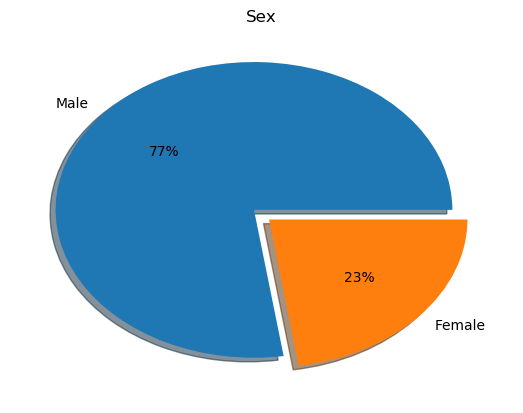

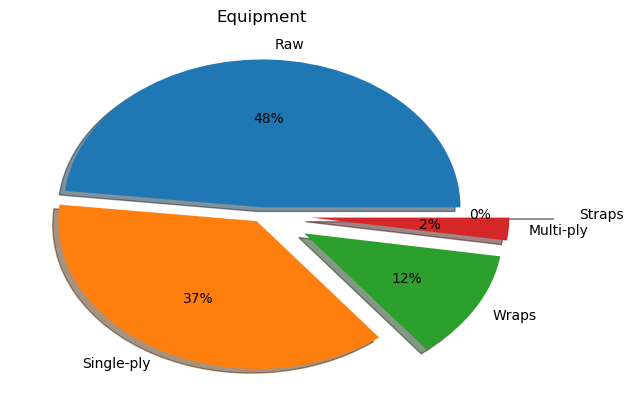

In [15]:
sexcounts = df['Sex'].value_counts()
plt.pie(sexcounts, labels=['Male', 'Female'], explode=[0.05, 0.05], shadow=True, autopct='%.0f%%')
plt.title('Sex')
plt.show()

equipmentcounts = df['Equipment'].value_counts()
labels = equipmentcounts.index.tolist()

plt.pie(equipmentcounts, labels=labels, explode=[0.05, 0.05, 0.25, 0.25, 0.5], shadow=True, autopct='%.0f%%')
plt.title('Equipment')
plt.show()


Pie charts breaking down the sex of the participants and the type of equipment used in the tournements.